# **Load Libraries**

In [1]:
# Load libraries
library(terra)
library(geodata)
library(maxnet) 
library(predicts)
library(ggplot2)
library(tidyterra)
library(pROC)
library(MuMIn)
library(corrplot)
library(car)
library(dplyr)
library(effects)
library(gridExtra)
library(randomForest)
library(pdp)

terra 1.8.70


Attaching package: ‘tidyterra’


The following object is masked from ‘package:stats’:

    filter


Type 'citation("pROC")' for a citation.


Attaching package: ‘pROC’


The following objects are masked from ‘package:stats’:

    cov, smooth, var


corrplot 0.95 loaded

Loading required package: carData


Attaching package: ‘dplyr’


The following object is masked from ‘package:car’:

    recode


The following objects are masked from ‘package:terra’:

    intersect, union


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


lattice theme set by effectsTheme()
See ?effectsTheme for details.


Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine


randomForest 4.7-1.2

Type rfNews() to see new features/changes/bug fixes.


Attaching package: ‘randomForest’


The following object is masked from ‘package:gridEx

---
# **Observational Data**

## **Read In and Clean Observational Data**

Observational data was downloaded from the following sources:
- **imos_data:** IMOS - National Reef Monitoring Network Sub-Facility - Benthic cover data (in situ surveys) (https://catalogue-imos.aodn.org.au/geonetwork/srv/eng/catalog.search#/metadata/ec424e4f-0f55-41a5-a3f2-726bc4541947)
- **gbif_data:** GBIF.org (06 October 2025) GBIF Occurrence Download https://doi.org/10.15468/dl.az6pza

Data was cleaned in Microsoft Excel to only include latitude and longitude columns before being saved as csv files to the "Data" folder. No other cleaning was conducted in Microsoft Excel.

In [2]:
# Read in observations data
imos_data <- read.csv(file = "Data/IMOS_Data_2010.csv")
gbif_data <- read.csv(file = "Data/GBIF_Data_2010.csv")

In [3]:
# Combine data
obs_data <- rbind(imos_data, gbif_data)

In [4]:
# Filter obs_data for observations at unique coordinates, using the distinct function from the dplyr package
obs_unique_full <- obs_data %>% distinct(longitude, latitude)

In [5]:
# Check the data
summary(obs_unique_full)

   longitude        latitude     
 Min.   :115.0   Min.   :-43.63  
 1st Qu.:145.0   1st Qu.:-42.20  
 Median :147.9   Median :-38.28  
 Mean   :145.8   Mean   :-38.07  
 3rd Qu.:150.2   3rd Qu.:-35.11  
 Max.   :153.6   Max.   :-28.19  

In [6]:
# Count the number of observation points
nrow(obs_unique_full)

[1] 640

**We have 640 presence points.**

## **Geographic Extent**

### Determine the Geographic Extent of the Observational Data

We need to define the geographic extent in which our presence points are located.

In [7]:
# Determine the min and max values for longitude and latitude of the observational data
min_lon <- floor(min(obs_unique_full$longitude))
max_lon <- ceiling(max(obs_unique_full$longitude))
min_lat <- floor(min(obs_unique_full$latitude))
max_lat <- ceiling(max(obs_unique_full$latitude))

# Store the boundaries as a single object using the ext() function from the Terra package
geographic_extent_full <- ext(x = c(min_lon, max_lon, min_lat, max_lat))

### View Presence Points on a Map

We now need to download a world map using the Geodata package, and crop it to the area defined in geographic_extent_full.

In [8]:
# Download world map data using the Geodata package
world_map <- world(resolution = 3, path = "Data/")

In [9]:
# Crop the map to geographic_extent_full
obs_map_full <- crop(x = world_map, y = geographic_extent_full)
obs_map_full

 class       : SpatVector 
 geometry    : polygons 
 dimensions  : 1, 2  (geometries, attributes)
 extent      : 115, 153.63, -43.63865, -28  (xmin, xmax, ymin, ymax)
 coord. ref. : +proj=longlat +datum=WGS84 +no_defs 
 names       : GID_0    NAME_0
 type        : <chr>     <chr>
 values      :   AUS Australia

We can now plot and view our presence points on a map.

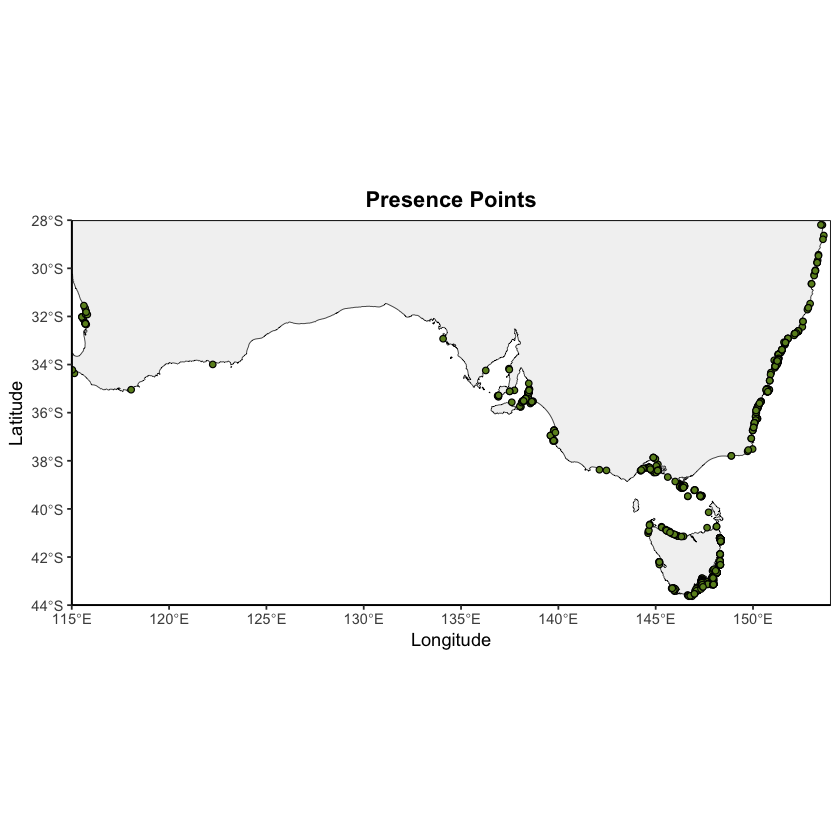

In [10]:
# Plot the blank base map
presence_map_full <- ggplot(obs_map_full) + # Create a ggplot from the obs_map_full SpatVector
    geom_spatvector(fill = "grey95", # Make the fill of the land polygons grey, and the outline black
                    colour = "black") + 
    labs(x = "Longitude", # Label the x and y axes of the ggplot, and set the title
         y = "Latitude",
         title = "Presence Points") +
    theme_classic() + # Use the classic ggplot theme
    theme(panel.border = element_rect(fill = NA), # Draw a border around the ggplot area
          plot.title = element_text(hjust = 0.5, face = "bold")) + # Centre the title and make it bold
    coord_sf(xlim = c(xmin(geographic_extent_full), xmax(geographic_extent_full)), # Ensure the ggplot shows the entire geographic extent
             ylim = c(ymin(geographic_extent_full), ymax(geographic_extent_full)),
             expand = FALSE) + # Remove the margin around the plot

# Add presence points to the map
    geom_point(data = obs_unique_full, # Plot points from the obs_unique_full dataframe
               aes(x = longitude, y = latitude), # Plot longitude on the x axis, and latitude on the y axis
               shape = 21, # Make each point a coloured circle with a border
               size = 1.5, # Adjust the size of the points on the map
               colour = "black", # Choose the outline of the points
               fill = "olivedrab") # Choose the fill colour of the points

# View the map of presence points
presence_map_full

## **Cropped Geographic Extent**

### Crop Presence Points

Presence points are mainly concentrated on the southeast coast of Australia. This is likely due to sampling bias - more data is collected in regions with more research activity and larger urban populations (and therefore more citizen scientists), rather than where Ecklonia Radiata is actually most abundant. In Western Australia, for example, presence points are clustered around Perth (32.0°S, 115.9°E) - a capital city - with very few observations elsewhere. Likewise, along southern Australia, there are very few presence points extending further west than Adelaide (34.9°S, 138.6°E). Because more people live across the full extent of Australia's eastern coastline, more citizen scientists can contribute data to GBIF across this region. Research on kelp forests in Australia is also typically concentrated in this area.

Ecklonia Radiata is not necessarily absent from areas without presence points along Australia's southern and western coastlines. Instead, it is more likely that data has not been collected in these regions. However, the lack of presence points in these areas may bias our species distribution models, making it appear as though conditions in these areas are not suitable for kelp. 

**To reduce the impact of this bias, we will crop the geographic extent to the longitude that includes 80% of all presence records on the eastern side.**

In [11]:
# Find longitude that includes 20% of data on the western side, and 80% on eastern side
long_80 <- quantile(obs_unique_full$longitude, probs = 0.2)
long_80

20% 
143.87

**80% of presence points are located at longitudes greater than 143.87°E.** We now need to filter our presence points to only include those above this longitude.

In [12]:
# Filter presence points to only include longitudes greater than long_80
obs_unique <- obs_unique_full %>%
    filter(longitude > long_80)

In [13]:
# Check the new number of presence points
nrow(obs_unique)

[1] 512

**We now have 512 presence points in our obs_unique dataset.** This is down from 640 presence points.

The next step is to crop the geographic extent to the latitude that includes 80% of all presence records.

In [14]:
# Identify the exact longitude of the western-most presence point included in our cropped 80% of data.
long_80_exact <- floor(min(obs_unique$longitude))

# Crop geographic extent to the latitude that includes 80% of occurence data.
geographic_extent <- ext(x = c(long_80_exact, max_lon, min_lat, max_lat))

### View cropped presence points on a map

In [15]:
# Crop world_map to the new geographic extent
obs_map <- crop(x = world_map, y = geographic_extent)

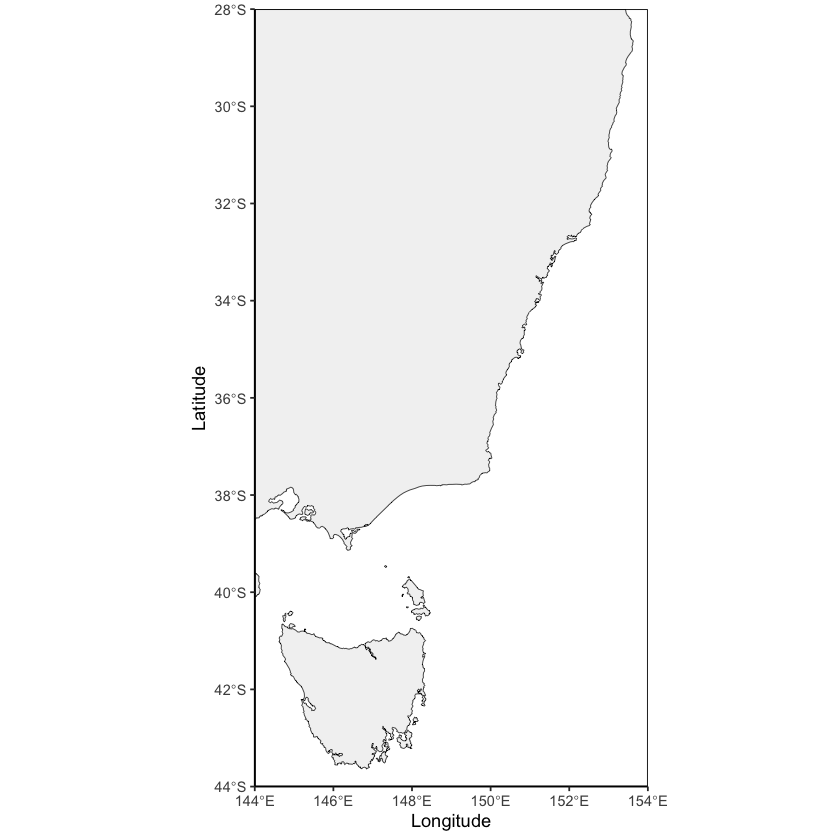

In [16]:
# Create a new blank base map
base_map <- ggplot(obs_map) +
    geom_spatvector(fill = "grey95", colour = "black") +
    labs(x = "Longitude",
        y = "Latitude") +
    theme_classic() +
    theme(panel.border = element_rect(fill = NA),
          plot.title = element_text(hjust = 0.5, face = "bold")) +
    coord_sf(xlim = c(xmin(geographic_extent), xmax(geographic_extent)),
             ylim = c(ymin(geographic_extent), ymax(geographic_extent)),
             expand = FALSE)

base_map

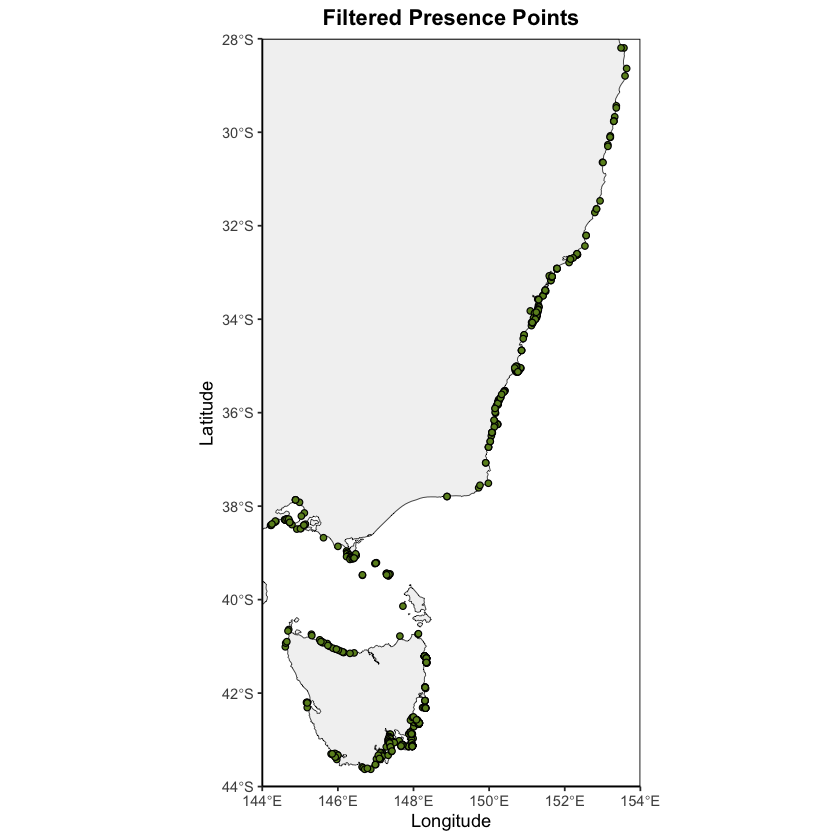

In [17]:
# View filtered presence points on map
presence_map <- base_map +
    geom_point(data = obs_unique,
        aes(x = longitude, y = latitude),
        shape = 21,
        size = 1.5,
        colour = "black",
        fill = "olivedrab") +
    labs(title = "Filtered Presence Points")

presence_map

## **Create Sample Extent**

The sample extent is the area we will sample our background/pseuodo-absence points from. When defining a sample extent, the following points need to be considered:
- Pseudo-absence points should not be generated further west than our long_80_exact boundary (the edge of our cropped 80% of presence points). This is to avoid pseuodo-absence points being generated in areas where we have removed presence points. The minimum longitude of the sample extent should therefore be long_80_exact.
- The maximum longitude should be slightly larger than in the geographic extent, to capture where kelp is absent, but remain near to the Australian coastline.
- The minimum and maximum latitude should also be larger than in the geographic extent, to capture where kelp is absent, without extending too far beyond the Autralian region (where observations are unlikely to have been recorded).

In [18]:
# Create a sample extent
min_lon_s <- long_80_exact
max_lon_s <- 155
min_lat_s <- -45
max_lat_s <- -20

# Store the boundaries as a single object
sample_extent <- ext(x = c(min_lon_s, max_lon_s, min_lat_s, max_lat_s))



---


# **Environmental Data: 2010-2020**

Environmental data was downloaded from BioOracle v3.0 for present-day conditions (2010-2020), and future conditions in 2040-2050 and 2090-2100 under SSP1-1.9, SSP2-4.5 and SSP3-7.0. Surface layer data for the following variables were downloaded:
- Long-term minimum, long-term maximum and mean ocean temperature (°C)
- Long-term minimum and long-term maximum sea water velocity (m/s)
- Mean nitrate (mmol/m^3)
- Mean phosphate (mmol/m^3)
- Long-term minimum and long-term maximum primary productivity (mmol/m^3)
- Mean salinity
- Mean pH
- Mean dissolved molecular oxygen (mmol/m^3)

Minimum bathymetry (m) was also downloaded for present-day conditions. 

This data has a spatial resolution of 0.05°.

View the "Download Data" notebook to see how this data was downloaded.

**Reference:** Assis, J., Fernández Bejarano, S.J., Salazar, V.W., Schepers, L., Gouvêa, L., Fragkopoulou, E., Leclercq, F., Vanhoorne, B., Tyberghein, L., Serrão, E.A., Verbruggen, H., De Clerck, O. (2024) Bio-ORACLE v3.0. Pushing marine data layers to the CMIP6 Earth system models of climate change research. *Global Ecology and Biogeography.* DOI: 10.1111/geb.13813

## **Read in Environmental Data for 2010-2020**

In [19]:
# Read in environmental data for 2010
files_2010 <- list.files(path="Data/BioOracle_Data/2010", full.names=TRUE)
envdata_2010 <- rast(files_2010[1:length(files_2010)])
envdata_2010

class       : SpatRaster 
size        : 801, 1301, 12  (nrow, ncol, nlyr)
resolution  : 0.04999999, 0.05  (x, y)
extent      : 100, 165.05, -50, -9.95  (xmin, xmax, ymin, ymax)
coord. ref. : lon/lat WGS 84 (CRS84) (OGC:CRS84) 
sources     : DissolvedOxygen_Mean_2010.nc  
              Nitrate_Mean_2010.nc  
              pH_Mean_2010.nc  
              ... and 9 more sources
varnames    : o2_mean (Average DissolvedMolecularOxygen) 
              no3_mean (Average Nitrate) 
              ph_mean (Average pH) 
              ...
names       :    o2_mean,   no3_mean, ph_mean,   po4_mean, phyc_ltmax, phyc_ltmin, ... 
unit        : MMol' 'M-3, MMol' 'M-3,       1, MMol' 'M-3, MMol' 'M-3, MMol' 'M-3, ... 
time        : 2010-01-01 UTC 

In [20]:
# Crop environmental data to sample extent 
envdata_cropped <- crop(envdata_2010, sample_extent)

## **View Environmental Data For 2010-2020**

The environmental data for 2010-2020 will be used to train and test our species distribution models. It is therefore important to visualise this data across the sample extent, to understand how each variable may influence the model.

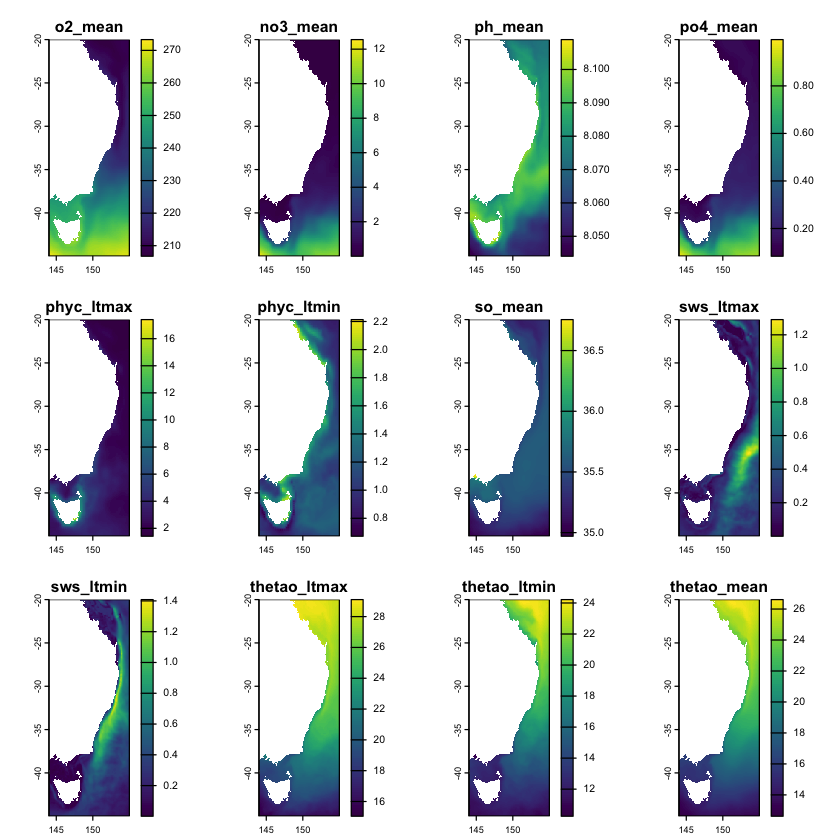

In [21]:
# Plot the environmental variables for 2010 across the sample extent
plot(envdata_cropped)

Interpreting the maps:
- **Chemical Variables (o2_mean, ph_mean, so_mean):** o2_mean varies across the sample extent by about 60 mmol/m^3 - with northern areas typically having lower oxygen concentrations than southern areas. It looks like it is likely to correlate with the temperature variables. ph_mean varies across the sample extent by about 0.05 units, and so_mean varies by about 1.75 units.
- **Nutrient Variables (no3_mean, po4_mean):** no3_mean shows more variation across the sample extent than po4_mean (12 mmol/m^3 compared to 1 mmol/m^3). For both nutrient variables, however, most of this variation occurs around southern Tasmania. Nutrient conditions are relatively consistent across most of the east coast of Australia. 
- **Primary Productivity Variables (phyc_ltmax, phyc_ltmin):** phyc_ltmax shows more variation across the sample extent than phyc_ltmin (16 mmol/m^3 compared to 1.6 mmol/m^3). Highest levels of phyc_ltmax occur around Tasmania, with lower levels and less variation along the coast of mainland Australia. Highest levels of phyc_ltmin occur in shallow coastal areas, with lower levels in deeper waters. 
- **Current Velocity Variables (sws_ltmax, sws_ltmin):** Both variables vary across the sample extent by about 1.3-1.4 m/s. There is more variation in sws_ltmin near the coastline (at depths where Ecklonia radiata may be located) than sws_ltmax. The sws_ltmax is more consistent near the coastline, with variation occuring further offshore. It is therefore likely that sws_ltmin will have a greater impact on the distribution of ecklonia radiata than sws_ltmax.
- **Temperature Variables (thetao_ltmax, thetao_ltmin, thetao_mean):** All temperature variables vary across the sample extent by about 14°C - with northern areas typically being warmer than southern areas.

## **Create a Bathymetry Mask**

**Ecklonia Radiata occurs at max depths of 40-50 m** (Marzinelli et al., 2015). Areas with a minimum bathymetry <50 m need to be masked, so predictions are only made within the depth range where Ecklonia Radiata can realistically occur.

In [22]:
# Read in bathymetry data 
bath_min <- rast("Data/BioOracle_Data/Bath_Min.nc")

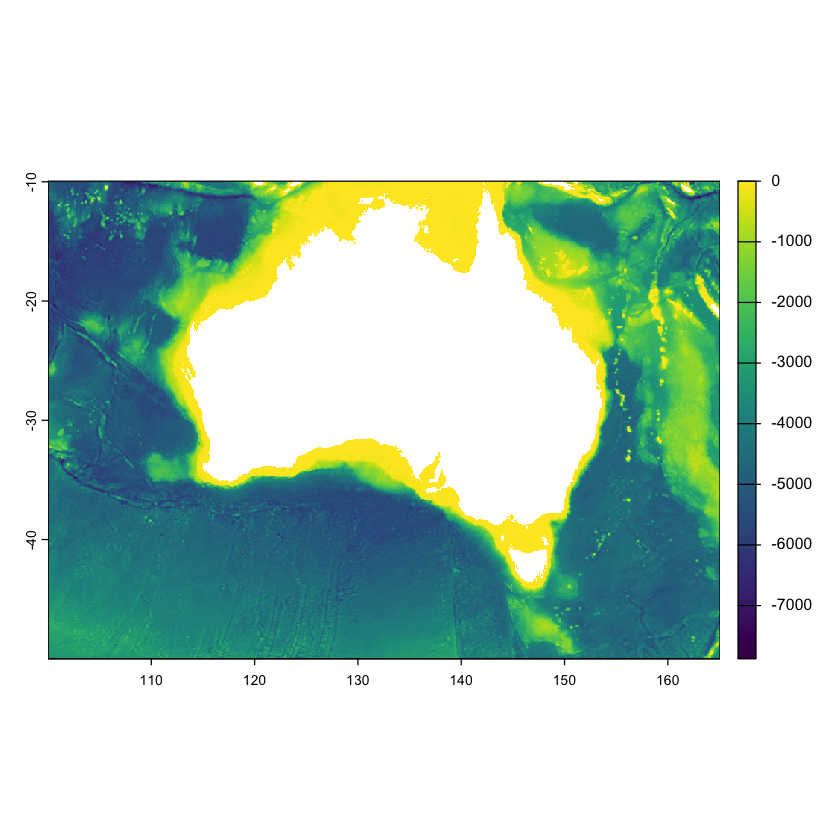

In [23]:
# Check bathymetry data
plot(bath_min)

In [24]:
# If bath_min is greater than or equal to -50, assign a value of 1, else assign a value of NA
mask50 <- ifel(bath_min >= -50, 1, NA)

In [25]:
# Crop mask to sample extent
mask50_sample <- crop(mask50, sample_extent)

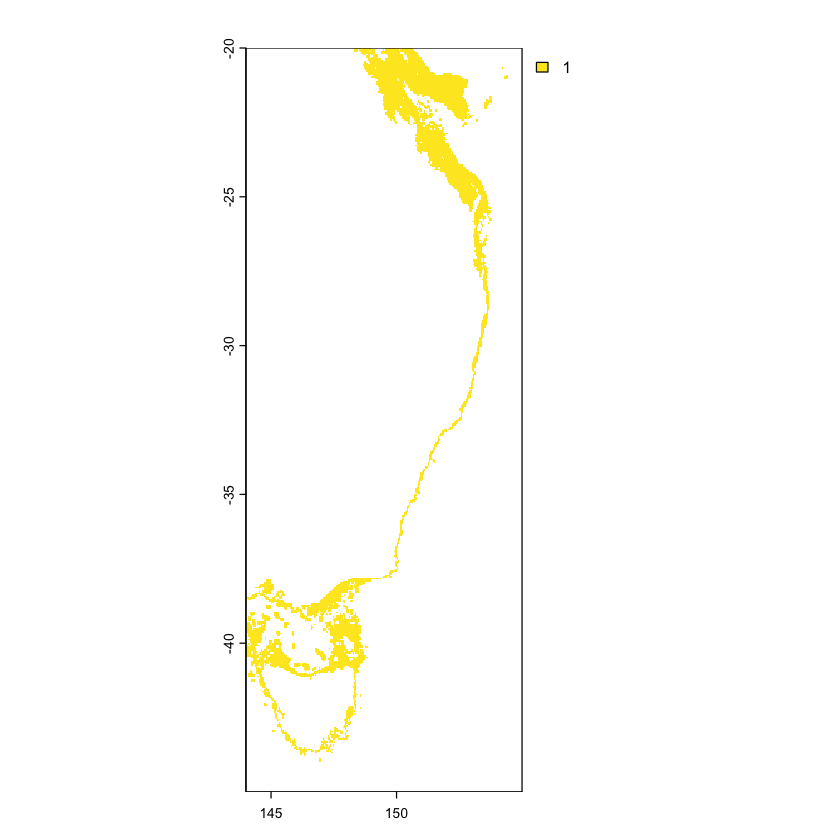

In [26]:
# View masked area across sample extent
plot(mask50_sample)

We then need to remove presence points from the mask. This is so that background points are not generated there in the next step.

In [27]:
# Make a copy of mask50_sample so we are not editing it directly.
mask50_cleaned <- mask50_sample

# Use cellFromXY to find which points in mask50_cleaned correspond to obs_unique points, and give these NA values.
mask50_cleaned[cellFromXY(mask50_cleaned, obs_unique)] <- NA



---


# **Background Points**

## **Sample background points from the mask**

We now need to sample 1,000 background points from within our masked sample extent.

In [28]:
# Set the seed for the random number generator to ensure we get the same random results every time
set.seed(20250917)

# Randomly sample background points
background <- spatSample(x = mask50_cleaned,
                         size = 1000, # generate 1000 background points
                         values = FALSE, # don't need values from mask50_cleaned
                         na.rm = TRUE, # don't generate background points in NA cells of mask50_cleaned
                         xy = TRUE) # return the coordinates of the background points generated

In [29]:
# Create a dataframe of the background points so we can use ggplot
background_df <- as.data.frame(background)
names(background_df) <- c("longitude", "latitude")

# Check the dataframe
head(background_df)

,longitude,latitude
,<dbl>,<dbl>
1,153.425,-24.975
2,148.175,-42.275
3,150.325,-21.725
4,149.125,-20.425
5,152.975,-22.325
6,152.475,-32.475


## **View background points on map**

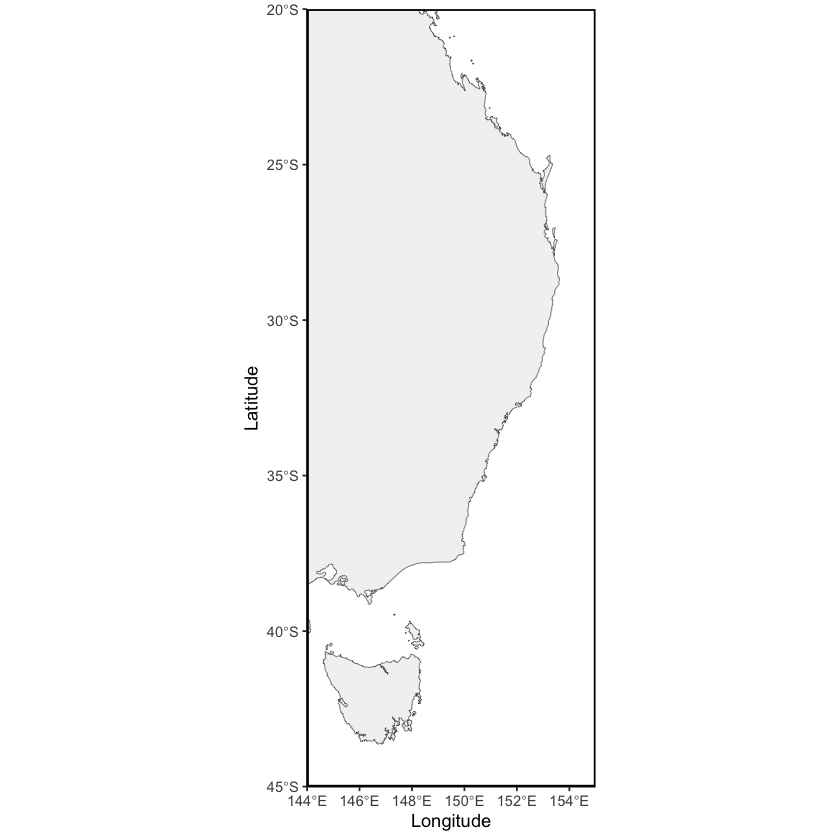

In [30]:
# Crop map area to sample extent
sample_map <- crop(world_map, sample_extent)

# Create base map of sample extent
sample_map <- ggplot(sample_map) +
    geom_spatvector(fill = "grey95") +
    labs(x = "Longitude",
        y = "Latitude") +
    theme_classic() +
    theme(panel.border = element_rect(colour = "black", fill = NA, linewidth = 1),
        plot.title = element_text(hjust = 0.5, face = "bold")) +
    coord_sf(xlim = c(xmin(sample_extent), xmax(sample_extent)),
         ylim = c(ymin(sample_extent), ymax(sample_extent)),
         expand = FALSE)

sample_map

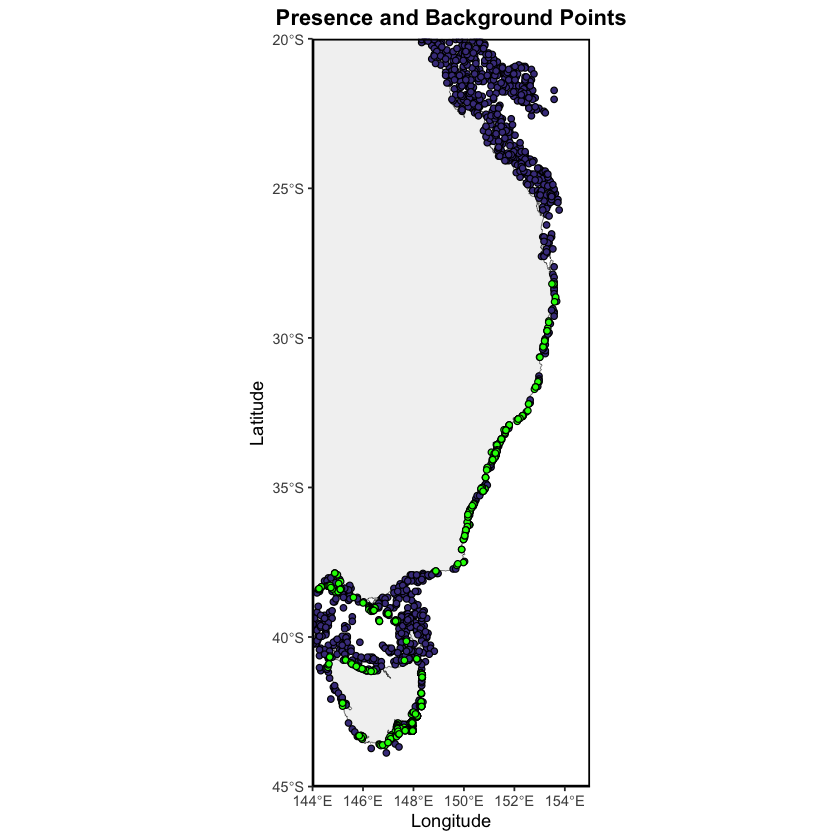

In [31]:
# Add background and presence points to sample map
background_map <- sample_map +
    geom_point(data = background_df, # background points
        aes(x = longitude, y = latitude),
        shape = 21,
        size = 1.5,
        colour = "black",
        fill = "darkslateblue") +
    geom_point(data = obs_unique, # presence points
        aes(x = longitude, y = latitude),
        shape = 21,
        size = 1.5,
        colour = "black",
        fill = "green") +
    labs(title = "Presence and Background Points")

background_map



---


# **Presence-Absence Dataframe**

## **Create PA Dataframe**

The next step is to create a dataframe of presence and absence (background) points. 

In [32]:
# Create a dataframe of presence points from obs_unique
presence <- obs_unique

# Add a column indicating presence
presence$pa <- 1

In [33]:
# Create a dataframe of absence points from background_df
absence <- background_df

# Add column indicating absence
absence$pa <- 0

In [34]:
# Join presence and absence data into a single dataframe 
pa_points <- rbind(presence, absence)

In [35]:
# Check the pa_points dataframe
head(pa_points)

,longitude,latitude,pa
,<dbl>,<dbl>,<dbl>
1,146.45,-39.06,1
2,146.47,-39.06,1
3,146.48,-39.05,1
4,146.47,-39.04,1
5,146.48,-39.06,1
6,146.47,-39.02,1


We now have the coordinates of our presence and absence points in a single dataframe, as well as a column indicating whether they are a presence (1) or absence (0) point.

## **Extract Environmental Data for PA Points**

### Extract Environmental Data for PA Points

We need to extract the 2010-2020 environmental data corresponding to each set of coordinates in the pa_points dataframe.

In [36]:
# Get the coordinates of all presence and absence points
coords <- pa_points[, c("longitude", "latitude")]

In [37]:
# Use the extract function from the Terra package to extract BioOracle data for each coordinate. 
envdata_extract <- extract(
    x = envdata_2010,
    y = coords,
    ID = FALSE)

In [38]:
# Check the envdata_extract dataframe
head(envdata_extract)

,o2_mean,no3_mean,ph_mean,po4_mean,phyc_ltmax,phyc_ltmin,so_mean,sws_ltmax,sws_ltmin,thetao_ltmax,thetao_ltmin,thetao_mean
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,247.3037,0.07803244,8.082132,0.1105563,3.108581,1.397702,35.76738,0.2091638,0.06519728,19.98576,12.66339,16.03495
2,247.3037,0.07803244,8.082132,0.1105563,3.108581,1.397702,35.76738,0.2091638,0.06519728,19.98576,12.66339,16.03495
3,247.3037,0.07803244,8.082132,0.1105563,3.108581,1.397702,35.76738,0.2091638,0.06519728,19.98576,12.66339,16.03495
4,247.2221,0.07520513,8.081440,0.1094683,3.141531,1.451829,35.77265,0.1377461,0.04271005,20.14606,12.54012,16.04625
5,247.3037,0.07803244,8.082132,0.1105563,3.108581,1.397702,35.76738,0.2091638,0.06519728,19.98576,12.66339,16.03495
6,247.2221,0.07520513,8.081440,0.1094683,3.141531,1.451829,35.77265,0.1377461,0.04271005,20.14606,12.54012,16.04625


### Check for NA values

In [39]:
# Count the number of rows that contain an NA values 
sum(!complete.cases(envdata_extract))

[1] 222

**We do not have environmental data for 222 PA points.** 

These should all be presence points, since our absence/background points were generated within our masked BioOracle bathymetry data. Let's check that this is the case.

In [40]:
# Identify coordinates of missing data
missing_envdata_222 <- which(!complete.cases(envdata_extract))
missing_coords_222 <- coords[missing_envdata_222, ]

# Merge the missing_coords_222 and pa_points dataframes only where the coords match
check_missingcoords_222 <- merge(missing_coords_222, pa_points, by = c("longitude", "latitude"))

# Count number of rows where pa = 1 (presence)
sum(check_missingcoords_222$pa == 1)

[1] 222

**All 222 of our points with missing environmental data are therefore presence points.**

Let's view where these points are on a map.

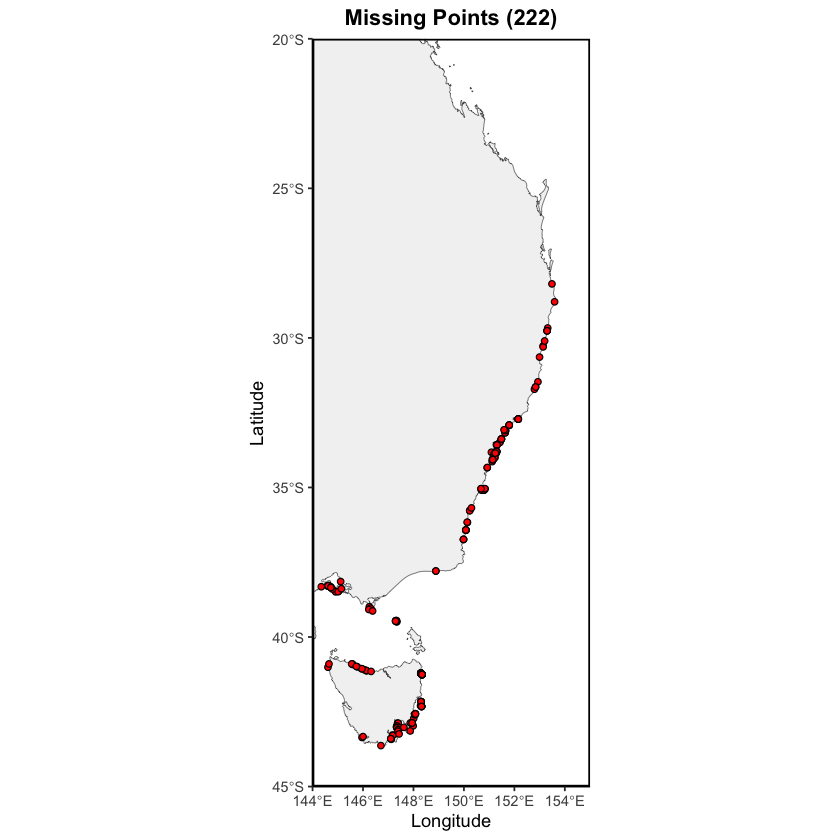

In [41]:
# View where missing points are on map
na_map_222 <- sample_map +
    geom_point(data = missing_coords_222,
        aes(x = longitude, y = latitude),
        shape = 21, size = 1.5,
        colour = "black", fill = "red") +
    labs(title = "Missing Points (222)")

na_map_222

Looking at the map, we can see that the presence points with NA data mostly occurred right on the coastline. It is likely that the coarse resolution of the environmental data from BioOracle does not capture these locations. This needs to be addressed.

### Nearest Neighbour

We can deal with presence points that do not have environmental data by extracting values from their nearest non-missing neighbour cells.

In [42]:
# Identify non-NA cells in environmental data
nonNA_envdata <- ifel(!is.na(envdata_2010[[1]]), 1, NA)

# Convert these non-NA cells into a SpatVector of points locations
ocean_points <- as.points(nonNA_envdata, values = FALSE, na.rm = TRUE)

In [43]:
# Make the missing_coords_222 dataframe a SpatVector
missing_points <- vect(missing_coords_222,
                       geom = c("longitude", "latitude"),
                       crs = crs(envdata_2010))

Use the nearest() function from the Terra package to find the nearest neighbour.

In [44]:
# For each missing point, find the nearest ocean cell
nearest_points <- nearest(missing_points, ocean_points)

# Check structure of nearest_points
str(nearest_points)
summary(nearest_points)

S4 class 'SpatVector' [package "terra"]


    from_id           from_x          from_y           to_id       
 Min.   :  1.00   Min.   :144.3   Min.   :-43.63   Min.   :297268  
 1st Qu.: 56.25   1st Qu.:147.4   1st Qu.:-41.25   1st Qu.:371234  
 Median :111.50   Median :148.3   Median :-39.02   Median :479822  
 Mean   :111.50   Mean   :148.9   Mean   :-38.11   Mean   :467216  
 3rd Qu.:166.75   3rd Qu.:151.1   3rd Qu.:-34.02   3rd Qu.:537161  
 Max.   :222.00   Max.   :153.6   Max.   :-28.19   Max.   :597196  
      to_x            to_y           distance    
 Min.   :144.4   Min.   :-43.62   Min.   : 2103  
 1st Qu.:147.4   1st Qu.:-41.23   1st Qu.: 3143  
 Median :148.3   Median :-39.00   Median : 3647  
 Mean   :149.0   Mean   :-38.11   Mean   : 3991  
 3rd Qu.:151.2   3rd Qu.:-34.04   3rd Qu.: 4186  
 Max.   :153.6   Max.   :-28.12   Max.   :20607  

**Looking at the "distance" summary above, we can see that the nearest neighbor cells range from 2.1 km to 20.6 km away from the original presence points.**

BioOracle data has a spatial resolution of 0.05°, which is roughly equivalent to 5 km at the equator. Therefore, environmental data within 5 km of a presence point is likely to provide a reliable estimate of local conditions. In many cases, a nearest neighbour within this range may just be the first available ocean cell in the BioOracle dataset along the coast.

10 km corresponds to roughly two grid cells in the BioOracle dataset. This is a large distance, but may still provide an okay estimate of local environmental conditions. Given the small sample size of our observations dataset, it is important to retain as many presence points as possible. We will therefore include environmental data from nearest neighbours up to 10 km away from the original presence point.

However, distances beyond 10 km are very unlikely to provide an accurate representation of local environmental conditions. Despite the need to retain presence points, it is difficult to justify including nearest neighbours further than 10 km away. 

**We will therefore limit the nearest neighbours to only include those less than 10 km (10,000 m) away from the original presence points.**

In [45]:
# Filter nearest_points to only include those within 10km of presence points 
nearest_limited <- nearest_points[nearest_points$distance <= 10000]

# Check structure of nearest_limited
summary(nearest_limited)

    from_id          from_x          from_y           to_id       
 Min.   :  1.0   Min.   :144.3   Min.   :-43.63   Min.   :297268  
 1st Qu.: 56.0   1st Qu.:147.4   1st Qu.:-41.25   1st Qu.:371918  
 Median :111.0   Median :148.3   Median :-39.04   Median :480471  
 Mean   :111.1   Mean   :148.9   Mean   :-38.12   Mean   :467659  
 3rd Qu.:166.0   3rd Qu.:151.1   3rd Qu.:-34.07   3rd Qu.:537161  
 Max.   :222.0   Max.   :153.6   Max.   :-28.19   Max.   :597196  
      to_x            to_y           distance   
 Min.   :144.4   Min.   :-43.62   Min.   :2103  
 1st Qu.:147.4   1st Qu.:-41.23   1st Qu.:3143  
 Median :148.3   Median :-39.02   Median :3647  
 Mean   :148.9   Mean   :-38.13   Mean   :3915  
 3rd Qu.:151.2   3rd Qu.:-34.08   3rd Qu.:4179  
 Max.   :153.6   Max.   :-28.12   Max.   :9354  

In [46]:
# Get the matched ocean cell indicies
to_ids <- nearest_limited$to_id

# Subset those ocean points
nearest_ocean_points <- ocean_points[to_ids, ]

In [47]:
# Extract environmental data for each nearest neighbour
nearest_extract <- extract(
    x = envdata_2010,
    y = nearest_ocean_points,
    ID = FALSE)

In [48]:
# Identify rows in the missing_envdata_222 dataset that need to be filled
fill_missingrows <- missing_envdata_222[nearest_limited$from_id]

# Add nearest neighbour data into envdata_extract
envdata_extract[fill_missingrows, ] <- nearest_extract

In [49]:
# Count the number of rows that still contain an NA values 
sum(!complete.cases(envdata_extract))

[1] 1

**We now only have 1 presence point without environmental data.** 

Let's view where this missing point is on a map.

In [50]:
# Identify coordinates of missing data
missing_envdata_1 <- which(!complete.cases(envdata_extract))
missing_coords_1 <- coords[missing_envdata_1, ]

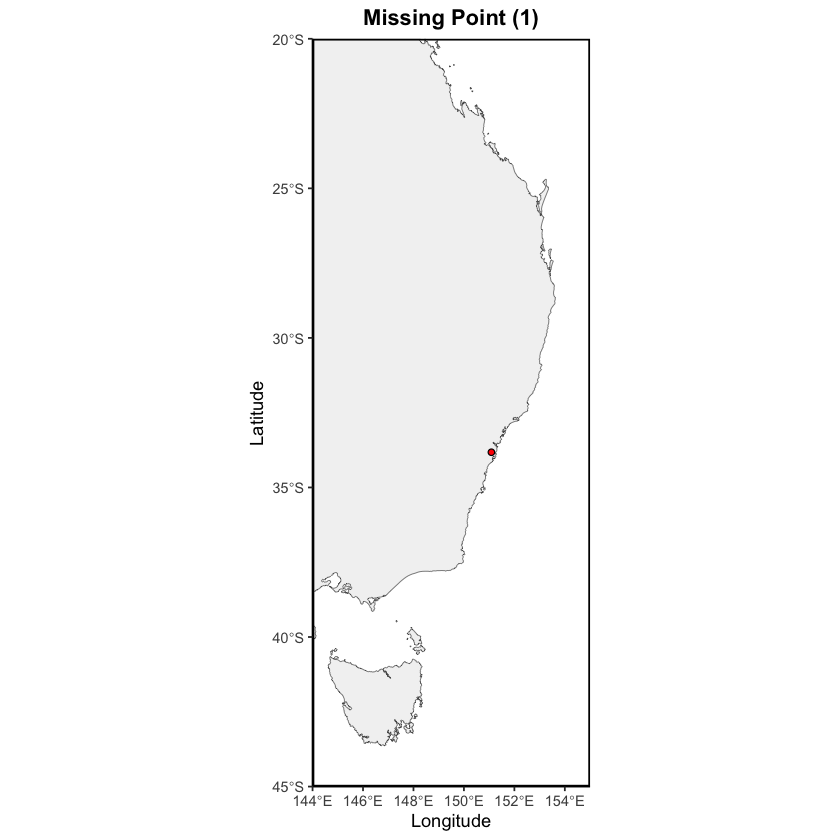

In [51]:
# View where final missing point is on map
na_map_1 <- sample_map +
    geom_point(data = missing_coords_1,
        aes(x = longitude, y = latitude),
        shape = 21, size = 1.5,
        colour = "black", fill = "red") +
    labs(title = "Missing Point (1)")

na_map_1

We will remove this presence point from our dataset in a later step.

**Our final number of presence points is therefore 511.**

## **Combine PA and Environmental Dataframes**

### Combine Dataframes

We now have a dataframe of PA coordinates, and a separate dataframe of environmental conditions at these points. We need to combine these dataframes together. 

In [52]:
# Combine the presence-absence and environmental datasets together
pa_envdata_full <- cbind(pa_points, envdata_extract)

### Remove the Remaining NA Point

We need to remove the final leftover PA point without environmental data from the dataframe.

In [53]:
# Remove leftover NA values from pa_envdata
pa_envdata_full <- drop_na(pa_envdata_full)

In [54]:
# Check the pa_envdata dataframe
str(pa_envdata_full)

'data.frame':	1511 obs. of  15 variables:
 $ longitude   : num  146 146 146 146 146 ...
 $ latitude    : num  -39.1 -39.1 -39 -39 -39.1 ...
 $ pa          : num  1 1 1 1 1 1 1 1 1 1 ...
 $ o2_mean     : num  247 247 247 247 247 ...
 $ no3_mean    : num  0.078 0.078 0.078 0.0752 0.078 ...
 $ ph_mean     : num  8.08 8.08 8.08 8.08 8.08 ...
 $ po4_mean    : num  0.111 0.111 0.111 0.109 0.111 ...
 $ phyc_ltmax  : num  3.11 3.11 3.11 3.14 3.11 ...
 $ phyc_ltmin  : num  1.4 1.4 1.4 1.45 1.4 ...
 $ so_mean     : num  35.8 35.8 35.8 35.8 35.8 ...
 $ sws_ltmax   : num  0.209 0.209 0.209 0.138 0.209 ...
 $ sws_ltmin   : num  0.0652 0.0652 0.0652 0.0427 0.0652 ...
 $ thetao_ltmax: num  20 20 20 20.1 20 ...
 $ thetao_ltmin: num  12.7 12.7 12.7 12.5 12.7 ...
 $ thetao_mean : num  16 16 16 16 16 ...


### Remove Longitude and Latitude Columns

We no longer need the longitude and latitude columns in the dataframe. We only want to know what the conditions are at each presence and absence point - it no longer matters where these points are located. Let's remove the longitude and latitude columns.

In [55]:
# Identify the longitude and latitude columns
drop_cols <- which(colnames(pa_envdata_full) %in% c("longitude", "latitude"))

In [56]:
# Remove the coordinates from the dataframe, leaving only presence absence points and env data
pa_envdata <- pa_envdata_full[, -drop_cols]

In [57]:
# Check final dataframe
head(pa_envdata)

,pa,o2_mean,no3_mean,ph_mean,po4_mean,phyc_ltmax,phyc_ltmin,so_mean,sws_ltmax,sws_ltmin,thetao_ltmax,thetao_ltmin,thetao_mean
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,247.3037,0.07803244,8.082132,0.1105563,3.108581,1.397702,35.76738,0.2091638,0.06519728,19.98576,12.66339,16.03495
2,1,247.3037,0.07803244,8.082132,0.1105563,3.108581,1.397702,35.76738,0.2091638,0.06519728,19.98576,12.66339,16.03495
3,1,247.3037,0.07803244,8.082132,0.1105563,3.108581,1.397702,35.76738,0.2091638,0.06519728,19.98576,12.66339,16.03495
4,1,247.2221,0.07520513,8.081440,0.1094683,3.141531,1.451829,35.77265,0.1377461,0.04271005,20.14606,12.54012,16.04625
5,1,247.3037,0.07803244,8.082132,0.1105563,3.108581,1.397702,35.76738,0.2091638,0.06519728,19.98576,12.66339,16.03495
6,1,247.2221,0.07520513,8.081440,0.1094683,3.141531,1.451829,35.77265,0.1377461,0.04271005,20.14606,12.54012,16.04625




---


# **Split into Training and Testing Data**

80% of our presence-absence data will be used to train the species distribution models, and 20% will be used to test them. To do this, we need to separate pa_envdata into training and testing dataframes.

In [58]:
# Set Seed
set.seed(12345)

# Create 5 groups to split the data into using the folds function from the predicts package
fold <- folds(
    x = pa_envdata, # Make folds using the pa_envdata dataset
    k = 5, # Split the data into 5 folds
    by = pa_envdata$pa # Each fold should have a similar proportion of presence and absence points
)

In [59]:
# Check how much data is in each fold
table(fold)

fold
  1   2   3   4   5 
302 302 303 302 302 

In [60]:
# Create a testing dataset from fold 1 (20% of data)
testing <- pa_envdata[fold == 1, ]

In [61]:
# Create a training dataset from folds 2-5 (80% of data)
training <- pa_envdata[fold != 1, ]



---


# **Generalised Linear Model (GLM)**

## **Variable Selection**

### Multicollinearity

Before creating a GLM, we need to determine which variables to include.

Multicollinearity occurs when predictor variables in a model are highly correlated. This reduces the predictive reliability of the model. We only want to keep variables that are ecologically important and statistcally independent. 

#### Correlation Matrix

We can generate a correlation matrix to show how correlated environmental variables are with each other. We will use Pearson's correlation (r) to do this.

In [62]:
# Drop the response column ('pa') from the training dataset to keep only environmental variables
cor_data <- training[, colnames(training) != "pa"]

# View the structure to confirm only environmental variables remain
str(cor_data)

'data.frame':	1209 obs. of  12 variables:
 $ o2_mean     : num  247 247 247 247 247 ...
 $ no3_mean    : num  0.078 0.0752 0.0752 0.0776 0.0776 ...
 $ ph_mean     : num  8.08 8.08 8.08 8.08 8.08 ...
 $ po4_mean    : num  0.111 0.109 0.109 0.109 0.109 ...
 $ phyc_ltmax  : num  3.11 3.14 3.14 3.3 3.3 ...
 $ phyc_ltmin  : num  1.4 1.45 1.45 1.37 1.37 ...
 $ so_mean     : num  35.8 35.8 35.8 35.8 35.8 ...
 $ sws_ltmax   : num  0.209 0.138 0.138 0.188 0.188 ...
 $ sws_ltmin   : num  0.0652 0.0427 0.0427 0.1986 0.1986 ...
 $ thetao_ltmax: num  20 20.1 20.1 19.8 19.8 ...
 $ thetao_ltmin: num  12.7 12.5 12.5 12.5 12.5 ...
 $ thetao_mean : num  16 16 16 16 16 ...


In [63]:
# Calculate the correlation matrix for the environmental data using the cor() function
cor_matrix <- cor(cor_data, 
                  use = "complete.obs", 
                  method = "pearson") # Use pearson's correlation (r)

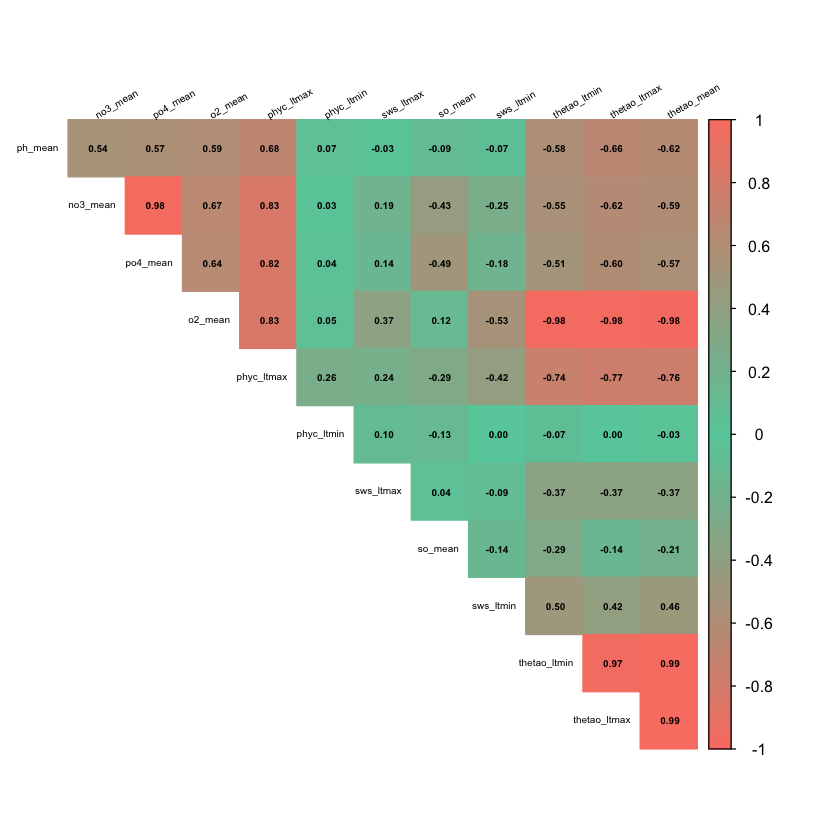

In [64]:
# Create correlation plot using the corrplot() function from the corrplot package
corrplot(cor_matrix,
         method = "color", # Use colours to show correlation
         type = "upper", order = "hclust", # Define type and order of correlation matrix
         addCoef.col = "black", # Show Pearson correlation coefficients in black
         number.cex = 0.5, # Adjust font size of correlation coefficients
         tl.col = "black", # Adjust text colour
         tl.srt = 30, # Adjust rotation of labels
         tl.cex = 0.5, # Adjust font size of variables
         cl.cex = 0.8, # Adjust font size of legend
         diag = FALSE, # Hide the diagnonal correlation
         col = colorRampPalette(c("salmon", "mediumaquamarine", "#fa8172"))(200), # Define what colours to use in the matrix
         sig.level = 0.01, insig = "blank") # Define significance level to include

A Pearson correlation >0.7 is typically considered strong. 

**The variables in the above correlation matrix with r>0.7 include:**
- no3_mean and po4_mean
- no3_mean and phyc_ltmax
- po4_mean and phyc_ltmax
- o2_mean and phyc_ltmax
- o2_mean and thetao_ltmin
- o2_mean and thetao_ltmax
- o2_mean and thetao_mean
- phyc_ltmax and thetao_ltmin
- phyc_ltmax and thetao_ltmax
- phyc_ltmax and thetao_mean
- thetao_ltmin and thetao_ltmax
- thetao_ltmin and thetao_mean
- thetao_ltmax and thetao_mean

This suggests that we should:
- Keep only one temperature variable (thetao_ltmax, thetao_ltmin or thetao_mean). The long-term maximal temperature (thetao_ltmax) is likely to have the greatest ecological significance. This is because it better captures periods of marine heatwaves, which can have a direct effect on the distribution and survival of Ecklonia Radiata. 
- Remove o2_mean from the model. It is highly correlated with all the temperature variables as well as phyc_ltmax.
- Remove phyc_ltmax. It is highly correlated with all the temperature and nutrient variables.
- Keep only one nutrient variable (no3_mean or po4_mean). Nitrogen concentration is likely to be more ecologically significant than phosphate concentration. 

**The GLM will therefore include the following variables: no3_mean, ph_mean, phyc_ltmin, so_mean, sws_ltmax, sws_ltmin, thetao_ltmax.**

In [65]:
# Create model using limited variables
glm_reduced <- glm(
    pa ~ no3_mean + ph_mean + phyc_ltmin + so_mean + sws_ltmax + sws_ltmin + thetao_ltmax, # write in predictor vars
    data = training, # use the training dataset
    family = binomial(), # type of GLM is a binomial logistic regression
    na.action = na.fail
)

#### Variance Inflation Factor (VIF)

We now need to check the VIF of variables in the new model. A VIF of 5 is typically used as the cut-off - variables with VIF values above 5 are highly correlated with other variables in the model and should be removed.  

In [66]:
# Calculate VIF for the GLM
vif_values <- vif(glm_reduced)

# Convert VIF values to a data frame with two columns
vif_table <- data.frame(
  Variable = names(vif_values), # Column 1: Variable names
  VIF = round(vif_values, 2) # Column 2: VIF values rounded to 2 decimals
)

# Rank the VIF table from high to low
vif_table <- vif_table[order(vif_table$VIF, decreasing = TRUE), ]

# Print the ranked table
print(vif_table)

                 Variable  VIF
thetao_ltmax thetao_ltmax 4.04
sws_ltmin       sws_ltmin 2.70
no3_mean         no3_mean 2.39
so_mean           so_mean 2.24
ph_mean           ph_mean 1.72
sws_ltmax       sws_ltmax 1.55
phyc_ltmin     phyc_ltmin 1.26


**All variables in this model have an acceptable VIF (<5)**

### Dredge the GLM

The next step is to use the MuMIn package to run all possible combinations of variables in the glm_reduced model to find which is the best model. We will compare AIC values to do this.

In [67]:
glm_dredge <- dredge(glm_reduced)

Fixed term is "(Intercept)"



In [68]:
head(glm_dredge)

,(Intercept),no3_mean,ph_mean,phyc_ltmin,so_mean,sws_ltmax,sws_ltmin,thetao_ltmax,df,logLik,AICc,delta,weight
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<mdl.wght>
108,-885.8589,1.059607,96.05715,NA,3.101055,NA,5.220155,-0.1880094,6,-452.2776,916.6252,0.0000000,0.3976897449
124,-793.4478,1.039143,85.36390,NA,2.962960,-1.3491692,5.503723,-0.2265230,7,-451.4506,916.9944,0.3692904,0.3306389453
112,-884.1037,1.063372,95.67248,0.06902293,3.136159,NA,5.220497,-0.1878704,7,-452.2626,918.6185,1.9933262,0.1467908931
128,-789.4624,1.044804,84.61947,0.10730087,3.015856,-1.3692629,5.508129,-0.2267825,8,-451.4144,918.9488,2.3236846,0.1244407724
44,-1097.9574,1.269791,118.95313,NA,3.744641,NA,3.894621,NA,5,-460.5889,931.2277,14.6025658,0.0002683104
60,-1128.1671,1.256347,122.69430,NA,3.739613,0.9314435,3.890836,NA,6,-460.0274,932.1248,15.4996253,0.0001713340


**The model with the lowest AICc excluded phyc_ltmin and sws_ltmax.**

This makes sense, based on the 2010 environmental data maps generated earlier:
- The highest levels of phyc_ltmin occur in shallow coastal areas, with lower levels in deeper waters. Since a depth mask has already been applied to the model, this variable probably provides little additional explanatory power.
- sws_ltmax is fairly consistent near the coastline. Variation occurs further offshore, which is typically outside of our masked 50m depth area, where it is too deep for ecklonia radiata to be present.

Let's have another look at these two maps:

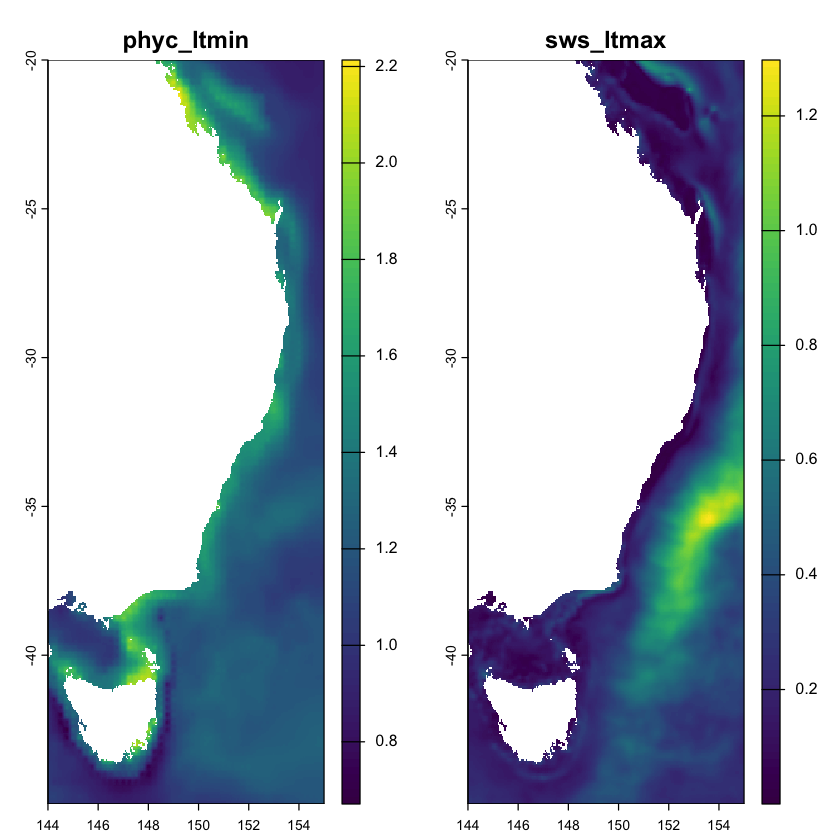

In [69]:
plot(envdata_cropped[[c("phyc_ltmin", "sws_ltmax")]])

**We will exclude these two variables from the model.**

## **Build the Final GLM**

We will build the final GLM using the following variables: no3_mean, ph_mean, so_mean, sws_ltmin, and thetao_ltmax

In [70]:
glm_final <- glm(
    pa ~ no3_mean + ph_mean + so_mean + sws_ltmin + thetao_ltmax,
    data = training,
    family = binomial(),
    na.action = na.fail
)

## **Examine Environmental Variables**

### Check the VIF values of the Final Model

We now need to check the VIF of variables in the final model. A VIF of 5 is typically used as the cut-off - variables with VIF values above 5 are highly correlated with other variables in the model and should be removed.

In [71]:
# Calculate VIF for the GLM
vif_values <- vif(glm_final)

# Convert VIF values to a data frame with two columns
vif_table <- data.frame(
  Variable = names(vif_values),
  VIF = round(vif_values, 2))

# Rank the VIF table from high to low
vif_table <- vif_table[order(vif_table$VIF, decreasing = TRUE), ]

# Print the ranked table
print(vif_table)

                 Variable  VIF
thetao_ltmax thetao_ltmax 2.90
sws_ltmin       sws_ltmin 2.30
no3_mean         no3_mean 2.27
so_mean           so_mean 1.86
ph_mean           ph_mean 1.28


**All of these VIF values are acceptable (<5).**

### Check contribution of environmental variables

In [72]:
summary(glm_final)


Call:
glm(formula = pa ~ no3_mean + ph_mean + so_mean + sws_ltmin + 
    thetao_ltmax, family = binomial(), data = training, na.action = na.fail)

Coefficients:
               Estimate Std. Error z value Pr(>|z|)    
(Intercept)  -885.85893  125.99203  -7.031 2.05e-12 ***
no3_mean        1.05961    0.10672   9.929  < 2e-16 ***
ph_mean        96.05715   14.95539   6.423 1.34e-10 ***
so_mean         3.10106    0.49367   6.282 3.35e-10 ***
sws_ltmin       5.22016    0.59261   8.809  < 2e-16 ***
thetao_ltmax   -0.18801    0.04879  -3.854 0.000116 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for binomial family taken to be 1)

    Null deviance: 1547.28  on 1208  degrees of freedom
Residual deviance:  904.56  on 1203  degrees of freedom
AIC: 916.56

Number of Fisher Scoring iterations: 6


**From this summary table, we can see that:**
- All variables contribute significantly to the model (p < 0.05).
- Higher mean nitrate concentrations, mean pH levels, mean salinity and long-term minimum sea water speeds are associated with a higher probability of Ecklonia Radiata.
- Higher maximal temperatures are associated with a lower probability of ecklonia radiata.

**This fits with our current ecological knowledge of Ecklonia Radiata.** It is a temperate species that prefers nutrient-rich, saline waters with some level of water flow, and can be damaged by marine heatwaves.

### Create response curves for each variable

We now need to examine how the predicted distribution of Ecklonia Radiata varied with each environmental variable included in the final GLM. Response curves were generated to do this.

**Acknowledgment:**
Parts of the GLM modelling workflow and response plot code were adapted from the EcoCommons Australia Generalised Linear Model (GLM) tutorial available at EcoCommons Australia GLM Notebook (EcoCommons Australia, 2023): https://ecocommonsaustralia.github.io/notebook-blog/notebooks/EC_GLM/EC_GLM.html

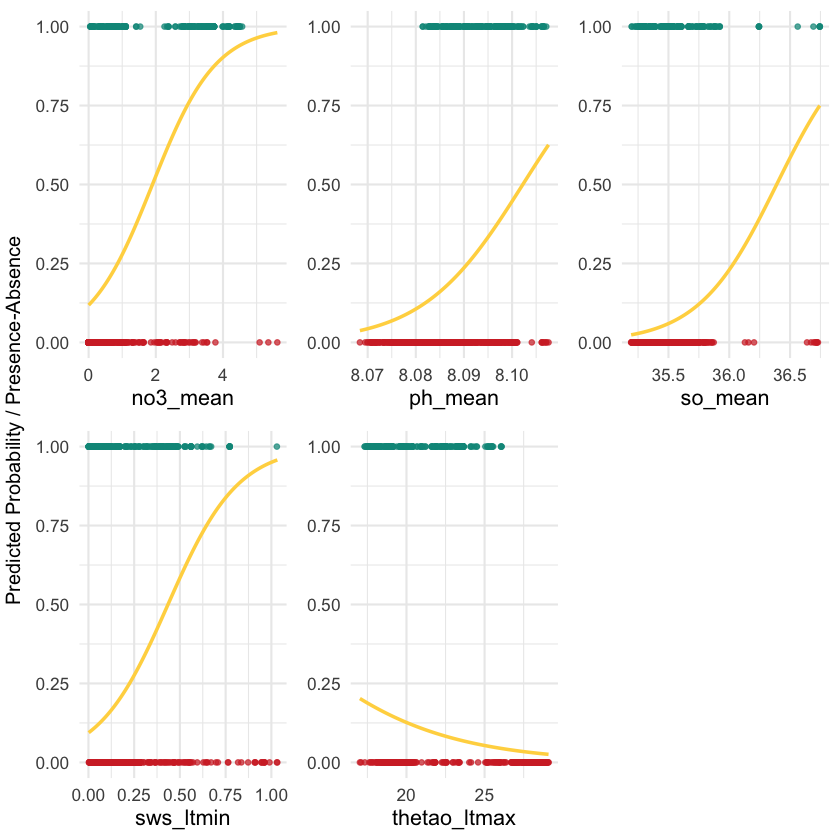

In [73]:
# List of predictors to plot
predictors <- c("no3_mean", "ph_mean", "so_mean", "sws_ltmin", "thetao_ltmax")

# Create empty list to store response plots
response_plots <- list()

# Loop through each predictor variable
for (predictor in predictors) {
    # Create new data frame to vary the predictor while keeping others constant, make 100 evenly spaced values that cover the full range of this variable (from its minimum to maximum in the training data)
    pred_range <- seq(
    min(training[[predictor]], na.rm = TRUE),
    max(training[[predictor]], na.rm = TRUE),
    length.out = 100 #sample 100 equally spaced points between the minimum and maximum of the variable to make a smooth response curve
  )
  
  const_data <- training[1, , drop = FALSE] # Use first row to keep others constant
  response_data <- const_data[rep(1, 100), ] # Duplicate 100 times
  response_data[[predictor]] <- pred_range # Replace the constant predictor values with the full range so only this variable changes across 100 values while all others remain fixed. This allows the model to isolate the individual effect of this predictor on species probability.

  # Predict probabilities using the GLM for each of the 100 modified rows in response_data.
  predicted_response <- predict(glm_final, newdata = response_data, type = "response")
  
  # Create data frame for plotting
  plot_data <- data.frame(
    Predictor_Value = pred_range,
    Predicted_Probability = predicted_response
  )
  
  # Add presence–absence data
  presence_absence_data <- data.frame(
    Predictor_Value = training[[predictor]],
    Presence_Absence = training$pa
  )
  
  # Generate the plot
  p <- ggplot() +
    geom_line(data = plot_data, #response curve (yellow)
              aes(x = Predictor_Value, y = Predicted_Probability),
              color = "#FFD54F", linewidth = 1.0) +
    geom_point(data = presence_absence_data[presence_absence_data$Presence_Absence == 1, ], # presence points (green)
               aes(x = Predictor_Value, y = Presence_Absence),
               color = "#009688", alpha = 0.7, size = 1.2) +
    geom_point(data = presence_absence_data[presence_absence_data$Presence_Absence == 0, ], # pseudoabsence points (red)
               aes(x = Predictor_Value, y = Presence_Absence),
               color = "#D32F2F", alpha = 0.7, size = 1.2) +
    labs(x = predictor, y = NULL) + # x axis to have predictor variable, no y axis
    theme_minimal(base_size = 13)
  
  # Store each plot in the list
  response_plots[[predictor]] <- p
}

# Arrange all plots together
grid.arrange(
  grobs = response_plots,
  ncol = 3,
  left = "Predicted Probability / Presence-Absence"
)

Green dots are presence points. Orange dots are pseudo-absence points.

## **Calculate AUC from ROC**

We will evaluate model accuracy using a Reciver Operating Characteristic (ROC) curve. This curve plots the relationship between the true positive rate and false positive rate across all possible presence threshold values. 

The Area Under the Curve (AUC) provides a summary value of the model's overall performance. Larger AUC values indicate better accuracy:
- AUC = 0.5: The model predicts species distribution no better than random chance.
- AUC = 0.7-0.9: Good model accuracy.
- AUC > 0.9: Excellent model accuracy.

In [74]:
# Apply the GLM to the testing dataset to see how accurate it is at making predicitons
testing_glm <- testing
testing_glm$pred_glm <- predict(glm_final, newdata = testing, type = "response")

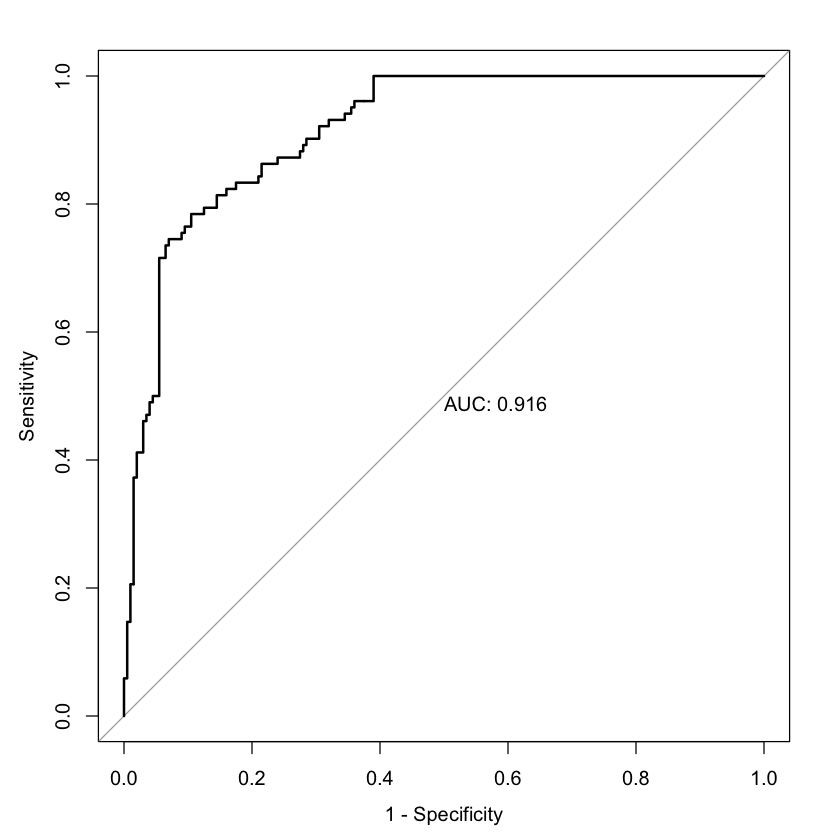

In [75]:
# Create a ROC curve
roc_glm <- roc(response = testing_glm$pa, 
    predictor = testing_glm$pred_glm, 
    quiet = TRUE)

plot(roc_glm, 
    print.auc = TRUE, 
    legacy.axes = TRUE)

In [76]:
# Calculate the AUC
auc_glm <- roc_glm$auc
auc_glm

Area under the curve: 0.9159

This is an excellent AUC, and indicates strong predictive accuracy.

## **Present-Day Distribution in Sample Area**

We can now use the GLM to predict the current distribution of Ecklonia radiata across our cropped sample area with environmental data from 2010-2020.

### Masked Probability (Sample Area)

The first step is to calculate the probabiltiy of occurence for each cell across the sample area.

In [77]:
# Predict habitat suitability across the sample area
glm_samplearea <- predict(
    envdata_cropped,
    glm_final,
    type = "response")

Then use the mask function from Terra to mask depths greater than 50m.

In [78]:
# Mask depths greater than 50m
glm_samplearea_50 <- mask(glm_samplearea, mask50_sample)

# Map predicted habitat suitability across masked area
glm_samplearea_masked <- ifel(
    is.na(glm_samplearea_50) & !is.na(crop(bath_min, sample_extent)), # glm_samplearea_50 is na when in deep water, bath_min is na when on land
    0, # Make probability 0 when in deep water and not on land
    glm_samplearea_50)

Now, we can view the probabilty of occurence on a map.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


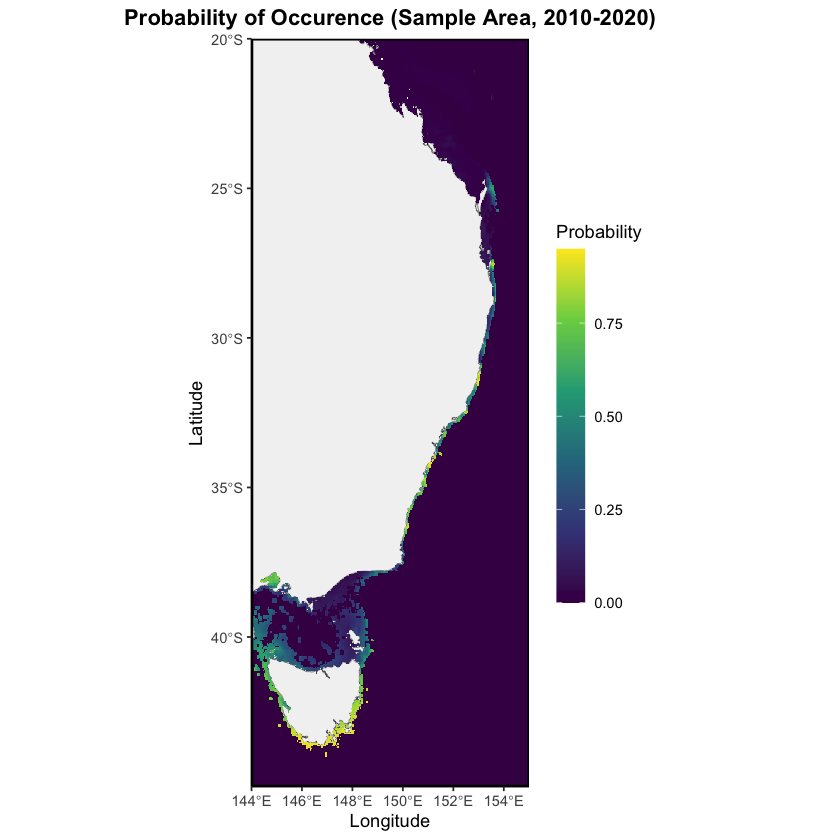

In [79]:
# Habitat suitability map
glmDist_samplearea_2010 <- sample_map +
    geom_spatraster(data = glm_samplearea_masked) +
    scale_fill_viridis_c(name = "Probability", na.value = "transparent") +
    coord_sf(expand = FALSE) +
    theme(legend.key.height = unit(1.5, "cm")) +
    labs(title = "Probability of Occurence (Sample Area, 2010-2020)")

glmDist_samplearea_2010

**This map shows ecklonia radiata's probability of occurence across the sample area. The 50m depth mask has been applied.**

### Presence Threshold (Sample Area)

We now need to calculate the presence threshold.

In [80]:
# Use test data to evaluate the model
glm_eval <- pa_evaluate(p = testing[testing$pa == 1, ],
                        a = testing[testing$pa == 0, ],
                        model = glm_final,
                        type = "response")

Max_spec_sens calculates the threshold with highest sensitivity (true positive rate) and specificity (true negative rate).

In [81]:
# Determine the minimum threshold for presence usng max_spec_sens (calculates threshold with highest sensitivity and specificity)
glm_threshold <- glm_eval@thresholds$max_spec_sens
glm_threshold

[1] 0.448879

In [82]:
# Identify which cells are above/below threshold
glm_thresh_data <- as.factor(glm_samplearea_masked > glm_threshold)
glm_thresh_data

class       : SpatRaster 
size        : 500, 220, 1  (nrow, ncol, nlyr)
resolution  : 0.04999999, 0.05  (x, y)
extent      : 144, 155, -45, -20  (xmin, xmax, ymin, ymax)
coord. ref. : lon/lat WGS 84 (CRS84) (OGC:CRS84) 
source(s)   : memory
categories  : lyr1 
name        : lyr1 
min value   :    0 
max value   :    1 

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


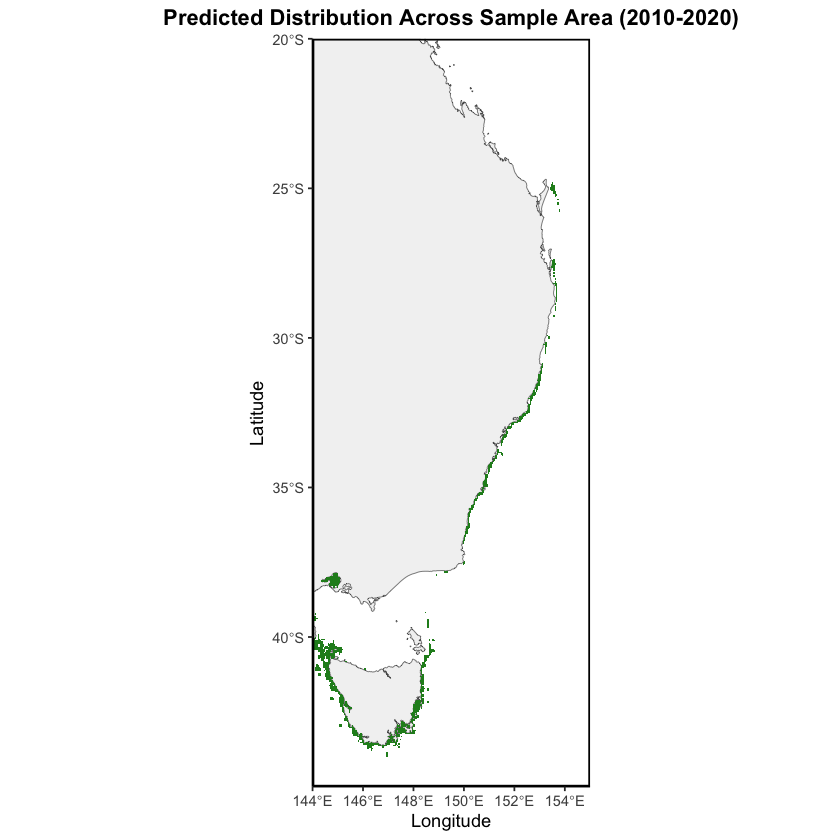

In [83]:
# Map presence threshold across sample area
glmThresh_samplearea_2010 <- sample_map +
    geom_spatraster(data = glm_thresh_data) +
    scale_fill_manual(
        values = c("0" = "transparent", "1" = "forestgreen"),
        na.value = "transparent",
        guide = "none") +
    coord_sf(expand = FALSE) +
    theme(legend.key.height = unit(1.5, "cm")) +
    labs(title = "Predicted Distribution Across Sample Area (2010-2020)")

glmThresh_samplearea_2010

**This map shows where ecklonia radiata is predicted to be present across the sample area.**

### Probability of Occurence (Sample Area)

**Note:** This map does not include a depth mask. It needs to be interpreted alongside a bathymetry map to understand where ecklonia radiata could actually occur. 
- Black line = the GLM's presence threshold (calculated above to be 0.45)
- Colours = probability of occurence values (0=red to 1=blue)
- Green dots = presence points

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


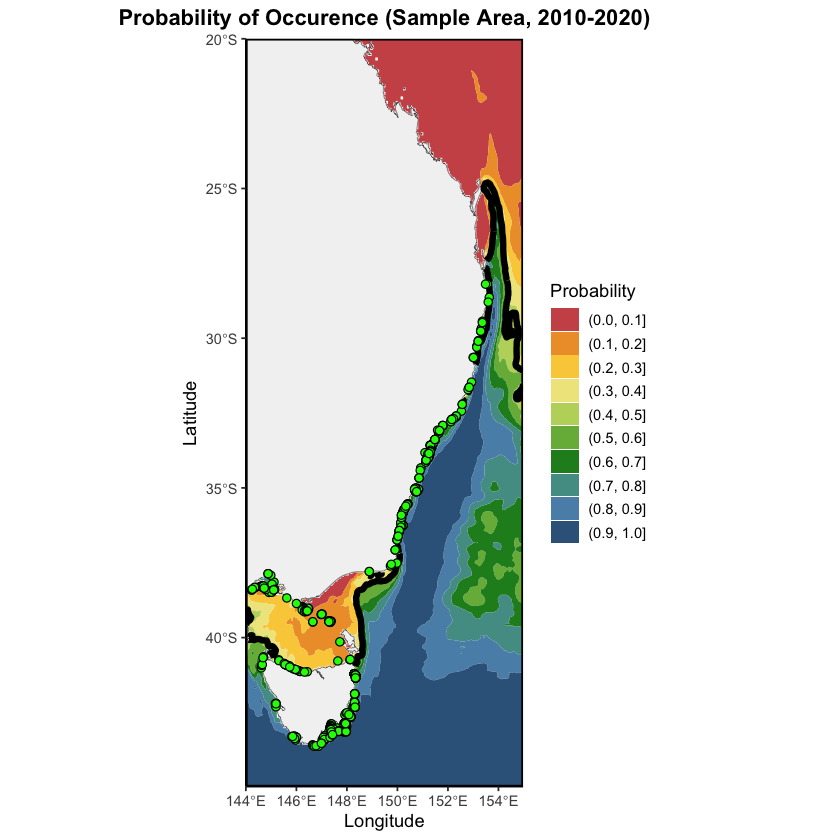

In [84]:
# Habitat suitability map - unmasked
glmDist_2010sample_unmasked <- sample_map +
    geom_spatraster_contour_filled(data = glm_samplearea,
                                   breaks = seq(0, 1, 0.1)) + # Scale should run from 0-1, with a break every 0.1
    scale_fill_manual(name = "Probability",
                      values = colorRampPalette(c("indianred3", # Choose some colours for our scale 
                                                  "goldenrod1", 
                                                  "khaki", 
                                                  "darkolivegreen3", 
                                                  "forestgreen", 
                                                  "skyblue3", 
                                                  "steelblue4"))(10), # Split this into a spectrum of 10 colours
                      na.value = "transparent") + # Don't predict over land
    coord_sf(expand = FALSE) + # expand the map area
    theme(legend.key.height = unit(0.5, "cm")) + # adjust size of legend
    labs(title = "Probability of Occurence (Sample Area, 2010-2020)") # Add a title

# Add threshold contour and presence points
glmDist_2010sample_thresh <- glmDist_2010sample_unmasked +
    geom_spatraster_contour(data = glm_samplearea, # Threshold Contour
                           breaks = glm_threshold,
                           colour = "black",
                           linewidth = 1.8) +
    geom_point(data = obs_unique, # Presence points
               aes(x = longitude, y = latitude),
               shape = 21,
               size = 2,
               colour = "black",
               fill = "green") +
    coord_sf(expand = FALSE)

glmDist_2010sample_thresh

## **Predict Across GSR**

We have maps for the probability of occurence across the sample area under present-day conditions. We now need to predict the probability that ecklonia radiata will occur across the entire GSR.

### Define GSR Extent

To predict across the GSR, we first need to define the extent of the GSR.

In [85]:
# Create GSR extent
min_lon_g <- 110
max_lon_g <- 158
min_lat_g <- -45
max_lat_g <- -20

# Store the boundaries as a single object
gsr_extent <- ext(x = c(min_lon_g, max_lon_g, min_lat_g, max_lat_g))

We then need to create a base map of the GSR.

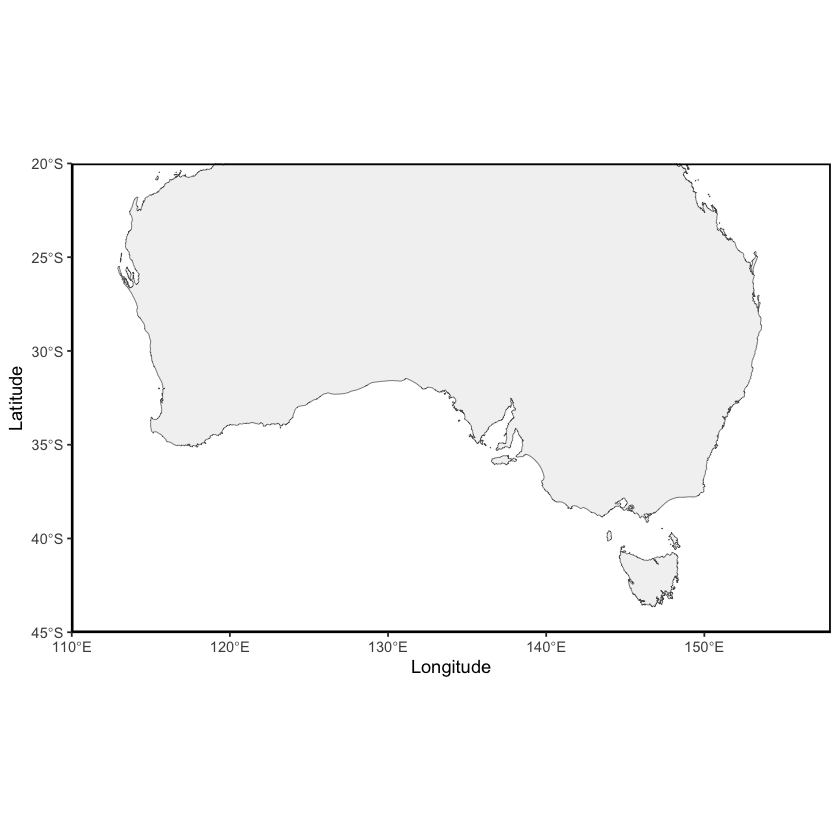

In [86]:
# Crop map area to GSR extent
gsr_map <- crop(world_map, gsr_extent)

# Create base map of GSR extent
gsr_map <- ggplot(gsr_map) +
    geom_spatvector(fill = "grey95") +
    labs(x = "Longitude",
        y = "Latitude") +
    theme_classic() +
    theme(panel.border = element_rect(colour = "black", fill = NA, linewidth = 1),
        plot.title = element_text(hjust = 0.5, face = "bold")) +
    coord_sf(xlim = c(xmin(gsr_extent), xmax(gsr_extent)),
         ylim = c(ymin(gsr_extent), ymax(gsr_extent)),
         expand = FALSE)

gsr_map

We also need to crop our environmental data and mask to the new GSR extent.

In [87]:
# Crop 2010 environmental data to GSR
envdata_2010_gsr <- crop(envdata_2010, gsr_extent)

In [88]:
# Crop mask to sample extent
mask50_gsr <- crop(mask50, gsr_extent)

### Generate Bathymetry Map

The next step is to generate a bathymetry map showing areas with depths between 0 and 50m - the depth range suitable for ecklonia radiata. This map will be needed to interpret all "probability of occurence" maps generated without a depth mask applied. 

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


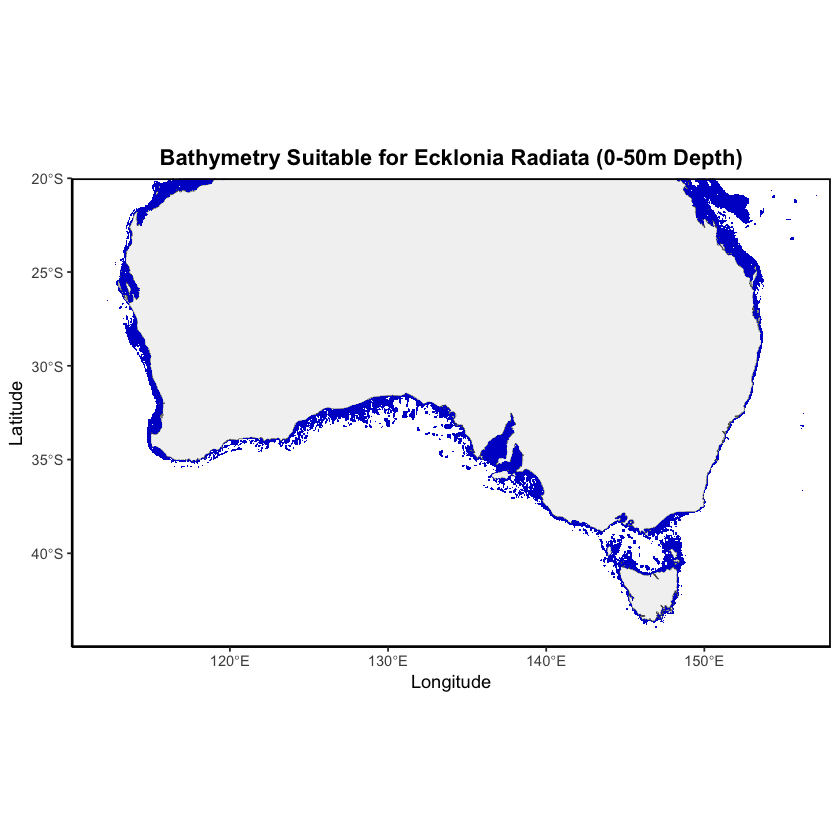

In [89]:
# Generate map of masked area
gsr_mask_map <- gsr_map +
    geom_spatraster(data = as.factor(mask50_gsr)) +
    scale_fill_manual(
        values = "mediumblue",
        na.value = "transparent",
        guide = "none") +
    coord_sf(expand = FALSE) +
    labs(title = "Bathymetry Suitable for Ecklonia Radiata (0-50m Depth)")

gsr_mask_map

**Blue areas on the map represent ocean cells with a minimum bathymetry less than 50m.**

### Function: Predict Probability of Occurence from GLM

Create function to predict probability of occurence across the GSR using glm_final:

In [90]:
predict_probability <- function(env_data) {
    # Predict habitat suitability
    glm_pred <- predict(env_data, glm_final, type = "response")
    
    # Mask depths greater than 50 m
    glm_masked <- mask(glm_pred, mask50_gsr)
    
    # Set probability to 0 in deep water and on land
    glm_function <- ifel(
        is.na(glm_masked) & !is.na(crop(bath_min, gsr_extent)),
        0,
        glm_masked)
    
    return(glm_function)
}

### Function: Masked Probability Maps

Create function to map the masked probability of occurence across GSR:

In [91]:
# Function to plot habitat suitability maps with consistent titles and legend height
plot_masked_map <- function(model_pred, year_range) {
    map_title <- paste("Masked Probability of Occurrence Across GSR (", year_range, ")", sep = "")
    
    map <- gsr_map +
        geom_spatraster(data = model_pred) +
        scale_fill_viridis_c(name = "Probability", na.value = "transparent") +
        coord_sf(expand = FALSE) +
        theme(legend.key.height = unit(1.5, "cm")) +
        labs(title = map_title)

    print(map)
  return(map)
}

### Function: Presence Threshold Maps

Create function to map presence threshold across sample area:

In [92]:
# Function to threshold and plot predicted habitat suitability maps
plot_thresholded_map <- function(model_pred, threshold, year_range) {
    
    # Automatically generate consistent map title
    title_text <- paste("Predicted Distribution Across GSR (", year_range, ")", sep = "")
    
    # Identify which cells are above/below the threshold
    thresh_data <- as.factor(model_pred > threshold)
    crs(thresh_data) <- "EPSG:4326"
    
    # Build the map
    map <- gsr_map +
        geom_spatraster(data = thresh_data) +
        scale_fill_manual(
            values = c("0" = "transparent", "1" = "forestgreen"),
            na.value = "transparent",
            guide = "none") +
        coord_sf(expand = FALSE) +
        theme(legend.key.height = unit(1.5, "cm")) +
        labs(title = title_text)
  
  print(map)
  return(map)
}

### Function: Probability of Occurence Maps

Create function for the probability of occurence maps:

In [93]:
plot_glm_map <- function(env_data, year_range) {
    
    # Predict habitat suitability
    glm_pred <- predict(env_data, glm_final, type = "response")
    
    # Build filled contour map
    map_unmasked <- gsr_map +
        geom_spatraster_contour_filled(
            data = glm_pred,
            breaks = seq(0, 1, 0.1)) +
        scale_fill_manual(
            name = "Probability",
            values = colorRampPalette(c("indianred3", "goldenrod1", "khaki", "darkolivegreen3", "forestgreen", "skyblue3", "steelblue4"))(10),
            na.value = "transparent") +
        coord_sf(expand = FALSE) +
        theme(legend.key.height = unit(0.5, "cm")) +
    labs(title = paste("Occurrence Across GSR (", year_range, ")", sep = ""))
    
    # Add threshold contour and presence points
    map_thresh <- map_unmasked +
        geom_spatraster_contour(
            data = glm_pred,
            breaks = glm_threshold,
            colour = "black",
            linewidth = 1) +
        coord_sf(expand = FALSE)
    
    return(map_thresh)
}

### Function: Calculate Habitat Loss

Create function to calculate the loss of suitable habitat relative to 2010:

In [94]:
habitat_loss <- function(model_pred, threshold, cover_2010) {
    # Find cells where probability of occurence is above presence threshold
    pa_cells <- as.factor(model_pred > threshold)

    # Count cells where ecklonia radiata is predicted to occur
    cover <- global(pa_cells, "sum", na.rm = TRUE)[[1]]

    # Calculate percent loss relative to 2010
    loss <- ((cover_2010 - cover) / cover_2010) * 100
    
    return(loss)
}

## **Read in Environmental Data and Make Predictions GSR**

We can now use the functions we've created to predict and map the probability of Ecklonia radiata in 2010 across the GSR.

### 2010

**Step 1:** Predict the probabiltiy of occurence across the GSR in 2010-2020 using the predict_probability function.

In [95]:
# use predict_probability function for 2010-2020
glm_2010 <- predict_probability(env_data = envdata_2010_gsr)

**Step 2:** Calculate the amount of suitable habitat in 2010. These values don't mean much right now, but will be used to calculate loss of habitat under different SSP scenarioes in future years later on in this Jupyter notebook.

In [96]:
# Find cells where probability of occurence is above presence threshold
pa_glm_2010 <- as.factor(glm_2010 > glm_threshold)

# Calculate the number of cells where ecklonia radiata is predicted to occur
cover_glm_2010 <- global(pa_glm_2010, "sum", na.rm = TRUE)[[1]]

### 2040-2050 SSP1

Now let's use the GLM to predict the distribution of Ecklonia radiata across the GSR in 2040-2050 under SSP1.

Read in Environmental Data for 2040 SSP1:

In [97]:
# Read in environmental data for 2040 ssp1
files_2040ssp1 <- list.files(path="Data/BioOracle_Data/2040_SSP1", full.names=TRUE)
envdata_2040ssp1 <- rast(files_2040ssp1[1:length(files_2040ssp1)])

# Crop envdata to GSR area
env_2040ssp1 <- crop(envdata_2040ssp1, gsr_extent)

# Check data
env_2040ssp1

class       : SpatRaster 
size        : 500, 960, 12  (nrow, ncol, nlyr)
resolution  : 0.04999999, 0.05  (x, y)
extent      : 110, 158, -45, -20  (xmin, xmax, ymin, ymax)
coord. ref. : lon/lat WGS 84 (CRS84) (OGC:CRS84) 
source(s)   : memory
names       :    o2_mean,   no3_mean,  ph_mean,   po4_mean, phyc_ltmax, phyc_ltmin, ... 
min values  :   203.1443,    0.00000, 8.005183,   0.000000,   1.183613,  0.5897197, ... 
max values  :   282.1108,   15.08881, 8.091485,   1.155367,  17.203390,  2.2519848, ... 
unit        : MMol' 'M-3, MMol' 'M-3,        1, MMol' 'M-3, MMol' 'M-3, MMol' 'M-3, ... 
time        : 2040-01-01 UTC 

Predict the probabiltiy of occurence across the GSR in 2040-2050 under SSP1 using the predict_probability function.

In [98]:
# use predict_probability function for 2040 SSP1
glm_2040ssp1 <- predict_probability(env_data = env_2040ssp1)

Calculate habitat loss in 2040-2050 under SSP1 relative to 2010.

In [99]:
loss_glm_2040ssp1 <- habitat_loss(model_pred = glm_2040ssp1,
                                  threshold = glm_threshold,
                                  cover_2010 = cover_glm_2010)
loss_glm_2040ssp1

[1] 95.97855

**The GLM predicts a 96.0% loss of suitable habitat across the GSR in 2040-2050 compared to present-day conditions.**

### 2090-2100 SSP1

Now let's use the GLM to predict the distribution of Ecklonia radiata across the GSR in 2090-2100 under SSP1.

Read in Environmental Data for 2090-2100 SSP1:

In [100]:
# Read in environmental data for 2090 ssp1
files_2090ssp1 <- list.files(path="Data/BioOracle_Data/2090_SSP1", full.names=TRUE)
envdata_2090ssp1 <- rast(files_2090ssp1[1:length(files_2090ssp1)])

# Crop envdata to GSR area
env_2090ssp1 <- crop(envdata_2090ssp1, gsr_extent)

# Check data
env_2090ssp1

class       : SpatRaster 
size        : 500, 960, 12  (nrow, ncol, nlyr)
resolution  : 0.04999999, 0.05  (x, y)
extent      : 110, 158, -45, -20  (xmin, xmax, ymin, ymax)
coord. ref. : lon/lat WGS 84 (CRS84) (OGC:CRS84) 
source(s)   : memory
names       :    o2_mean,   no3_mean,  ph_mean,   po4_mean, phyc_ltmax, phyc_ltmin, ... 
min values  :   203.9885,    0.00000, 8.035329,   0.000000,   1.181506,  0.5954961, ... 
max values  :   282.9166,   15.31105, 8.123476,   1.174392,  17.928799,  2.1492651, ... 
unit        : MMol' 'M-3, MMol' 'M-3,        1, MMol' 'M-3, MMol' 'M-3, MMol' 'M-3, ... 
time        : 2090-01-01 UTC 

Predict the probabiltiy of occurence across the GSR in 2090-2100 under SSP1 using the predict_probability function.

In [101]:
# use predict_probability function for 2040 SSP1
glm_2090ssp1 <- predict_probability(env_data = env_2090ssp1)

Calculate habitat loss relative to 2010.

In [102]:
loss_glm_2090ssp1 <- habitat_loss(model_pred = glm_2090ssp1,
                                  threshold = glm_threshold,
                                  cover_2010 = cover_glm_2010)
loss_glm_2090ssp1

[1] 7.257756

**The GLM predicts a 7.3% loss of suitable habitat across the GSR in 2090-2100 compared to present-day conditions.**

### 2040-2050 SSP2

Read in Environmental Data for 2040-2050 SSP2:

In [103]:
# Read in environmental data for 2040 ssp2
files_2040ssp2 <- list.files(path="Data/BioOracle_Data/2040_SSP2", full.names=TRUE)
envdata_2040ssp2 <- rast(files_2040ssp2[1:length(files_2040ssp2)])

# Crop envdata to GSR area
env_2040ssp2 <- crop(envdata_2040ssp2, gsr_extent)

# Check data
env_2040ssp2

class       : SpatRaster 
size        : 500, 960, 12  (nrow, ncol, nlyr)
resolution  : 0.04999999, 0.05  (x, y)
extent      : 110, 158, -45, -20  (xmin, xmax, ymin, ymax)
coord. ref. : lon/lat WGS 84 (CRS84) (OGC:CRS84) 
source(s)   : memory
names       :    o2_mean,   no3_mean,  ph_mean,   po4_mean, phyc_ltmax, phyc_ltmin, ... 
min values  :   202.7257,    0.00000, 7.981074,   0.000000,    0.00000,  0.5999875, ... 
max values  :   281.7889,   15.05682, 8.065452,   1.155749,   15.86328,  2.1854696, ... 
unit        : MMol' 'M-3, MMol' 'M-3,        1, MMol' 'M-3, MMol' 'M-3, MMol' 'M-3, ... 
time        : 2040-01-01 UTC 

Use the predict_probability function:

In [104]:
glm_2040ssp2 <- predict_probability(env_data = env_2040ssp2)

Calculate habitat loss relative to 2010.

In [105]:
loss_glm_2040ssp2 <- habitat_loss(model_pred = glm_2040ssp2,
                                  threshold = glm_threshold,
                                  cover_2010 = cover_glm_2010)
loss_glm_2040ssp2

[1] 96.72539

### 2090-2100 SSP2

Read in Environmental Data for 2090-2100 SSP2:

In [106]:
# Read in environmental data for 2040 ssp2
files_2090ssp2 <- list.files(path="Data/BioOracle_Data/2090_SSP2", full.names=TRUE)
envdata_2090ssp2 <- rast(files_2090ssp2[1:length(files_2090ssp2)])

# Crop envdata to GSR area
env_2090ssp2 <- crop(envdata_2090ssp2, gsr_extent)

# Check data
env_2090ssp2

class       : SpatRaster 
size        : 500, 960, 12  (nrow, ncol, nlyr)
resolution  : 0.04999999, 0.05  (x, y)
extent      : 110, 158, -45, -20  (xmin, xmax, ymin, ymax)
coord. ref. : lon/lat WGS 84 (CRS84) (OGC:CRS84) 
source(s)   : memory
names       :    o2_mean,   no3_mean,  ph_mean,   po4_mean, phyc_ltmax, phyc_ltmin, ... 
min values  :   200.1813,    0.00000, 7.909333,   0.000000,    0.00000,   0.597374, ... 
max values  :   278.8309,   14.52853, 7.999057,   1.123913,   15.88418,   2.102065, ... 
unit        : MMol' 'M-3, MMol' 'M-3,        1, MMol' 'M-3, MMol' 'M-3, MMol' 'M-3, ... 
time        : 2090-01-01 UTC 

Predict the probabiltiy of occurence across the GSR using the predict_probability function.

In [107]:
glm_2090ssp2 <- predict_probability(env_data = env_2090ssp2)

Calculate habitat loss relative to 2010.

In [108]:
loss_glm_2090ssp2 <- habitat_loss(model_pred = glm_2090ssp2,
                                  threshold = glm_threshold,
                                  cover_2010 = cover_glm_2010)
loss_glm_2090ssp2

[1] 99.7319

### 2040-2050 SSP3

Read in Environmental Data for 2040-2050 SSP3

In [109]:
# Read in environmental data for 2040 ssp2
files_2040ssp3 <- list.files(path="Data/BioOracle_Data/2040_SSP3", full.names=TRUE)
envdata_2040ssp3 <- rast(files_2040ssp3[1:length(files_2040ssp3)])

# Crop envdata to GSR area
env_2040ssp3 <- crop(envdata_2040ssp3, gsr_extent)

# Check data
env_2040ssp3

class       : SpatRaster 
size        : 500, 960, 12  (nrow, ncol, nlyr)
resolution  : 0.04999999, 0.05  (x, y)
extent      : 110, 158, -45, -20  (xmin, xmax, ymin, ymax)
coord. ref. : lon/lat WGS 84 (CRS84) (OGC:CRS84) 
source(s)   : memory
names       :    o2_mean,   no3_mean,  ph_mean,   po4_mean, phyc_ltmax, phyc_ltmin, ... 
min values  :   202.8603,     0.0000, 7.965238,   0.000000,  0.5903695,  0.6143382, ... 
max values  :   281.5912,    15.0432, 8.050632,   1.156618, 17.0227833,  2.2021625, ... 
unit        : MMol' 'M-3, MMol' 'M-3,        1, MMol' 'M-3, MMol' 'M-3, MMol' 'M-3, ... 
time        : 2040-01-01 UTC 

Predict the probabiltiy of occurence across the GSR using the predict_probability function.

In [110]:
glm_2040ssp3 <- predict_probability(env_data = env_2040ssp3)

Calculate habitat loss relative to 2010.

In [111]:
loss_glm_2040ssp3 <- habitat_loss(model_pred = glm_2040ssp3,
                                  threshold = glm_threshold,
                                  cover_2010 = cover_glm_2010)
loss_glm_2040ssp3

[1] 97.01264

### 2090-2100 SSP3

Read in Environmental Data for 2090-2100 SSP3

In [112]:
# Read in environmental data for 2090 ssp3
files_2090ssp3 <- list.files(path="Data/BioOracle_Data/2090_SSP3", full.names=TRUE)
envdata_2090ssp3 <- rast(files_2090ssp3[1:length(files_2090ssp3)])

# Crop envdata to GSR area
env_2090ssp3 <- crop(envdata_2090ssp3, gsr_extent)

# Check data
env_2090ssp3

class       : SpatRaster 
size        : 500, 960, 12  (nrow, ncol, nlyr)
resolution  : 0.04999999, 0.05  (x, y)
extent      : 110, 158, -45, -20  (xmin, xmax, ymin, ymax)
coord. ref. : lon/lat WGS 84 (CRS84) (OGC:CRS84) 
source(s)   : memory
names       :    o2_mean,   no3_mean,  ph_mean,   po4_mean, phyc_ltmax, phyc_ltmin, ... 
min values  :   197.1472,    0.00000, 7.807845,   0.000000,    0.00000,  0.5562266, ... 
max values  :   275.6032,   13.93718, 7.895113,   1.086312,   14.09511,  2.0582244, ... 
unit        : MMol' 'M-3, MMol' 'M-3,        1, MMol' 'M-3, MMol' 'M-3, MMol' 'M-3, ... 
time        : 2090-01-01 UTC 

Predict the probabiltiy of occurence across the GSR using the predict_probability function.

In [113]:
glm_2090ssp3 <- predict_probability(env_data = env_2090ssp3)

Calculate habitat loss relative to 2010.

In [114]:
loss_glm_2090ssp3 <- habitat_loss(model_pred = glm_2090ssp3,
                                  threshold = glm_threshold,
                                  cover_2010 = cover_glm_2010)
loss_glm_2090ssp3

[1] 100

### Generate GLM Masked Probability Maps

Use the plot_masked_map function to generate maps of the masked probability of occurence across GSR:

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


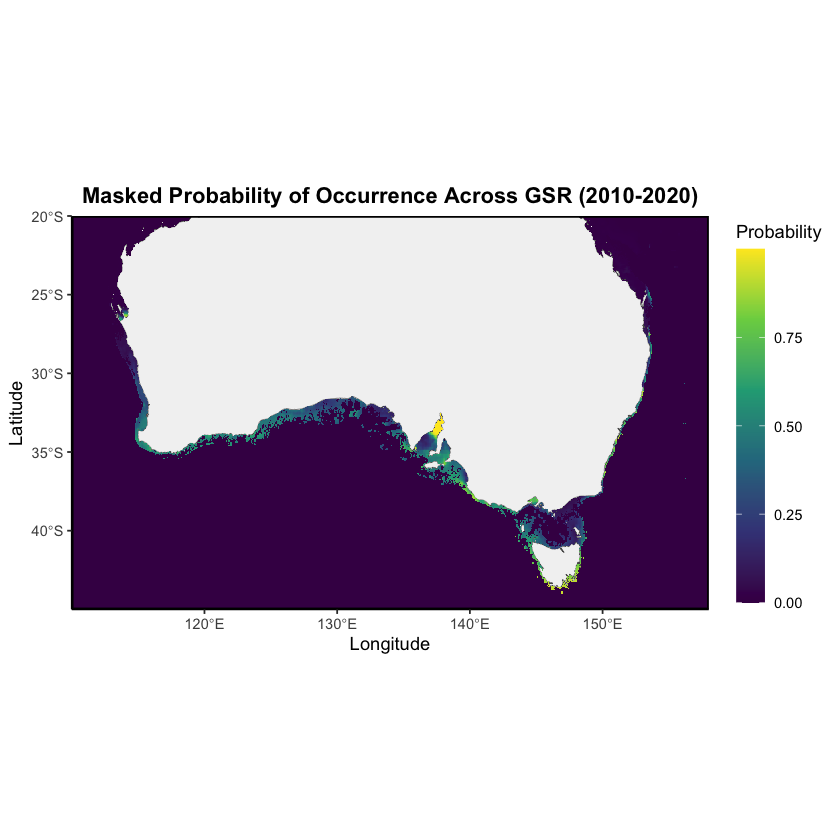

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


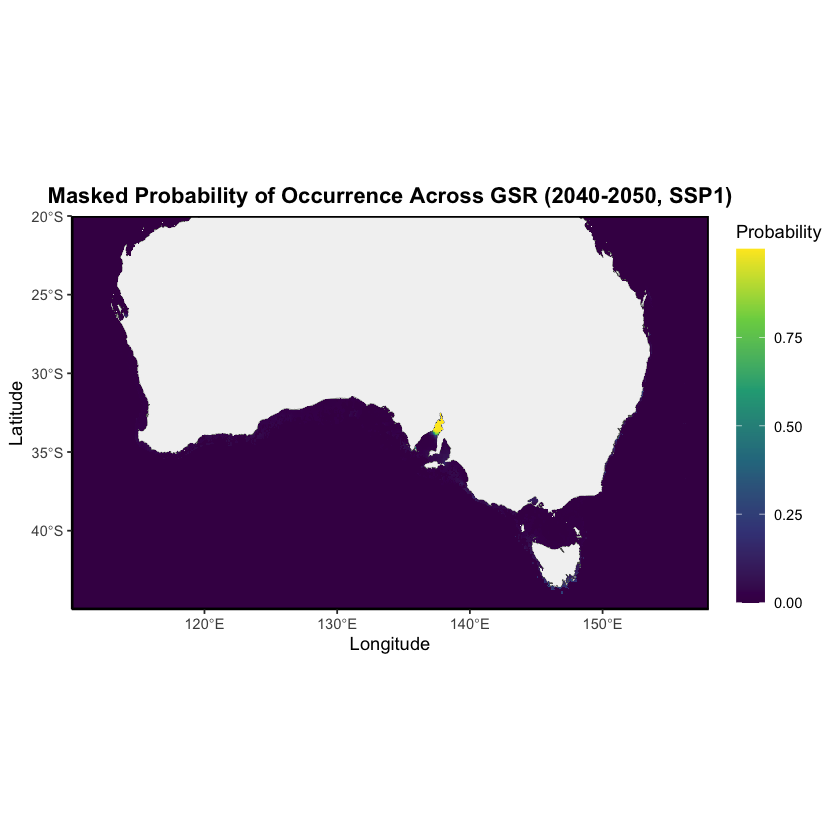

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


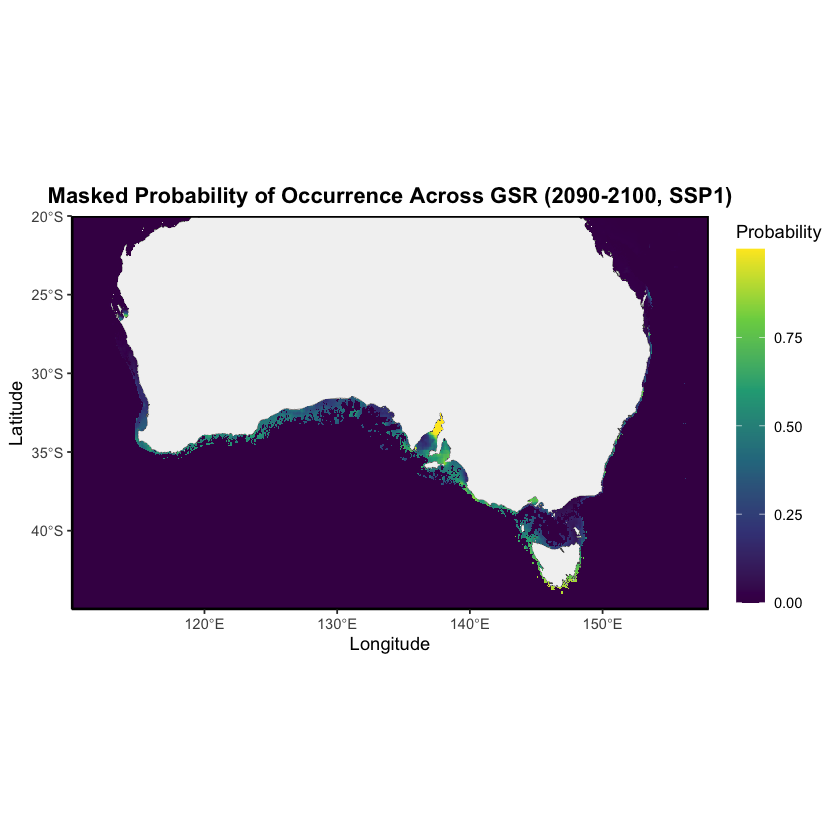

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


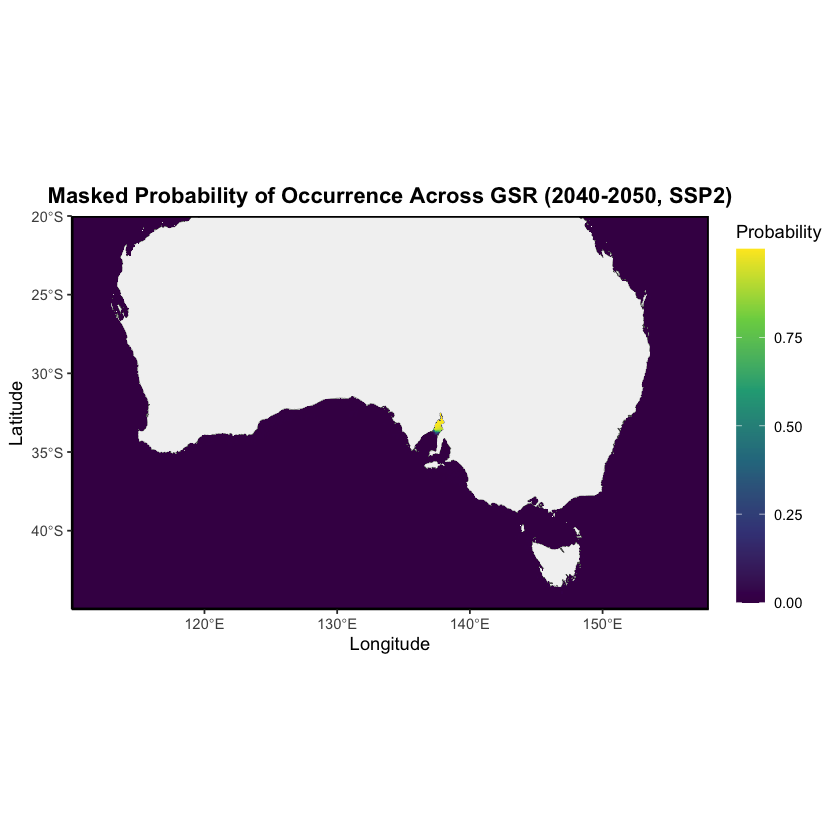

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


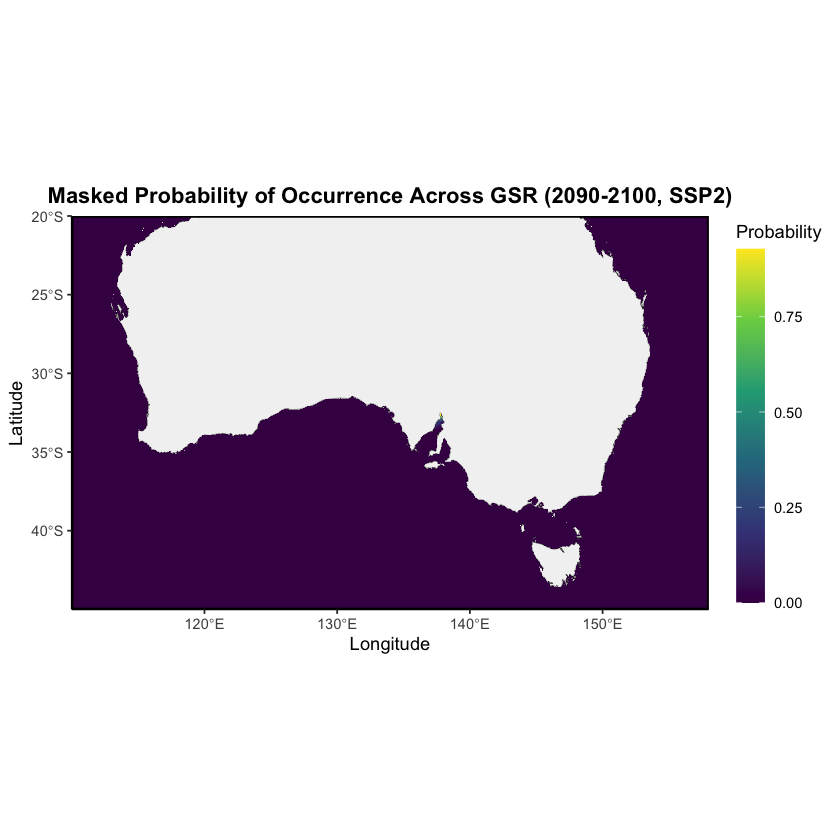

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


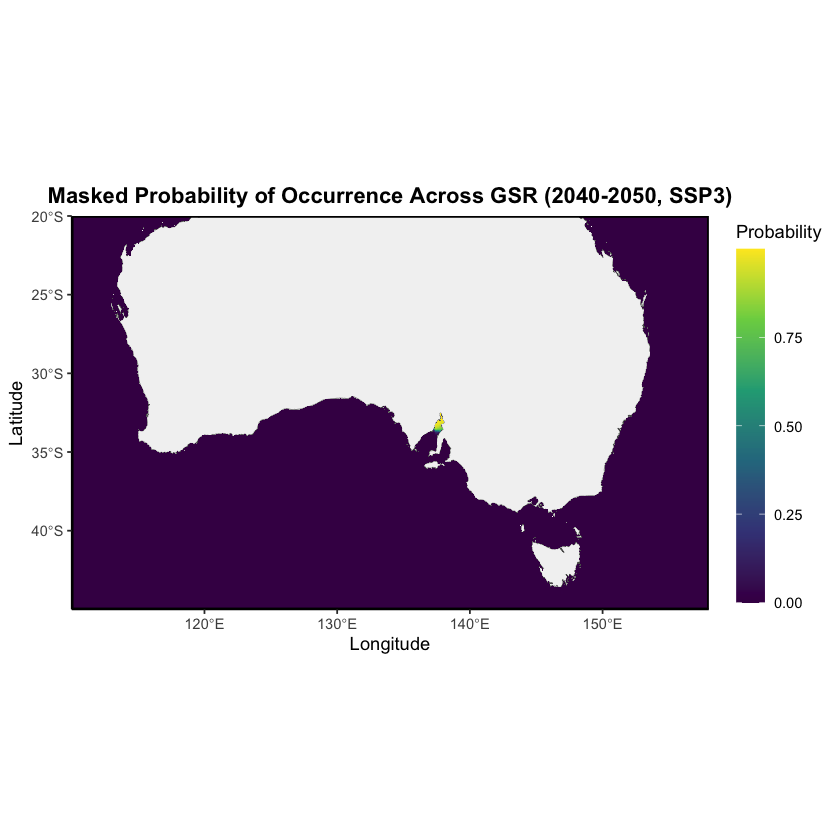

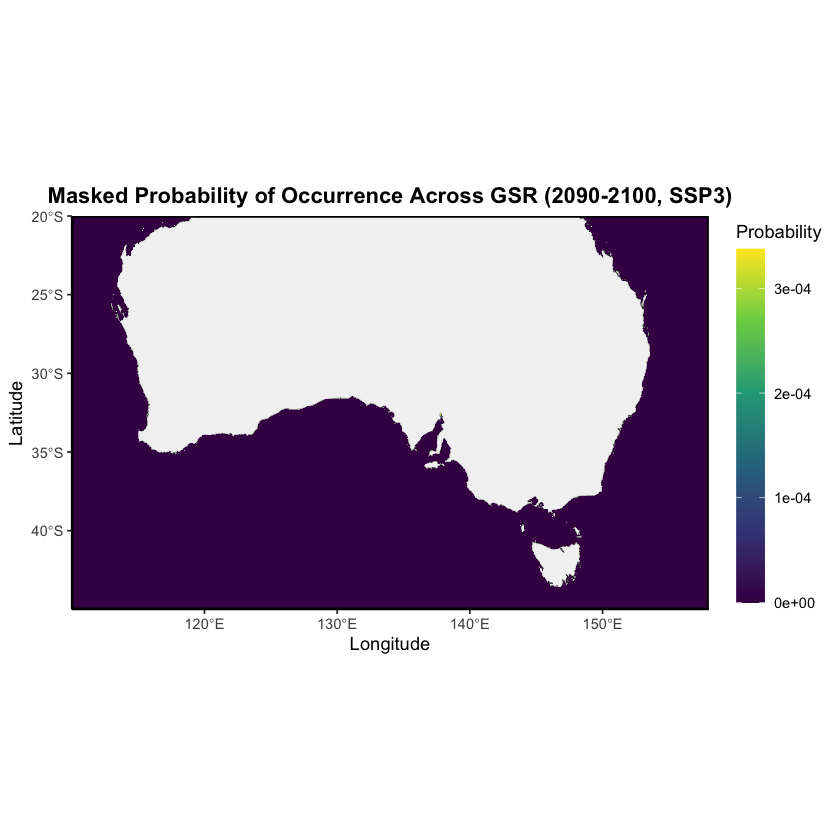

In [115]:
glm_plotmaskedmap_list <- list(
    list(
         model_pred = glm_2010, 
         year_range = "2010-2020"),
    list(
         model_pred = glm_2040ssp1, 
         year_range = "2040-2050, SSP1"),
    list(
         model_pred = glm_2090ssp1, 
         year_range = "2090-2100, SSP1"),
    list(
         model_pred = glm_2040ssp2, 
         year_range = "2040-2050, SSP2"),
    list(
         model_pred = glm_2090ssp2, 
         year_range = "2090-2100, SSP2"),
    list(
         model_pred = glm_2040ssp3, 
         year_range = "2040-2050, SSP3"),
    list(
         model_pred = glm_2090ssp3, 
         year_range = "2090-2100, SSP3"))

glm_maskedmap_results <- lapply(glm_plotmaskedmap_list, # loop over each item in the list glm_plotmaskedmap_list
    function(job) { # label each item in glm_plotmaskedmap_list as a "job"
    do.call(plot_masked_map, job) # Call the function plot_masked_map, and apply the list of args associated with each "job"
})
    

### Generate GLM Threshold Maps

Use the plot_thresholded_map function to generate maps of predicted ecklonia radiata presence across the GSR (maps of locations within the masked area above the presence threshold)

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


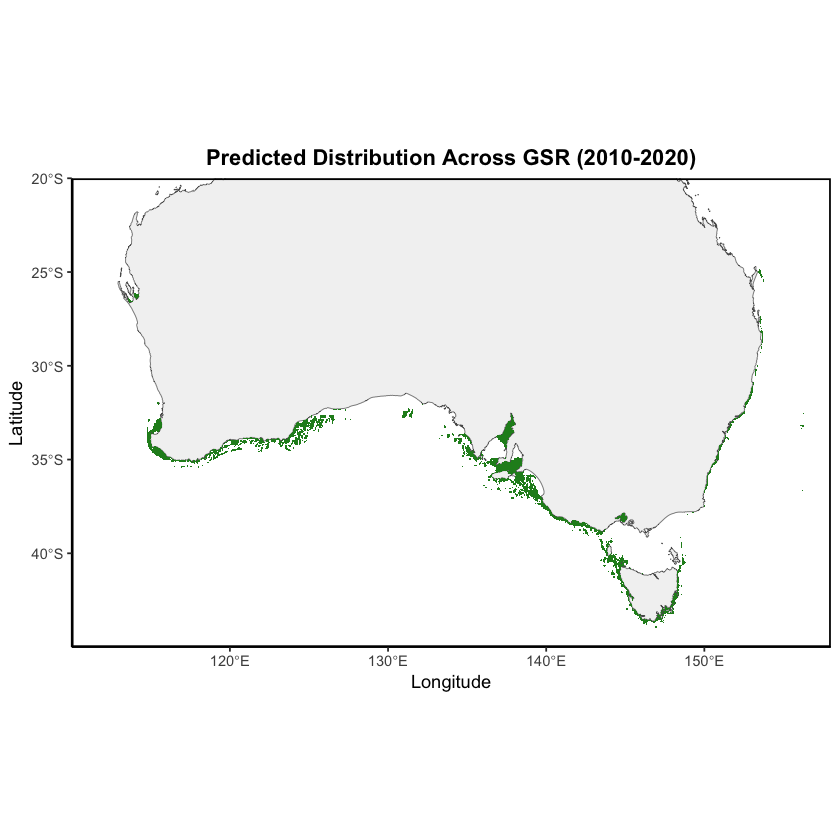

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


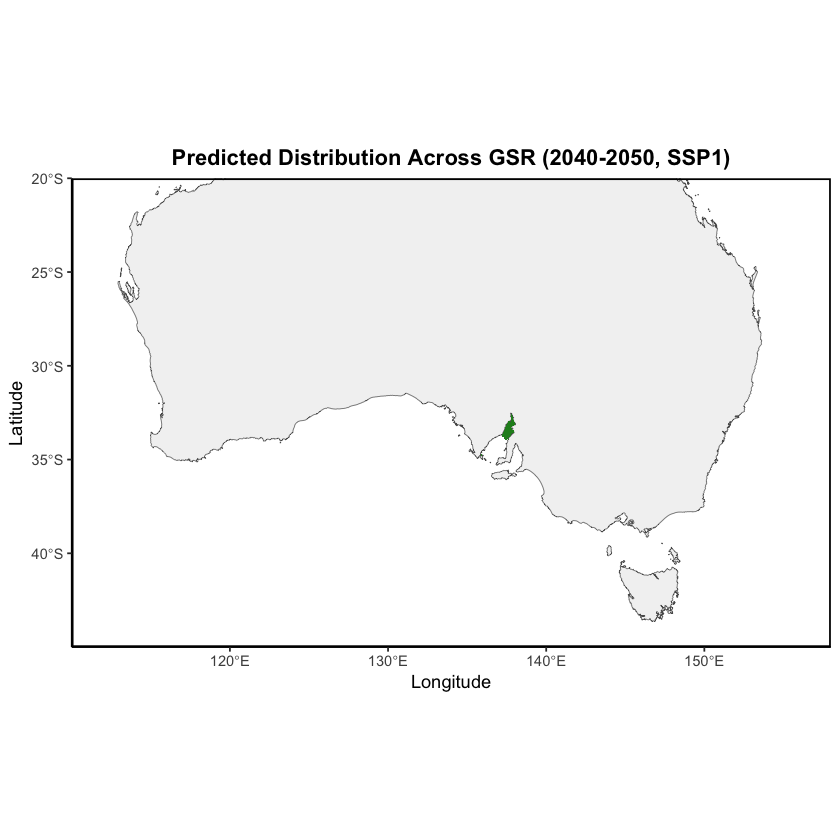

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


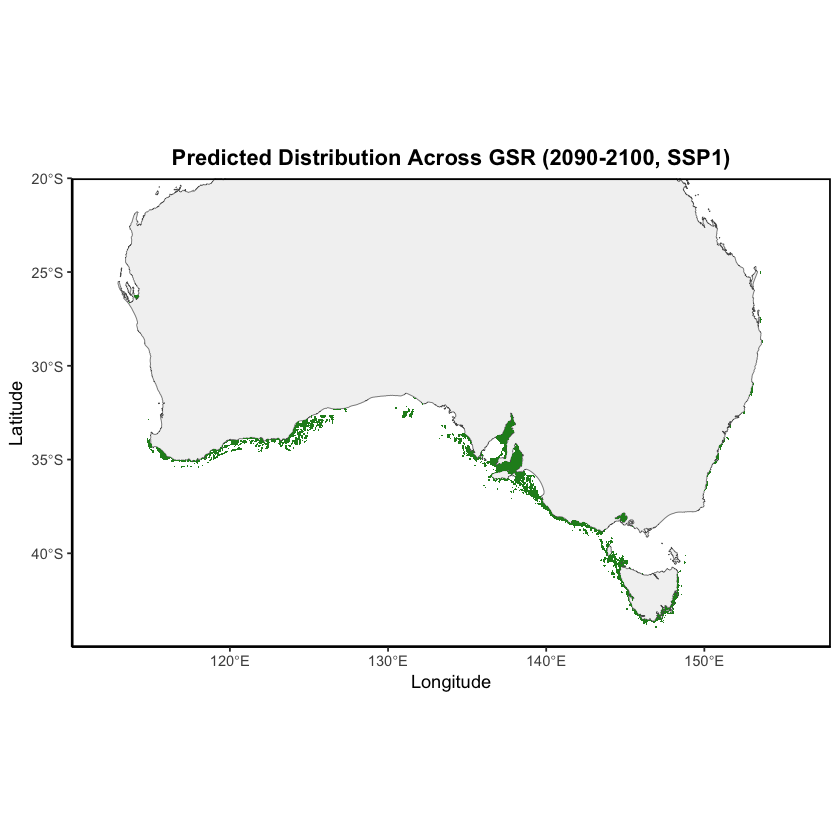

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


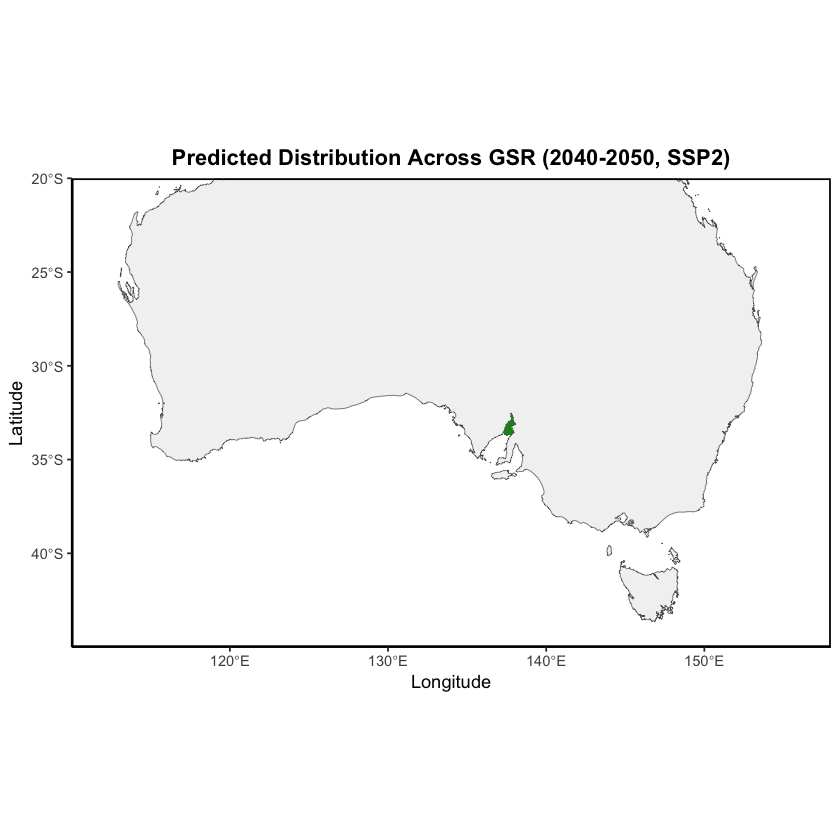

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


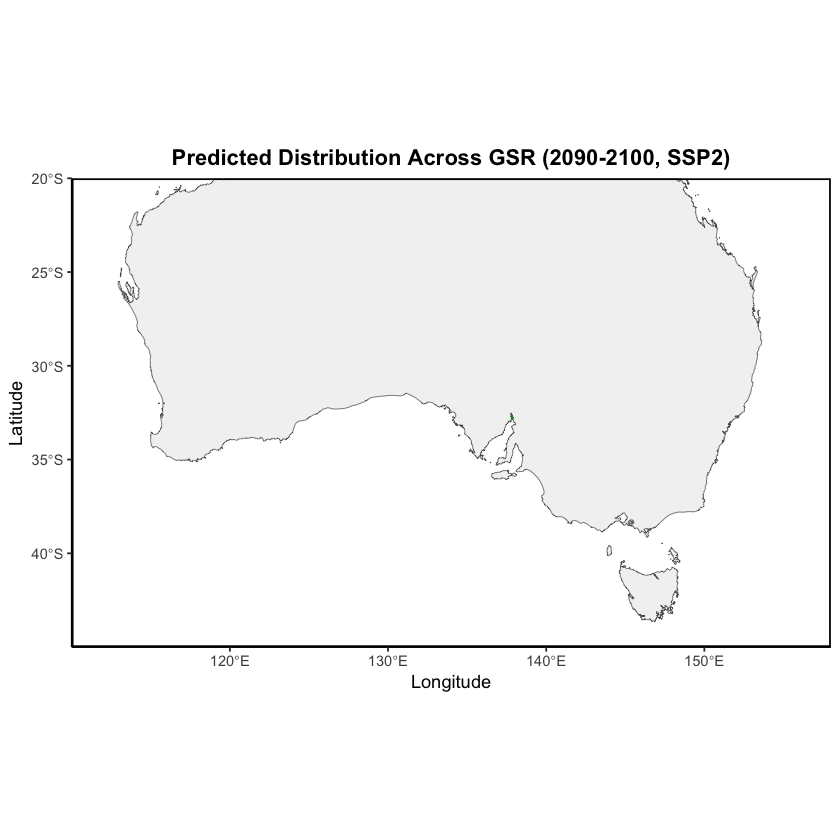

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


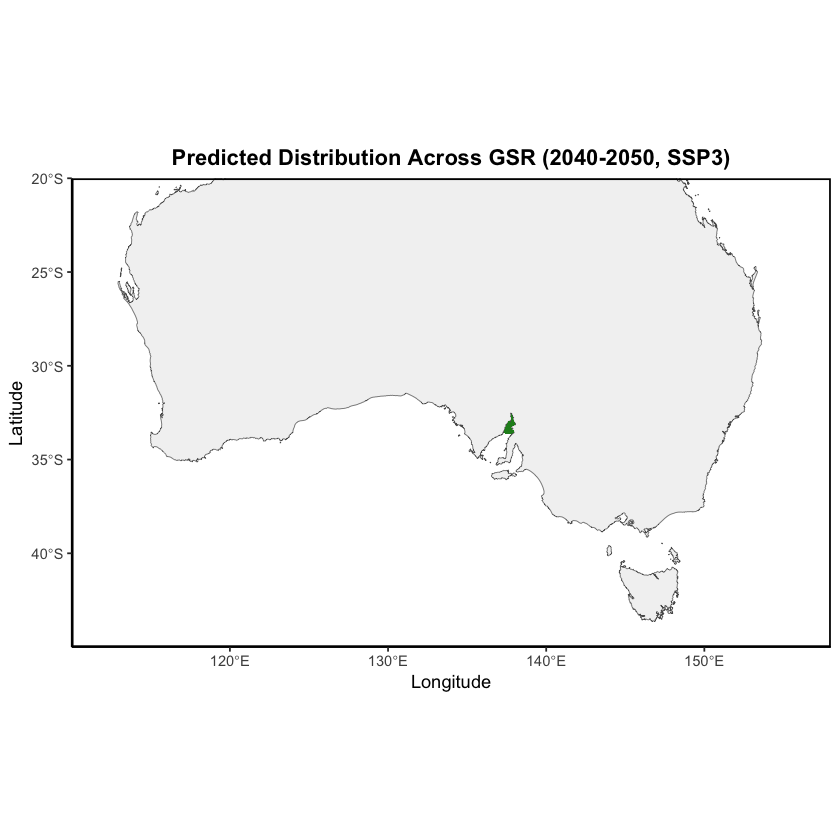

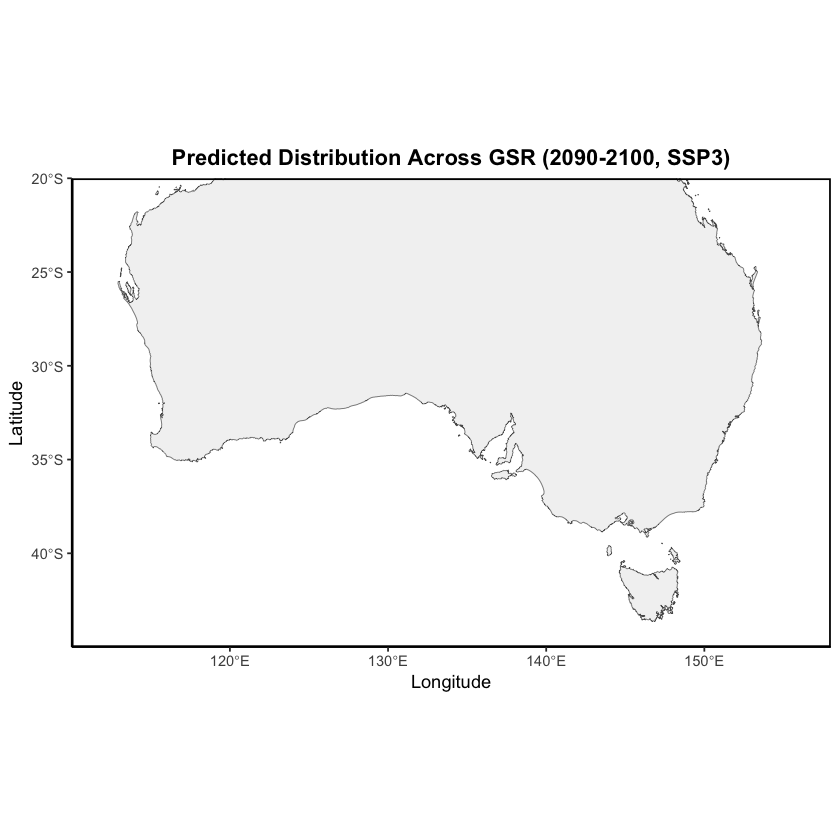

In [116]:
glm_plotthresholdedmap_list <- list(
    list(
         model_pred = glm_2010, 
         threshold = glm_threshold,
         year_range = "2010-2020"),
    list(
         model_pred = glm_2040ssp1, 
         threshold = glm_threshold,
         year_range = "2040-2050, SSP1"),
    list(
         model_pred = glm_2090ssp1, 
         threshold = glm_threshold,
         year_range = "2090-2100, SSP1"),
    list(
         model_pred = glm_2040ssp2, 
         threshold = glm_threshold,
         year_range = "2040-2050, SSP2"),
    list(
         model_pred = glm_2090ssp2, 
         threshold = glm_threshold,
         year_range = "2090-2100, SSP2"),
    list(
         model_pred = glm_2040ssp3, 
         threshold = glm_threshold,
         year_range = "2040-2050, SSP3"),
    list(
         model_pred = glm_2090ssp3, 
         threshold = glm_threshold,
         year_range = "2090-2100, SSP3"))

glm_threshmap_results <- lapply(glm_plotthresholdedmap_list, # loop over each item in the list glm_plotthresholdedmap_list
    function(job) { # label each item in glm_plotthresholdedmap_list as a "job"
    do.call(plot_thresholded_map, job) # Call the function plot_thresholded_map, and apply the list of args associated with each "job"
})
    

### Generate Probability of Occurence Maps 

Use the glm_plotglmmap_list function to generate maps of the probability of occurence across GSR. Note that these maps do not have the bathymetry mask applied, and should be interpreted alongside a bathymetry map.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replac

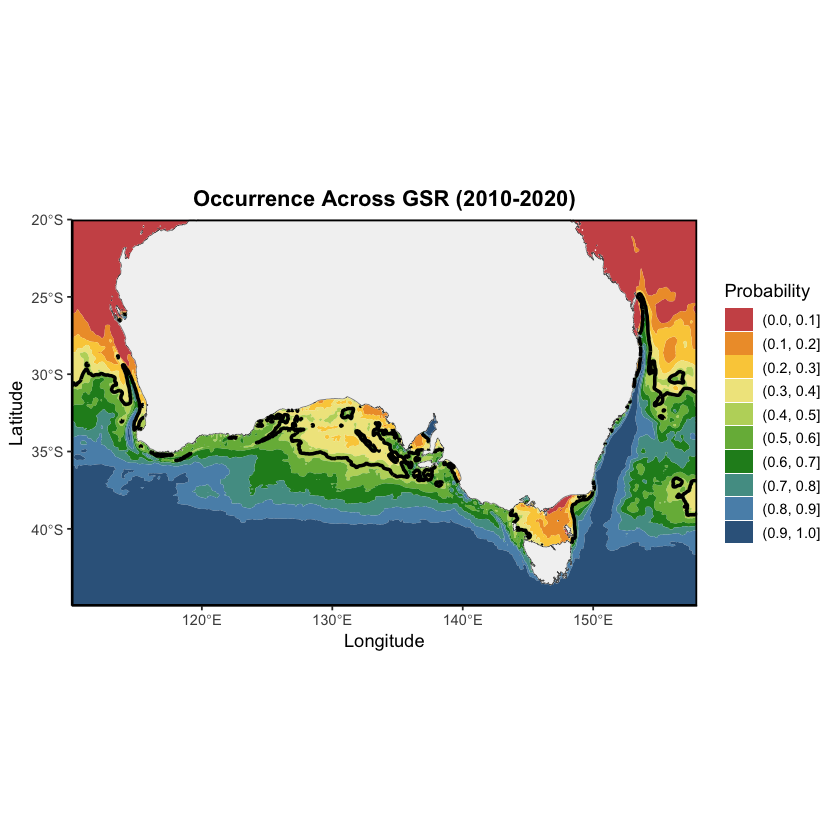

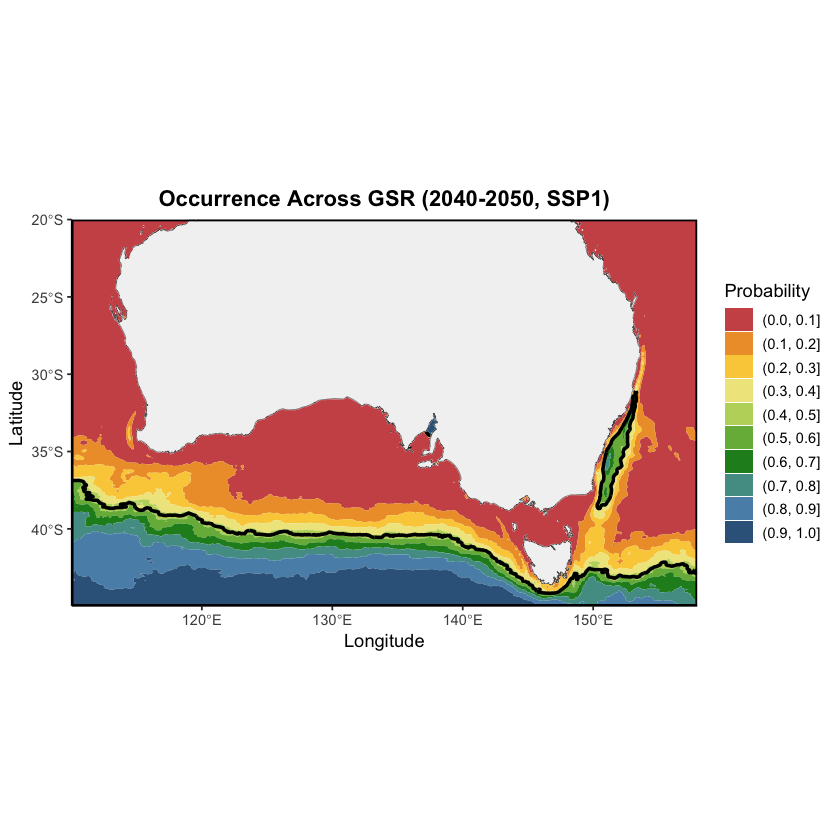

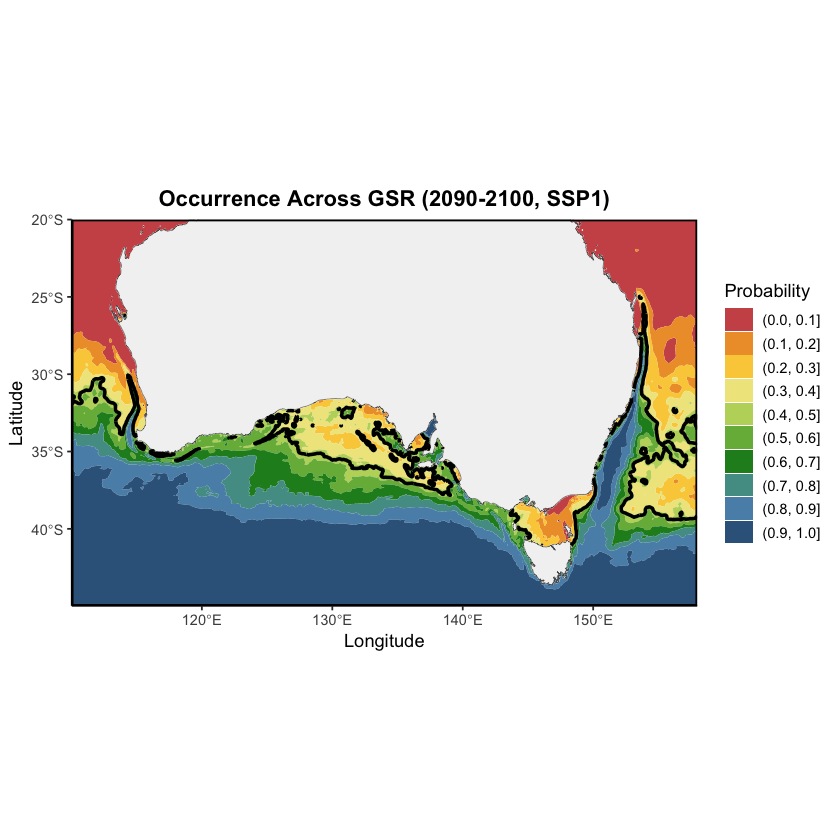

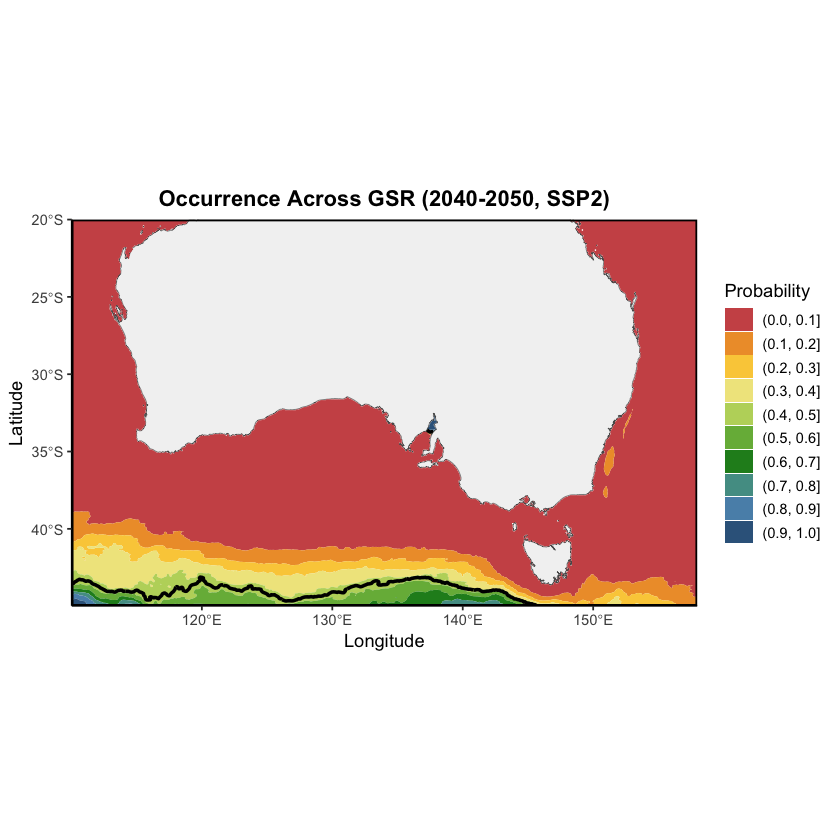

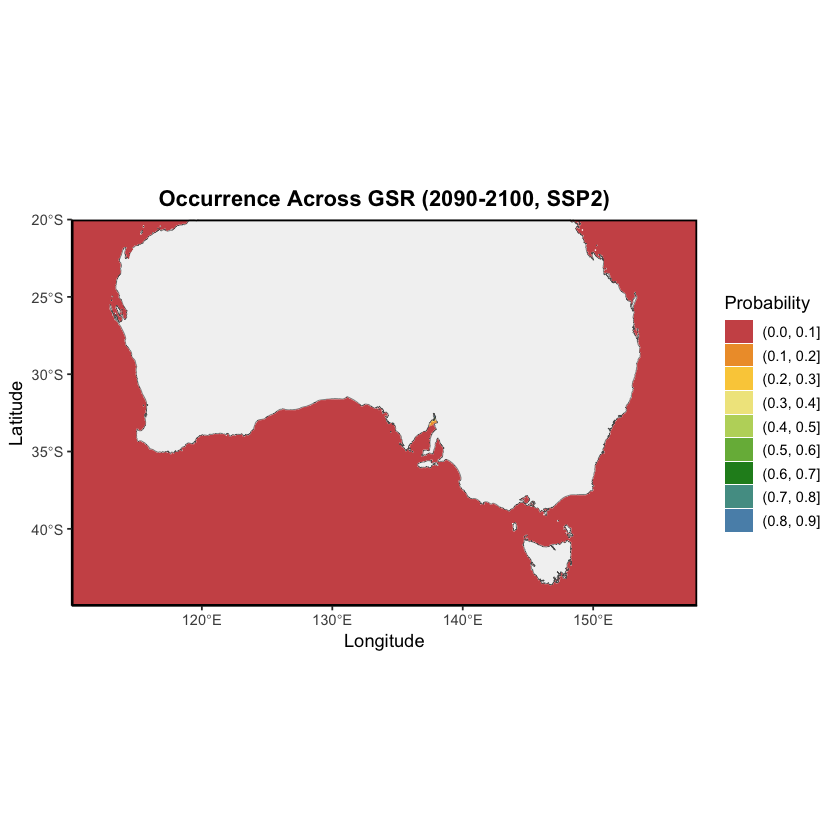

Warning message:
“In `tidyterra::geom_spatraster_contour()`: Zero contours were generated”
Warning message in min(x):
“no non-missing arguments to min; returning Inf”
Warning message in max(x):
“no non-missing arguments to max; returning -Inf”
Warning message:
“Computation failed in `stat_terra_spat_raster_contour()`.
Caused by error in `$<-.data.frame`:
! replacement has 1 row, data has 0”


[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]


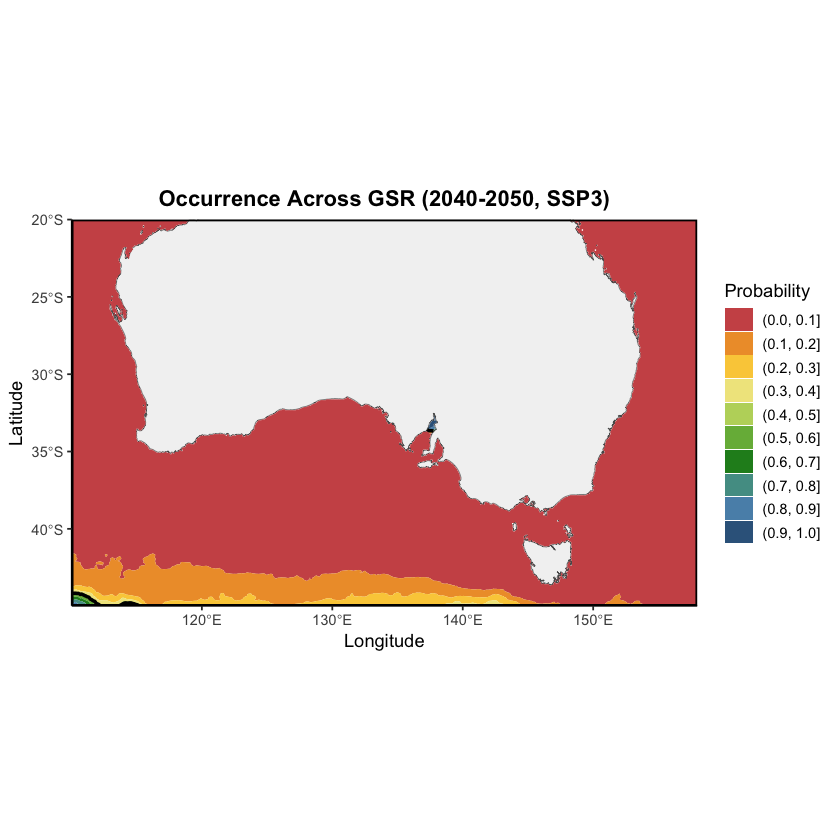

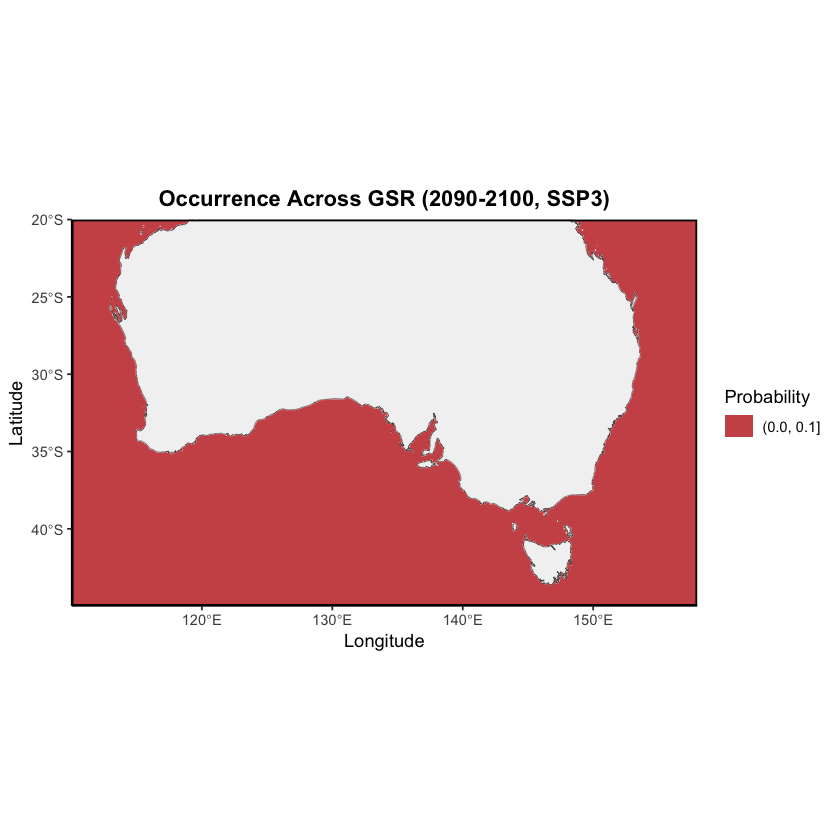

In [117]:
glm_plotglmmap_list <- list(
    list(
         env_data = envdata_2010_gsr,
         year_range = "2010-2020"),
    list(
         env_data = env_2040ssp1,
         year_range = "2040-2050, SSP1"),
    list(
         env_data = env_2090ssp1,
         year_range = "2090-2100, SSP1"),
    list(
         env_data = env_2040ssp2,
         year_range = "2040-2050, SSP2"),
    list(
         env_data = env_2090ssp2,
         year_range = "2090-2100, SSP2"),
    list(
         env_data = env_2040ssp3,
         year_range = "2040-2050, SSP3"),
    list(
         env_data = env_2090ssp3,
         year_range = "2090-2100, SSP3"))

glm_plotmap_results <- lapply(glm_plotglmmap_list, # loop over each item in the list glm_plotglmmap_list
    function(job) { # label each item in glm_plotglmmap_list as a "job"
    do.call(plot_glm_map, job) # Call the function plot_glm_map, and apply the list of args associated with each "job"
})

glm_plotmap_results

---

# **MaxEnt**

## **Adjust Training and Testing Datasets**

The final predictor variables used in the GLM were: no3_mean, ph_mean, so_mean, sws_ltmin, and thetao_ltmax. To keep models comparable, we will use the same variables in the MaxEnt model.

**Step 1:** Adjust the training dataset to only include variables used in the GLM.

In [118]:
# Visualise training data
head(training)

,pa,o2_mean,no3_mean,ph_mean,po4_mean,phyc_ltmax,phyc_ltmin,so_mean,sws_ltmax,sws_ltmin,thetao_ltmax,thetao_ltmin,thetao_mean
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2,1,247.3037,0.07803244,8.082132,0.1105563,3.108581,1.397702,35.76738,0.2091638,0.06519728,19.98576,12.66339,16.03495
4,1,247.2221,0.07520513,8.081440,0.1094683,3.141531,1.451829,35.77265,0.1377461,0.04271005,20.14606,12.54012,16.04625
6,1,247.2221,0.07520513,8.081440,0.1094683,3.141531,1.451829,35.77265,0.1377461,0.04271005,20.14606,12.54012,16.04625
7,1,247.0374,0.07759946,8.082767,0.1089191,3.304445,1.365320,35.79221,0.1882085,0.19855091,19.81542,12.45381,15.98660
8,1,247.0374,0.07759946,8.082767,0.1089191,3.304445,1.365320,35.79221,0.1882085,0.19855091,19.81542,12.45381,15.98660
9,1,247.0414,0.07796516,8.082800,0.1089699,3.301635,1.362834,35.78881,0.2096385,0.20553088,19.74090,12.49246,15.97193


In [119]:
# Only keep the same variables as the GLM
training_selected <- training[, c("pa", "thetao_ltmax", "sws_ltmin", "no3_mean", "so_mean", "ph_mean")]
head(training_selected)

,pa,thetao_ltmax,sws_ltmin,no3_mean,so_mean,ph_mean
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2,1,19.98576,0.06519728,0.07803244,35.76738,8.082132
4,1,20.14606,0.04271005,0.07520513,35.77265,8.081440
6,1,20.14606,0.04271005,0.07520513,35.77265,8.081440
7,1,19.81542,0.19855091,0.07759946,35.79221,8.082767
8,1,19.81542,0.19855091,0.07759946,35.79221,8.082767
9,1,19.74090,0.20553088,0.07796516,35.78881,8.082800


**Step 2:** Adjust the testing dataset to only include variables used in the GLM.

In [120]:
# Visualise the testing data
head(testing)

,pa,o2_mean,no3_mean,ph_mean,po4_mean,phyc_ltmax,phyc_ltmin,so_mean,sws_ltmax,sws_ltmin,thetao_ltmax,thetao_ltmin,thetao_mean
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,247.3037,0.07803244,8.082132,0.1105563,3.108581,1.3977021,35.76738,0.2091638,0.06519728,19.98576,12.66339,16.03495
3,1,247.3037,0.07803244,8.082132,0.1105563,3.108581,1.3977021,35.76738,0.2091638,0.06519728,19.98576,12.66339,16.03495
5,1,247.3037,0.07803244,8.082132,0.1105563,3.108581,1.3977021,35.76738,0.2091638,0.06519728,19.98576,12.66339,16.03495
13,1,247.1163,0.08433861,8.083286,0.1098888,3.230088,1.3214941,35.77903,0.2667529,0.17611837,19.61243,12.61737,15.95603
19,1,247.3934,0.08396564,8.083238,0.1118599,3.076440,1.3133154,35.76352,0.2553996,0.07777139,19.79344,12.69380,15.98394
23,1,246.2681,0.11352297,8.090405,0.1036360,2.518269,0.9715024,35.74361,0.1251680,0.03961684,19.98760,13.19384,16.22571


In [121]:
# Only keep the same variables as the GLM
testing_selected <- testing[, c("pa", "thetao_ltmax", "sws_ltmin", "no3_mean", "so_mean", "ph_mean")]
head(testing_selected)

,pa,thetao_ltmax,sws_ltmin,no3_mean,so_mean,ph_mean
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,19.98576,0.06519728,0.07803244,35.76738,8.082132
3,1,19.98576,0.06519728,0.07803244,35.76738,8.082132
5,1,19.98576,0.06519728,0.07803244,35.76738,8.082132
13,1,19.61243,0.17611837,0.08433861,35.77903,8.083286
19,1,19.79344,0.07777139,0.08396564,35.76352,8.083238
23,1,19.98760,0.03961684,0.11352297,35.74361,8.090405


**Step 3:** To train the maxent model, we need the predictor variables to be separated from the response variables. We can do this by removing the pa column from the training_selected dataframe.

In [122]:
# Make a subset of training dataset, without the presence and absence values
only_variables_Tr <- training_selected[,-1]
head(only_variables_Tr)

,thetao_ltmax,sws_ltmin,no3_mean,so_mean,ph_mean
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2,19.98576,0.06519728,0.07803244,35.76738,8.082132
4,20.14606,0.04271005,0.07520513,35.77265,8.081440
6,20.14606,0.04271005,0.07520513,35.77265,8.081440
7,19.81542,0.19855091,0.07759946,35.79221,8.082767
8,19.81542,0.19855091,0.07759946,35.79221,8.082767
9,19.74090,0.20553088,0.07796516,35.78881,8.082800


## **Build the MaxEnt Model**

We can now use the maxnet() formula from the maxnet package to build the model.

In [123]:
mN_model <- maxnet(training$pa, # presence-background data
                   only_variables_Tr) # predictor variables

## **Examine Contribution of Environmental Variables**

### Response Curves

Generate response curves for each of the environmental variables included in the model.

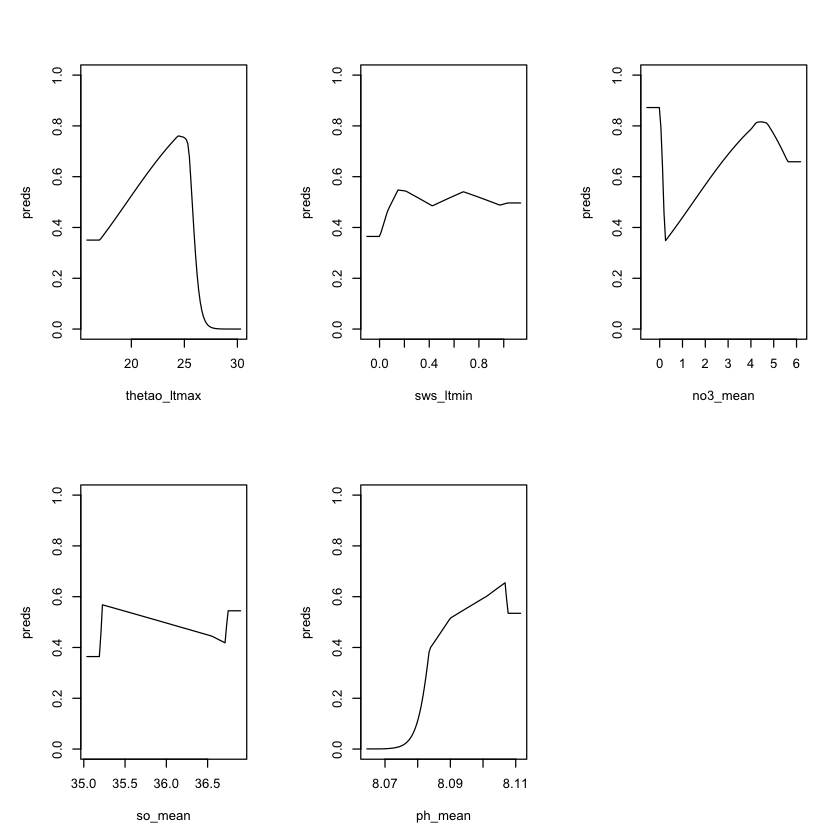

In [124]:
plot(mN_model, type="logistic")

**Interpretation:**
- thetao_ltmax: Probability of occurence increases between 16 and 25°C. Then rapidly drops to 0.
- sws_ltmin: Probability of occurence increases as sws_ltmin increases, plateauing at around 1.0 m/s.
- no3_mean: Probability of occurence increases as no3_mean increases, peaking at around 4.5, then dropping.
- so_mean: Probability of occurence gradually decreases as salinity increases. Then increases again at around 36.75.
- ph_mean: Probability of occurence rapidly increases from 0 at 8.07 to 0.4 at 8.08. Then gradually increases as pH increases, until 8.10-8.11, when there is a drop. 

## **Calculate AUC from ROC**

In [125]:
# Apply the MaxNet model to the testing dataset
testing_maxnet <- testing_selected
testing_maxnet$pred_maxnet <- predict(
    mN_model, 
    newdata = testing_maxnet, 
    type = "logistic")

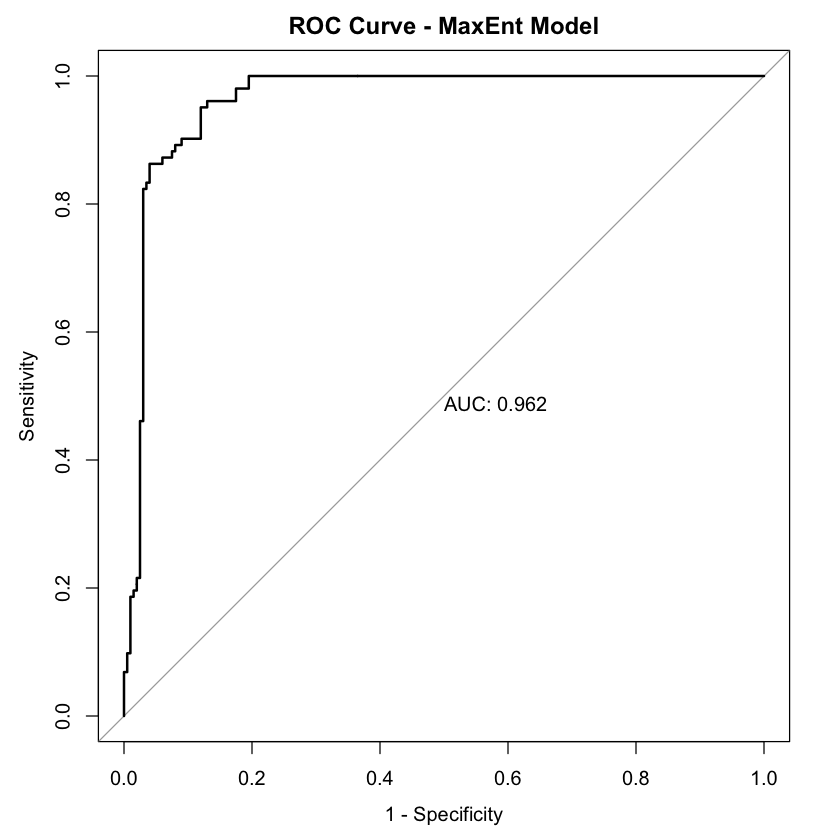

In [126]:
# Create ROC curve for MaxNet
roc_maxnet <- roc(
  response = testing_maxnet$pa, # actual presence/absence
  predictor = as.numeric(testing_maxnet$pred_maxnet), # predicted probabilities - make numeric to avoid error.
  quiet = TRUE)

# Plot ROC and show AUC
plot(roc_maxnet, 
     print.auc = TRUE, 
     legacy.axes = TRUE, 
     main = "ROC Curve - MaxEnt Model")

In [127]:
# Calculate the AUC
auc_maxnet <- roc_maxnet$auc
auc_maxnet

Area under the curve: 0.9625

This AUC is slightly better than our GLM's AUC of 0.93.

## **Present-Day Distribution in Sample Area**

### Masked Probability (Sample Area)

**Step 1:** To predict habitat suitability via a maxnet function, we need a raster stack.

In [128]:
env_stack <- raster::stack(envdata_cropped) # creating a raster stack from masked data

**Step 2:** Predict habitat suitability across the sample area using MaxNet

In [129]:
maxnet_samplearea <- predict(env_stack, # environmental raster stack
                             mN_model, # our maxent model
                             type = "logistic",
                             na.rm = TRUE)

**Step 3:** Convert output to spatraster so we can map it in ggplot.

In [130]:
# Convert to SpatRaster (terra format)
maxnet_samplearea <- rast(maxnet_samplearea)

**Step 4:** Create a mask to exclude areas deeper than 50 m

In [131]:
# Mask areas deeper than 50 m
maxnet_samplearea_50 <- mask(maxnet_samplearea, mask50_sample)

maxnet_samplearea_masked <- ifel(
  is.na(maxnet_samplearea_50) & !is.na(crop(bath_min, sample_extent)),
  0, # Make probability 0 when in deep water and not on land
  maxnet_samplearea_50)

**Step 5:** Generate map

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


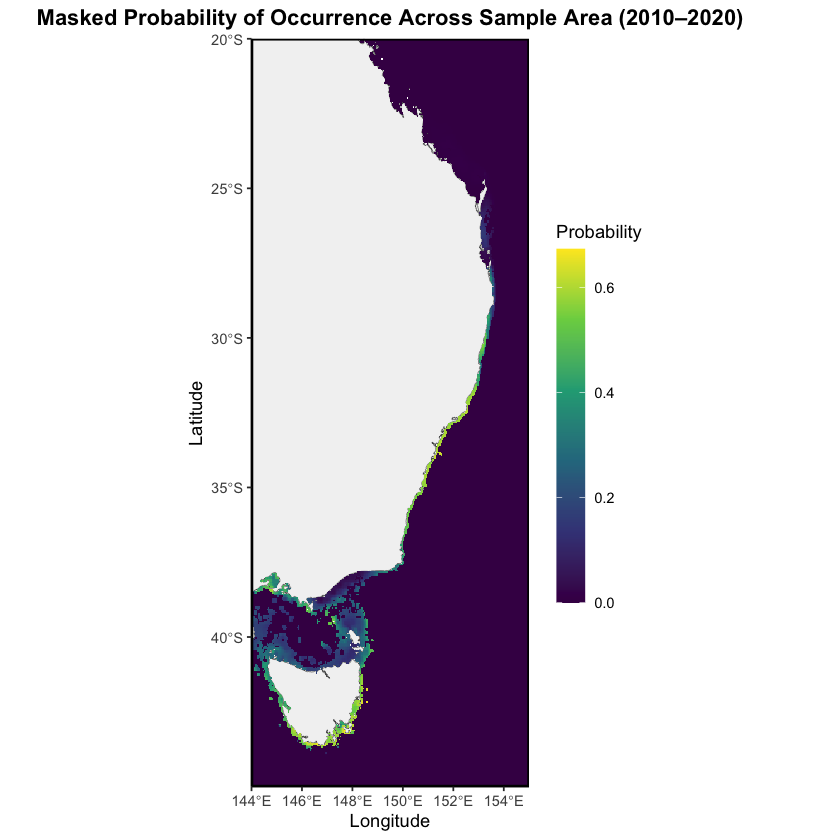

In [132]:
# Habitat suitability map
maxnet_samplearea_2010 <- sample_map +
    geom_spatraster(data = maxnet_samplearea_masked) +
    scale_fill_viridis_c(name = "Probability", na.value = "transparent") +
    coord_sf(expand = FALSE) +
    theme(legend.key.height = unit(1.5, "cm")) +
    labs(title = "Masked Probability of Occurrence Across Sample Area (2010–2020)")

maxnet_samplearea_2010

### Presence Threshold (Sample Area)

We now need to calculate the presence threshold.

In [133]:
# Use test data to evaluate the MaxNet model
maxnet_eval <- pa_evaluate(
    p = testing[testing_selected$pa == 1, ],
    a = testing[testing_selected$pa == 0, ],
    model = mN_model,
    type = "logistic")

# View evaluation results
maxnet_eval

@stats
   np  na prevalence   auc   cor pcor   ODP
1 102 200      0.338 0.963 0.818    0 0.662

@thresholds
  max_kappa max_spec_sens no_omission equal_prevalence equal_sens_spec
1     0.473         0.277       0.209            0.333           0.351

@tr_stats
    treshold kappa  CCR  TPR TNR FPR  FNR  PPP  NPP  MCR  OR
1          0     0 0.34    1   0   1    0 0.34  NaN 0.66 NaN
2          0     0 0.34    1   0   1    0 0.34  NaN 0.66 NaN
3          0     0 0.34    1   0   1    0 0.34  NaN 0.66 NaN
4        ...   ...  ...  ... ... ...  ...  ...  ...  ... ...
272     0.65  0.01 0.67 0.01   1   0 0.99    1 0.66 0.33 Inf
273     0.65  0.01 0.67 0.01   1   0 0.99    1 0.66 0.33 Inf
274     0.65     0 0.66    0   1   0    1  NaN 0.66 0.34 NaN

Max_spec_sens finds the threshold where the sum of the sensitivity and specificity (true positive and true negative rates) is the greatest. 

In [134]:
# Determine the minimum threshold for presence using max_spec_sens
maxnet_threshold <- maxnet_eval@thresholds$max_spec_sens
maxnet_threshold

[1] 0.2766775

In [135]:
# Identify which cells are above/below threshold
maxnet_threshold_data <- as.factor(maxnet_samplearea_masked > maxnet_threshold)
maxnet_threshold_data

class       : SpatRaster 
size        : 500, 220, 1  (nrow, ncol, nlyr)
resolution  : 0.04999999, 0.05  (x, y)
extent      : 144, 155, -45, -20  (xmin, xmax, ymin, ymax)
coord. ref. : +proj=longlat +datum=WGS84 +no_defs 
source(s)   : memory
categories  : layer 
name        : layer 
min value   :     0 
max value   :     1 

Ensure coordinate reference system is in the correct format

In [136]:
# Assign WGS84 coordinate reference system (EPSG:4326) to the MaxNet raster
crs(maxnet_threshold_data) <- "EPSG:4326"

In [137]:
maxnet_threshold_data

class       : SpatRaster 
size        : 500, 220, 1  (nrow, ncol, nlyr)
resolution  : 0.04999999, 0.05  (x, y)
extent      : 144, 155, -45, -20  (xmin, xmax, ymin, ymax)
coord. ref. : lon/lat WGS 84 (EPSG:4326) 
source(s)   : memory
categories  : layer 
name        : layer 
min value   :     0 
max value   :     1 

Create the threshold map.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


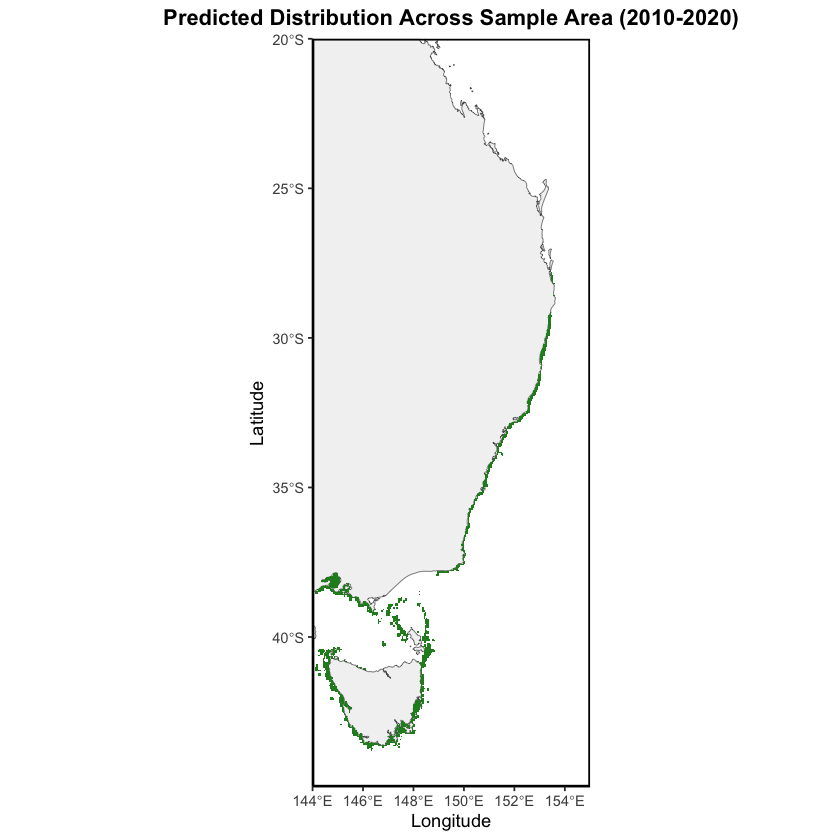

In [138]:
mNthresh_samplearea_2010 <- sample_map +
    geom_spatraster(data = maxnet_threshold_data) +
    scale_fill_manual(
        values = c("0" = "transparent", "1" = "forestgreen"),
        na.value = "transparent",
        guide = "none") +
    coord_sf(expand = FALSE) +
    theme(legend.key.height = unit(1.5, "cm")) +
    labs(title = "Predicted Distribution Across Sample Area (2010-2020)")

mNthresh_samplearea_2010

### Probability of Occurence (Sample Area)

**Note:** This map does not include a depth mask. It needs to be interpreted alongside the bathymetry map to understand where ecklonia radiata could actually occur. 
- Black line = the Maxent Models's presence threshold (calculated above to be 0.26701476)
- Colours = probability of occurence values (0=red to 1=blue)
- Green dots = presence points

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


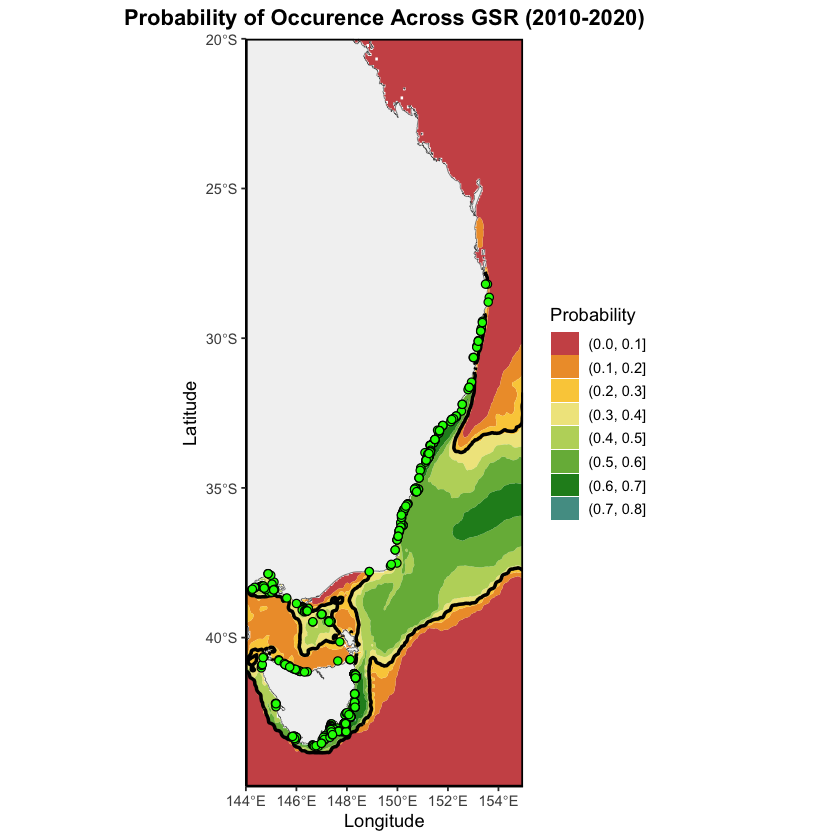

In [139]:
# Habitat suitability map - unmasked
mNDist_2010sample_unmasked <- sample_map +
    geom_spatraster_contour_filled(data = maxnet_samplearea,
                                   breaks = seq(0, 1, 0.1)) +
    scale_fill_manual(name = "Probability",
                      values = colorRampPalette(c("indianred3", "goldenrod1", "khaki", "darkolivegreen3", "forestgreen", "skyblue3", "steelblue4"))(10),
                      na.value = "transparent") +
    coord_sf(expand = FALSE) +
    theme(legend.key.height = unit(0.5, "cm")) +
    labs(title = "Probability of Occurence Across GSR (2010-2020)")

# Add threshold contour and presence points
mNDist_2010sample_thresh <-  mNDist_2010sample_unmasked +
    geom_spatraster_contour(data = maxnet_samplearea, # Threshold Contour
                           breaks = maxnet_threshold,
                           colour = "black",
                           linewidth = 1) +
    geom_point(data = obs_unique, # Presence points
               aes(x = longitude, y = latitude),
               shape = 21,
               size = 2,
               colour = "black",
               fill = "green") +
    coord_sf(expand = FALSE)


mNDist_2010sample_thresh

## **Predict Across GSR**

### Function: Predict Probability of Occurence from Maxent

Create function to predict probability of occurence across GSR using mN_model:

In [140]:
predict_maxnet_gsr <- function(env_data) {
    # Step 1: Crop environmental data to GSR extent
    env_gsr <- crop(env_data, gsr_extent)
    
    # Step 2: Stack raster layers (for MaxNet prediction)
    env_stack <- raster::stack(env_gsr)
    
    # Step 3: Predict habitat suitability using fitted MaxNet model
    maxnet_pred <- predict(env_stack,
                           mN_model,
                           type = "logistic",
                           na.rm = TRUE)
    
    # Step 4: Convert to SpatRaster for compatibility with terra functions
    maxnet_pred <- rast(maxnet_pred)
    
    # Step 5: Mask areas deeper than 50 m (using GSR-scale mask)
    maxnet_pred_50 <- mask(maxnet_pred, mask50_gsr)
    
    # Step 6: Set probability to 0 for deep water or land
    maxnet_pred_masked <- ifel(
        is.na(maxnet_pred_50) & !is.na(crop(bath_min, gsr_extent)),
        0,
        maxnet_pred_50)
    
    return(maxnet_pred_masked)
}

### Function: Probability of Occurence Maps

In [141]:
# Function to predict and plot MaxNet habitat suitability across the GSR
plot_maxnet_map <- function(env_data, year_range) {
    
    # Step 1: Crop environmental data to GSR extent
    env_gsr <- crop(env_data, gsr_extent)
    
    # Step 2: Stack raster layers (for MaxNet prediction)
    env_stack <- raster::stack(env_gsr)
    
    # Step 3: Predict habitat suitability
    maxnet_pred <- predict(
        env_stack,         
        mN_model,
        type = "logistic",
        na.rm = TRUE)
    
    # Step 4: Convert to SpatRaster (terra format)
    maxnet_pred <- rast(maxnet_pred)
    
    # Step 5: Build filled contour map (unmasked)
    map_unmasked <- gsr_map +
        geom_spatraster_contour_filled(
            data = maxnet_pred,
            breaks = seq(0, 1, 0.1)) +
        scale_fill_manual(
            name = "Probability",
            values = colorRampPalette(c("indianred3", "goldenrod1", "khaki", "darkolivegreen3", "forestgreen", "skyblue3", "steelblue4"))(10),
            na.value = "transparent") +
        coord_sf(expand = FALSE) +
        theme(legend.key.height = unit(0.5, "cm")) +
        labs(title = paste("Occurrence Across GSR (", year_range, ")", sep = ""))
    
    # Step 6: Add threshold contour line
    map_thresh <- map_unmasked +
        geom_spatraster_contour(
            data = maxnet_pred,
            breaks = maxnet_threshold,
            colour = "black",
            linewidth = 1) +
        coord_sf(expand = FALSE)
    
    return(map_thresh)
}

### Maps for 2010

We can now map present-day distribution across the GSR

**Step 1:** Use the predict_maxnet_gsr function to predict present-day distribution across the GSR

In [142]:
# Predict for present-day distribution
mN_2010 <- predict_maxnet_gsr(env_data = envdata_2010)

**Step 2:** Use the plot_masked_map function (created in the GLM section of the notebook) to map probability of occurence across masked area

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


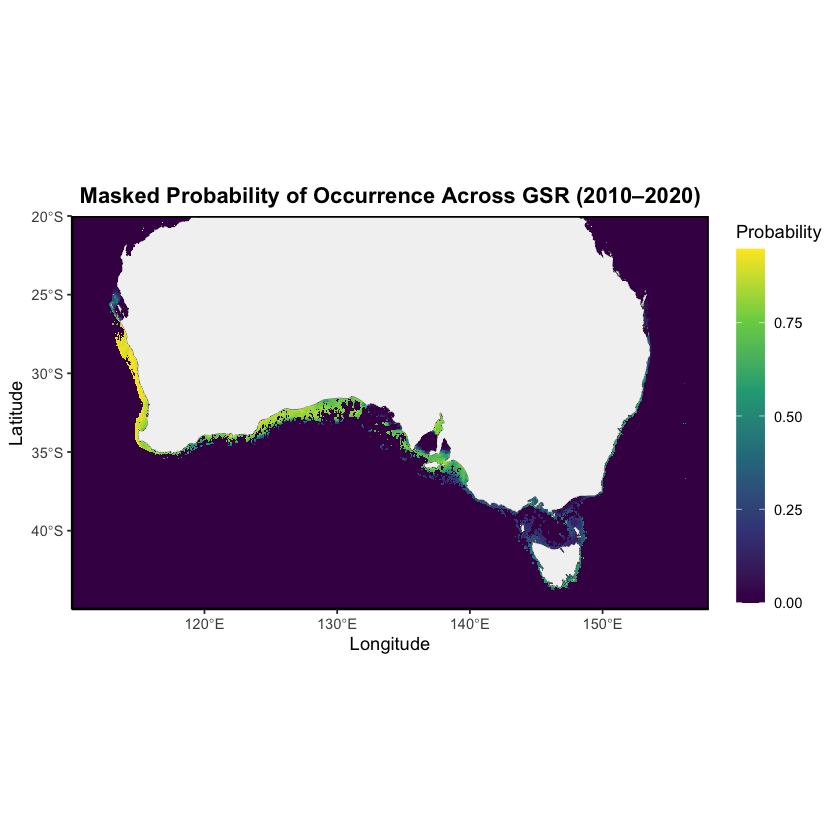

In [143]:
# Use plot_masked_map function for 2010-2020
mNDist_2010 <- plot_masked_map(model_pred = mN_2010, 
                                year_range = "2010–2020")

**Step 3:** Use the plot_thresholded_map function (created in the GLM section of the notebook) to map predicted distribution across masked area

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


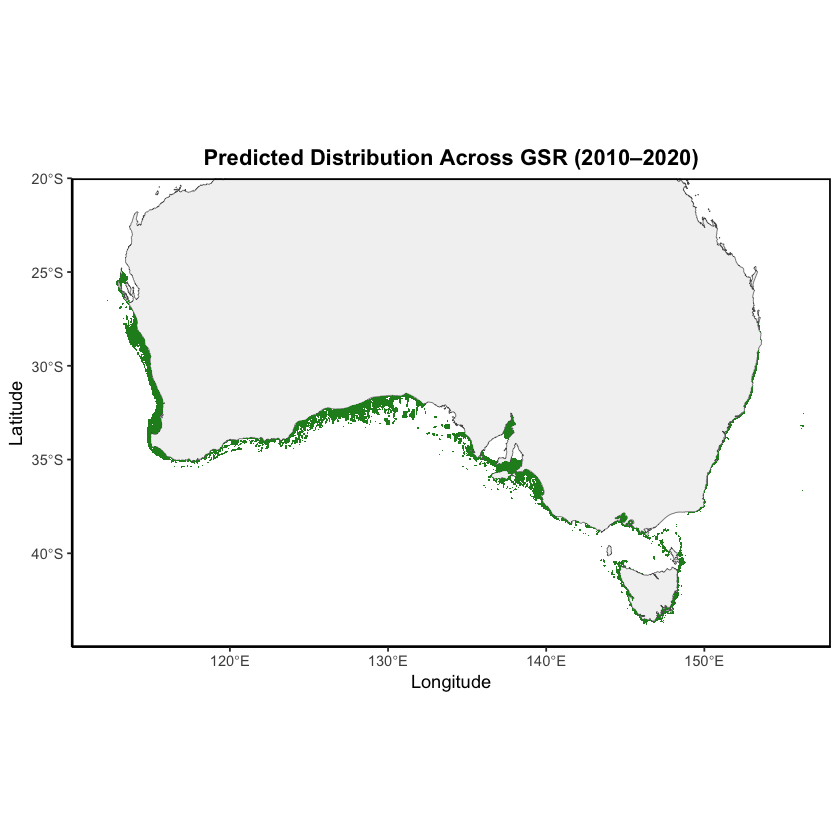

In [144]:
# Use the plot_thresholded_map function for 2010-2020
mNThresh_2010 <- plot_thresholded_map(model_pred = mN_2010, 
                                      threshold = maxnet_threshold,
                                      year_range = "2010–2020")

**Step 4:** Use the plot_maxnet_map function to map probability of occurence across GSR. Remember this map needs to be interpreted alongside the bathymetry map to determine where ecklonia radiata could actually be present. 

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


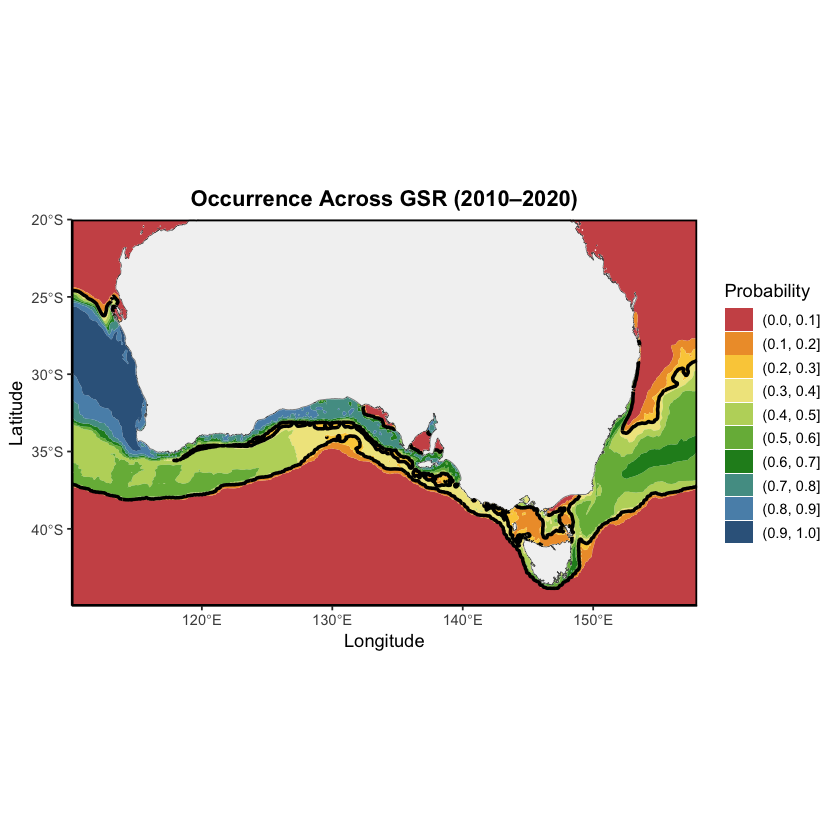

In [145]:
# use plot_maxnet_map function for 2010
occur_mN_2010 <- plot_maxnet_map(env_data = envdata_2010,
                               year_range = "2010–2020")
occur_mN_2010

### Habitat in 2010

Calculate suitable habitat in 2010. These values will be used to calculate loss of habitat under different SSP scenarioes in future years.

In [146]:
# Find cells where probability of occurence is above presence threshold
pa_max_2010 <- as.factor(mN_2010 > maxnet_threshold)

# Calculate the number of cells where ecklonia radiata is predicted to occur
cover_max_2010 <- global(pa_max_2010, "sum", na.rm = TRUE)[[1]]

## **2040-2050 SSP1**

### Maps for 2040 SSP1

**Step 1:** Predict the probabiltiy of occurence across the GSR using the predict_maxnet_gsr function.

In [147]:
# use predict_maxnet_gsr function
mN_2040ssp1 <- predict_maxnet_gsr(env_data = env_2040ssp1)

**Step 2:** Map the probabiltiy of occurence across the GSR using the plot_masked_map function.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


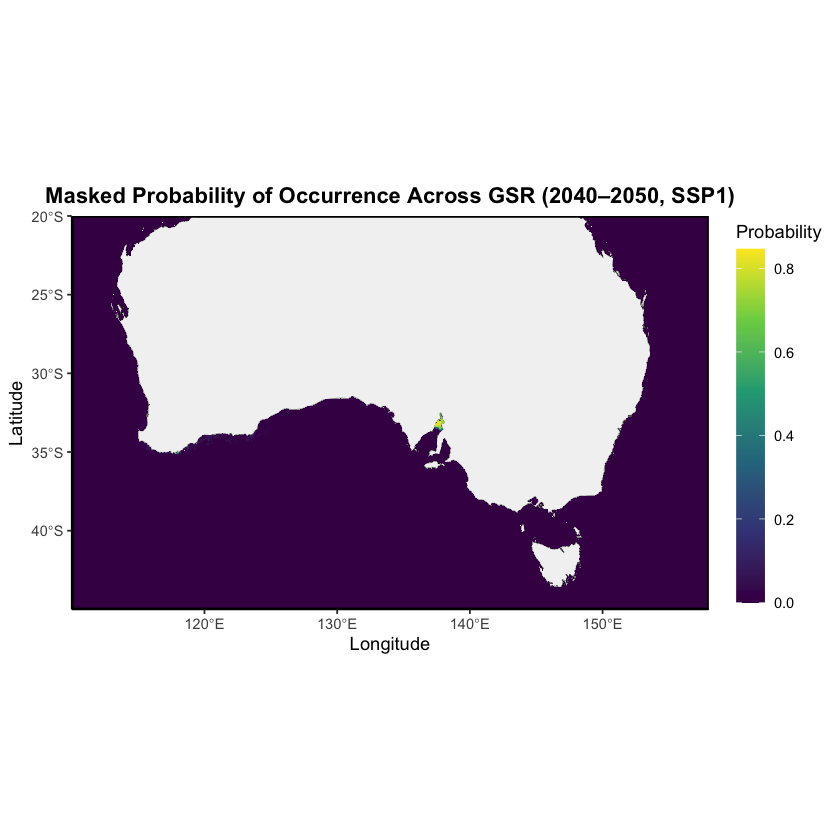

In [148]:
# Use plot_masked_map function
mNDist_2040ssp1 <- plot_masked_map(model_pred = mN_2040ssp1, 
                                   year_range = "2040–2050, SSP1")

**Step 3:** Plot the predicted distribution across the GSR using the plot_thresholded_map function

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


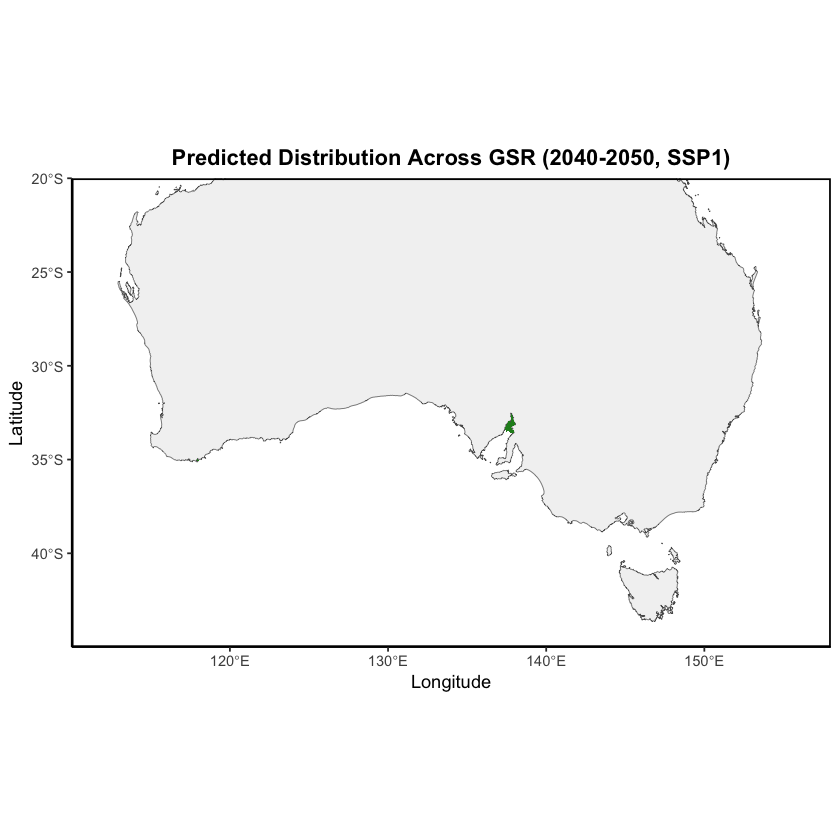

In [149]:
# Use the plot_thresholded_map function
mNThresh_2040ssp1 <- plot_thresholded_map(model_pred = mN_2040ssp1, 
                                           threshold = maxnet_threshold,
                                           year_range = "2040-2050, SSP1")

**Step 4:** Use the plot_maxnet_map function. Remember this map needs to be interpreted alongside the bathymetry map to determine where ecklonia radiata could actually be present.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


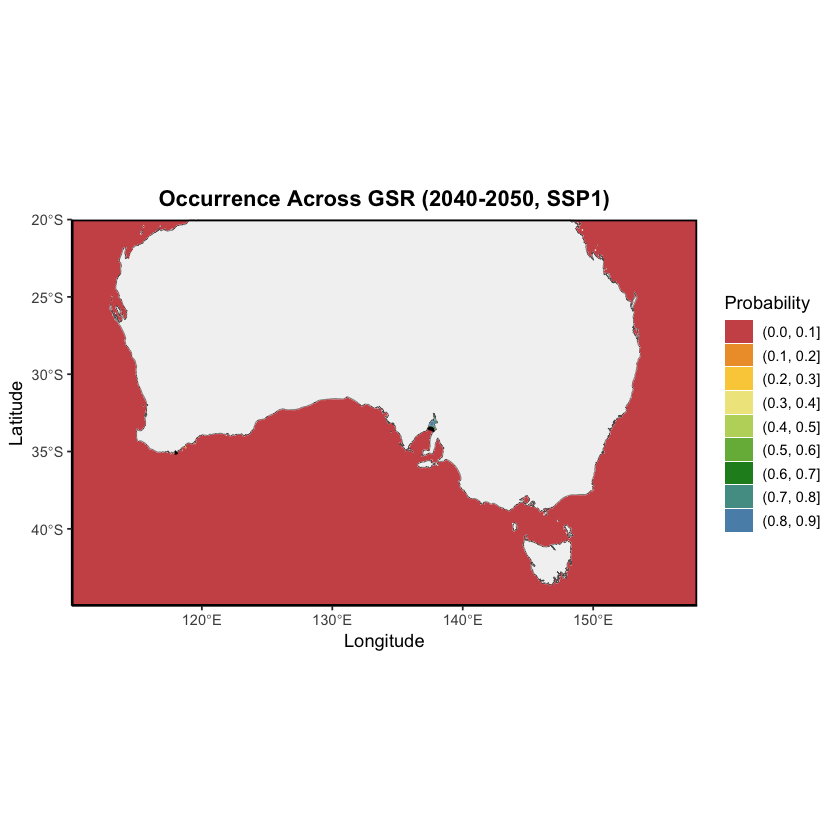

In [150]:
occur_mN_2040ssp1 <- plot_maxnet_map(env_data = env_2040ssp1,
                                     year_range = "2040-2050, SSP1")
occur_mN_2040ssp1

### Habitat Loss 2040 SSP1

Calculate habitat loss relative to 2010.

In [151]:
loss_maxnet_2040ssp1 <- habitat_loss(model_pred = mN_2040ssp1,
                                     threshold = maxnet_threshold,
                                     cover_2010 = cover_max_2010)
loss_maxnet_2040ssp1

[1] 98.43052

## **2090-2100 SSP1**

### Maps for 2090 SSP1

**Step 1:** Predict the probabiltiy of occurence across the GSR using the predict_maxnet_gsr function.

In [152]:
# use predict_maxnet_gsr function
mN_2090ssp1 <- predict_maxnet_gsr(env_data = env_2090ssp1)

**Step 2:** Map the probabiltiy of occurence across the GSR using the plot_masked_map function.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


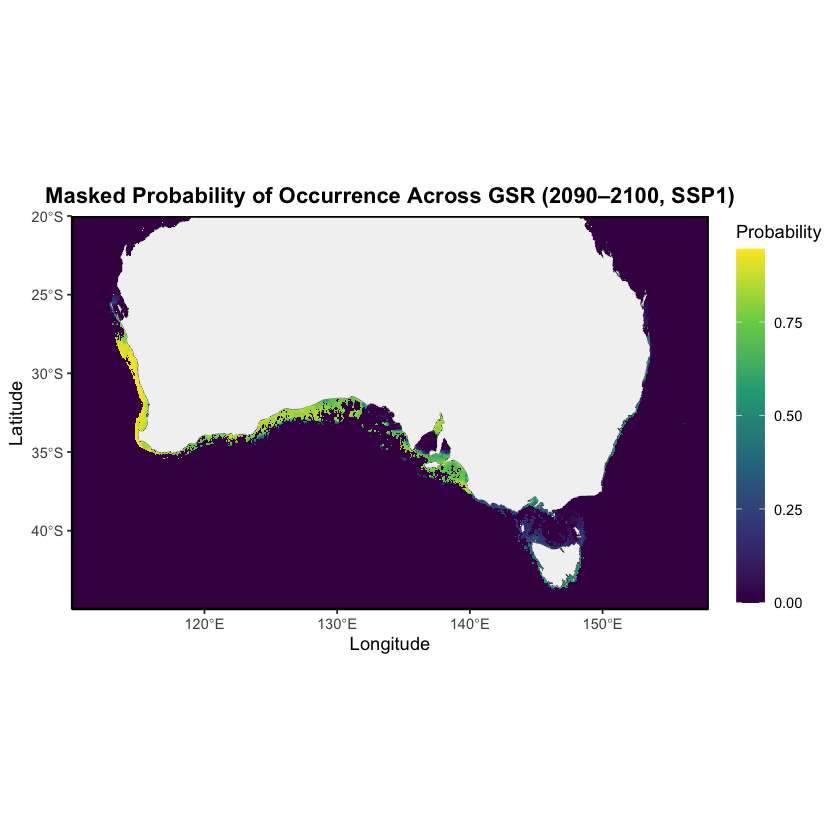

In [153]:
# Use plot_masked_map function
mNDist_2090ssp1 <- plot_masked_map(model_pred = mN_2090ssp1, 
                                   year_range = "2090–2100, SSP1")

**Step 3:** Plot the predicted distribution across the GSR using the plot_thresholded_map function

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


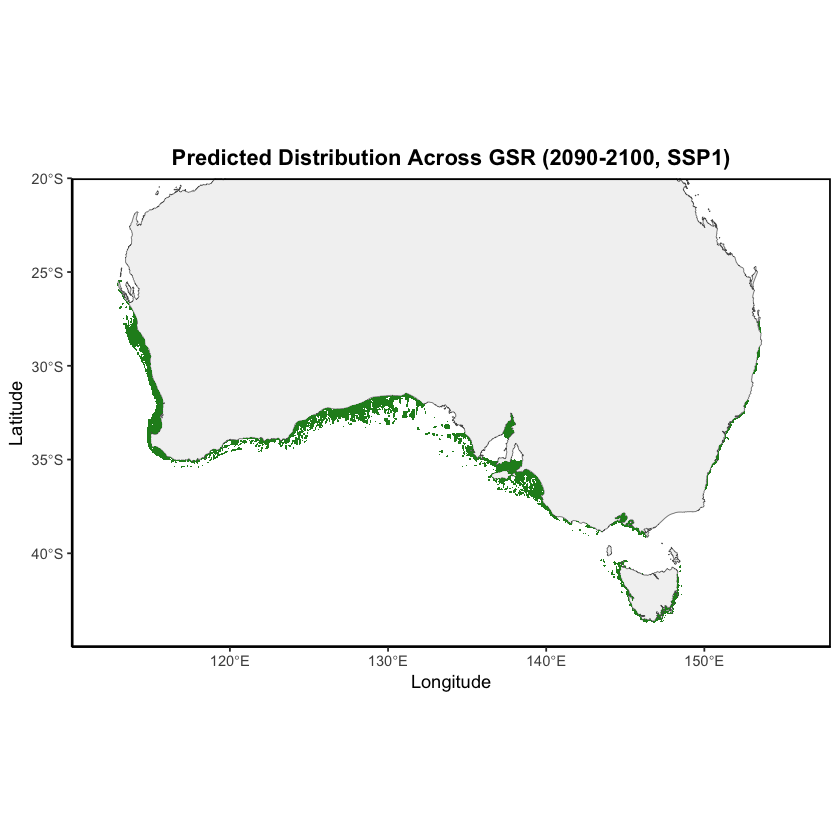

In [154]:
# Use the plot_thresholded_map function
mNThresh_2090ssp1 <- plot_thresholded_map(model_pred = mN_2090ssp1, 
                                           threshold = maxnet_threshold,
                                           year_range = "2090-2100, SSP1")

**Step 4:** Use the plot_maxnet_map function. Remember this map needs to be interpreted alongside the bathymetry map to determine where ecklonia radiata could actually be present.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


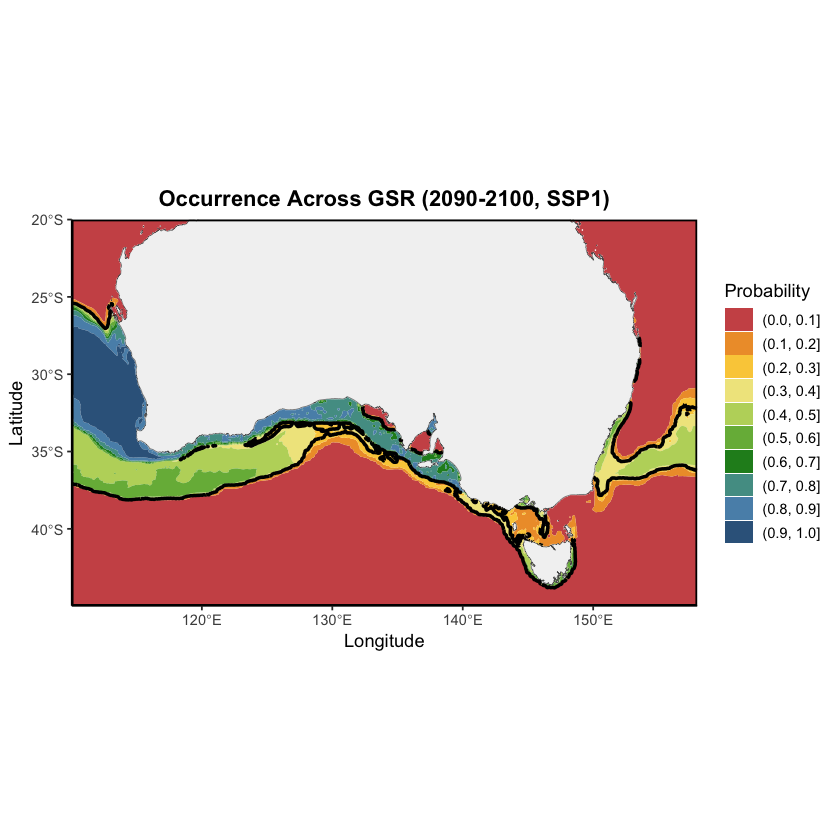

In [155]:
occur_mN_2090ssp1 <- plot_maxnet_map(env_data = env_2090ssp1,
                                     year_range = "2090-2100, SSP1")
occur_mN_2090ssp1

### Habitat Loss 2090 SSP1

Calculate habitat loss relative to 2010.

In [156]:
loss_maxnet_2090ssp1 <- habitat_loss(model_pred = mN_2090ssp1,
                                     threshold = maxnet_threshold,
                                     cover_2010 = cover_max_2010)
loss_maxnet_2090ssp1

[1] 5.796769

## **2040-2050 SSP2**

### Maps for 2040 SSP2

**Step 1:** Predict the probabiltiy of occurence across the GSR using the predict_maxnet_gsr function.

In [157]:
# use predict_maxnet_gsr function
mN_2040ssp2 <- predict_maxnet_gsr(env_data = env_2040ssp2)

**Step 2:** Map the probabiltiy of occurence across the GSR using the plot_masked_map function.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


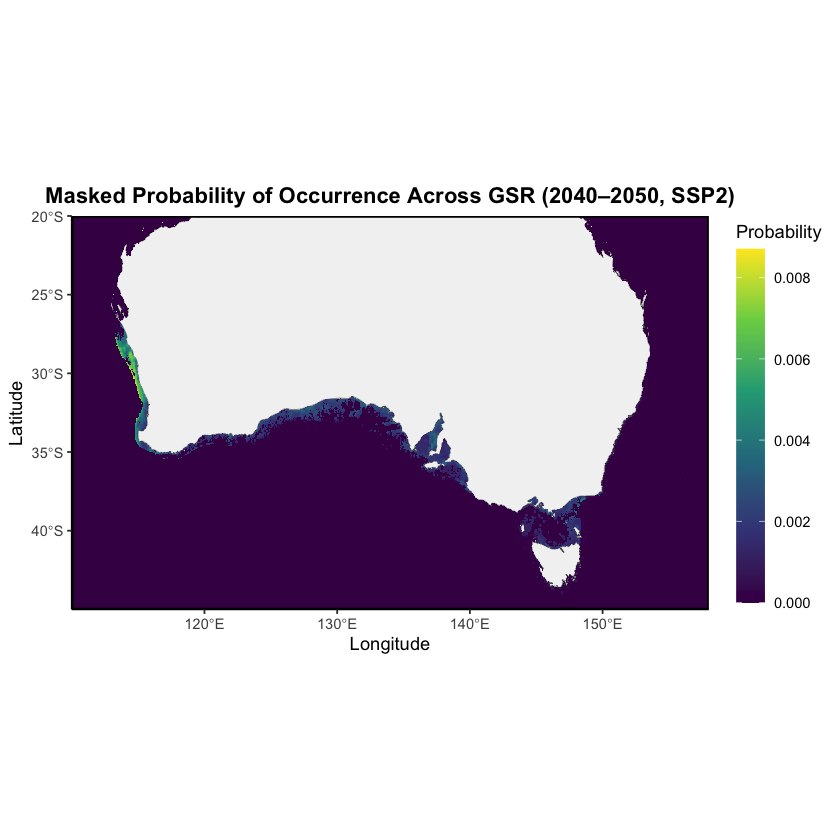

In [158]:
# Use plot_masked_map function
mNDist_2040ssp2 <- plot_masked_map(model_pred = mN_2040ssp2, 
                                   year_range = "2040–2050, SSP2")

**Step 3:** Plot the predicted distribution across the GSR using the plot_thresholded_map function

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


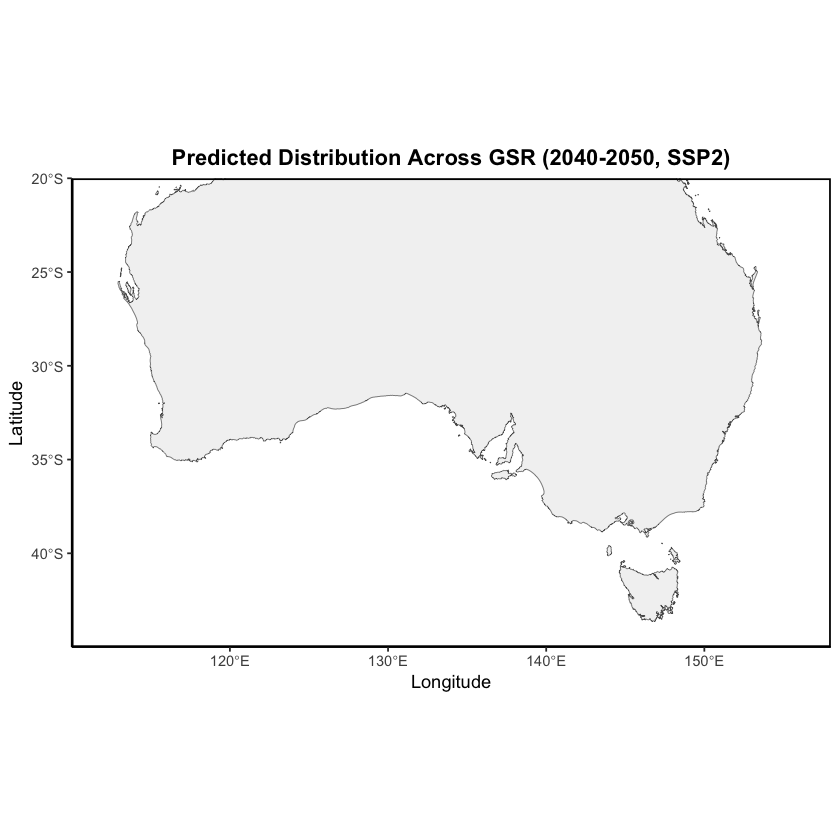

In [159]:
# Use the plot_thresholded_map function
mNThresh_2040ssp2 <- plot_thresholded_map(model_pred = mN_2040ssp2, 
                                           threshold = maxnet_threshold,
                                           year_range = "2040-2050, SSP2")

**Step 4:** Use the plot_maxnet_map function. Remember this map needs to be interpreted alongside the bathymetry map to determine where ecklonia radiata could actually be present.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Warning message:
“In `tidyterra::geom_spatraster_contour()`: Zero contours were generated”
Warning message in min(x):
“no non-missing arguments to min; returning Inf”
Warning message in max(x):
“no non-missing arguments to max; returning -Inf”
Warning message:
“Computation failed in `stat_terra_spat_raster_contour()`.
Caused by error in `$<-.data.frame`:
! replacement has 1 row, data has 0”


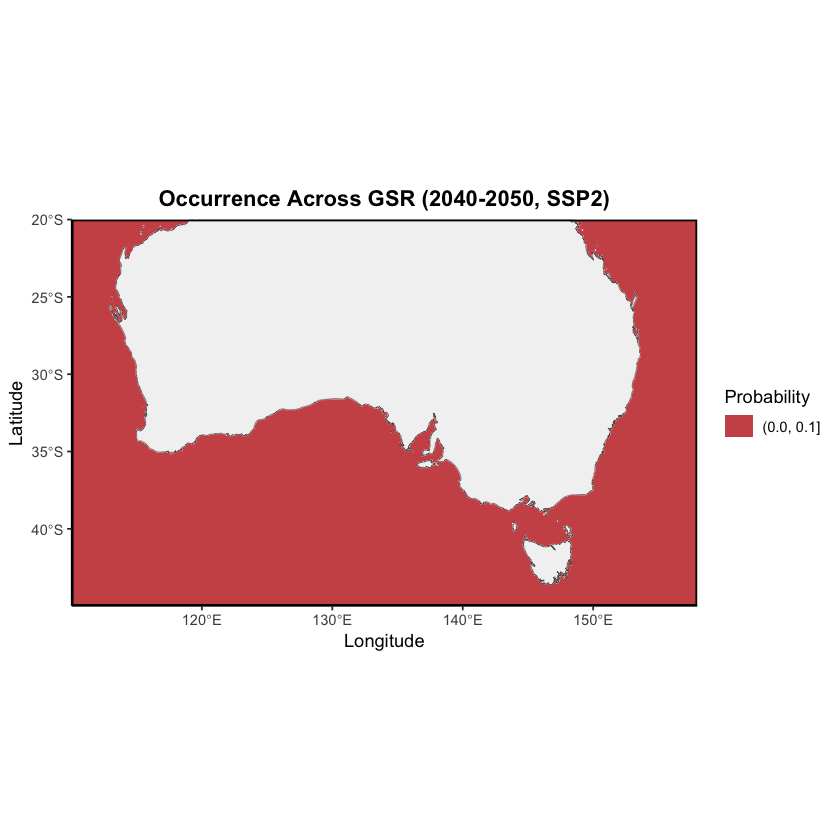

In [160]:
occur_mN_2040ssp2 <- plot_maxnet_map(env_data = env_2040ssp2,
                                     year_range = "2040-2050, SSP2")
occur_mN_2040ssp2

### Habitat Loss 2040 SSP2

Calculate habitat loss relative to 2010.

In [161]:
loss_maxnet_2040ssp2 <- habitat_loss(model_pred = mN_2040ssp2,
                                     threshold = maxnet_threshold,
                                     cover_2010 = cover_max_2010)
loss_maxnet_2040ssp2

[1] 100

## **2090-2100 SSP2**

### Maps for 2090 SSP2

**Step 1:** Predict the probabiltiy of occurence across the GSR using the predict_maxnet_gsr function.

In [162]:
# use predict_maxnet_gsr function
mN_2090ssp2 <- predict_maxnet_gsr(env_data = env_2090ssp2)

**Step 2:** Map the probabiltiy of occurence across the GSR using the plot_masked_map function.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


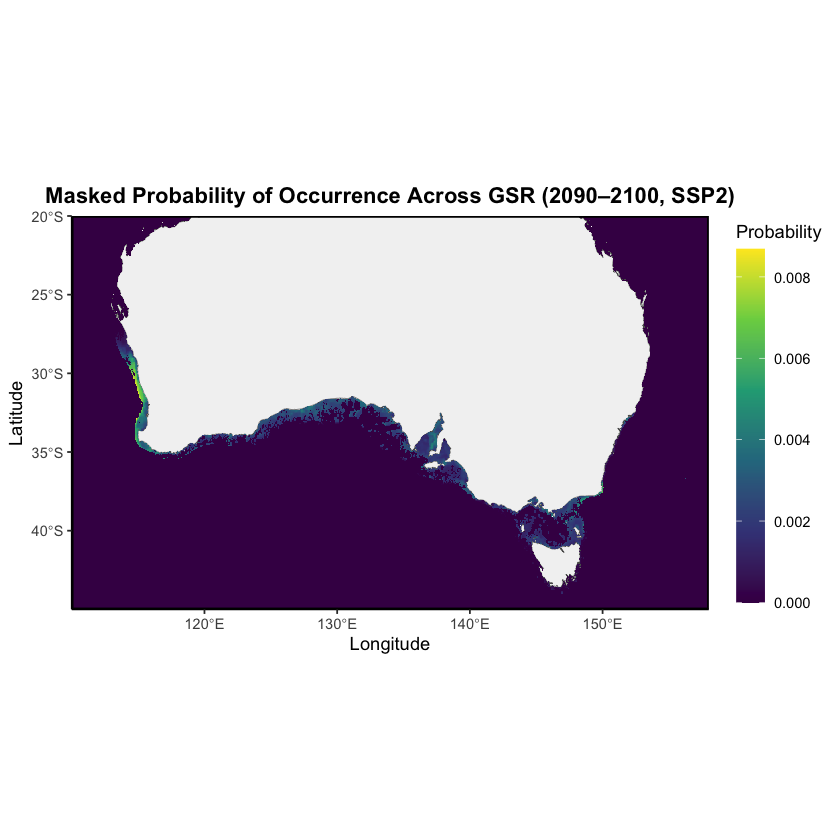

In [163]:
# Use plot_masked_map function
mNDist_2090ssp2 <- plot_masked_map(model_pred = mN_2090ssp2, 
                                   year_range = "2090–2100, SSP2")

**Step 3:** Plot the predicted distribution across the GSR using the plot_thresholded_map function

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


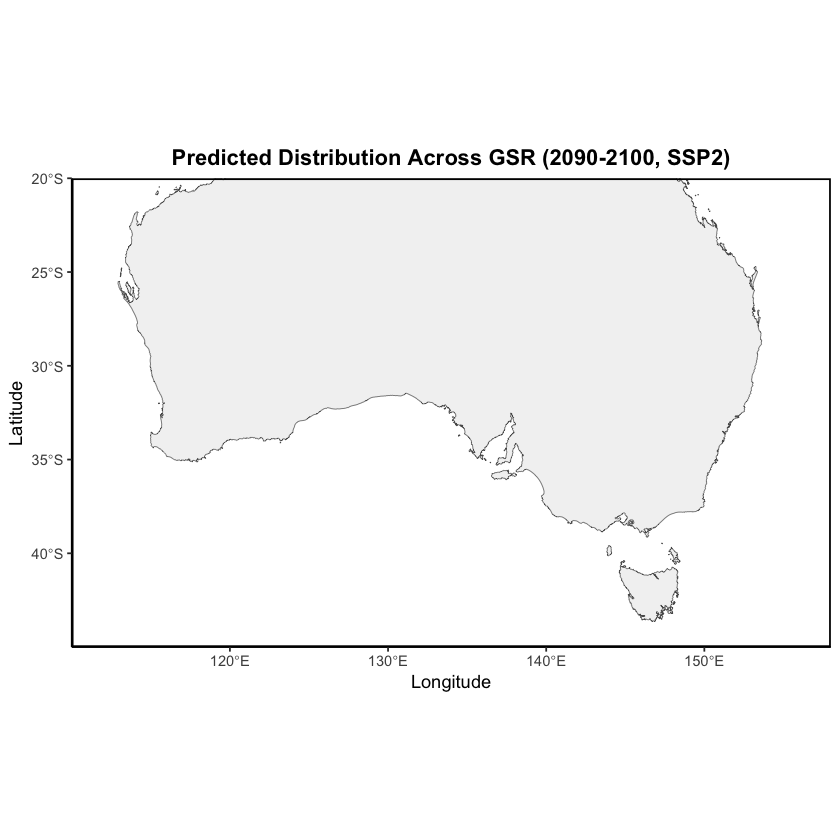

In [164]:
# Use the plot_thresholded_map function
mNThresh_2090ssp2 <- plot_thresholded_map(model_pred = mN_2090ssp2, 
                                           threshold = maxnet_threshold,
                                           year_range = "2090-2100, SSP2")

**Step 4:** Use the plot_maxnet_map function. Remember this map needs to be interpreted alongside the bathymetry map to determine where ecklonia radiata could actually be present.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Warning message:
“In `tidyterra::geom_spatraster_contour()`: Zero contours were generated”
Warning message in min(x):
“no non-missing arguments to min; returning Inf”
Warning message in max(x):
“no non-missing arguments to max; returning -Inf”
Warning message:
“Computation failed in `stat_terra_spat_raster_contour()`.
Caused by error in `$<-.data.frame`:
! replacement has 1 row, data has 0”


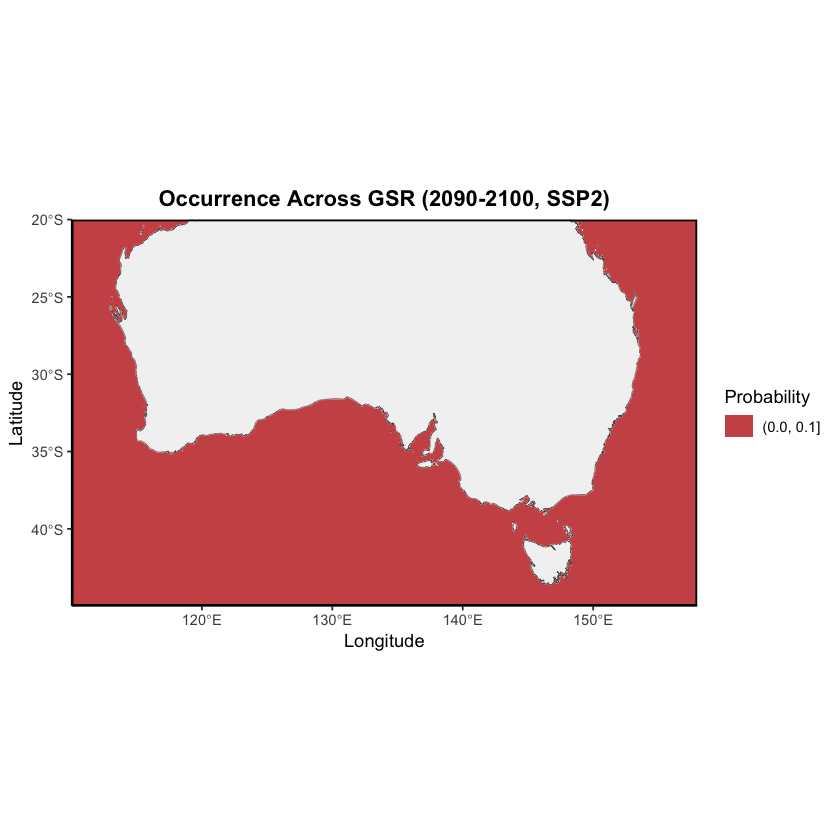

In [165]:
occur_mN_2090ssp2 <- plot_maxnet_map(env_data = env_2090ssp2,
                                     year_range = "2090-2100, SSP2")
occur_mN_2090ssp2

### Habitat Loss 2090 SSP2

Calculate habitat loss relative to 2010.

In [166]:
loss_maxnet_2090ssp2 <- habitat_loss(model_pred = mN_2090ssp2,
                                     threshold = maxnet_threshold,
                                     cover_2010 = cover_max_2010)
loss_maxnet_2090ssp2

[1] 100

## **2040-2050 SSP3**

### Maps for 2040 SSP3

**Step 1:** Predict the probabiltiy of occurence across the GSR using the predict_maxnet_gsr function.

In [167]:
# use predict_maxnet_gsr function
mN_2040ssp3 <- predict_maxnet_gsr(env_data = env_2040ssp3)

**Step 2:** Map the probabiltiy of occurence across the GSR using the plot_masked_map function.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


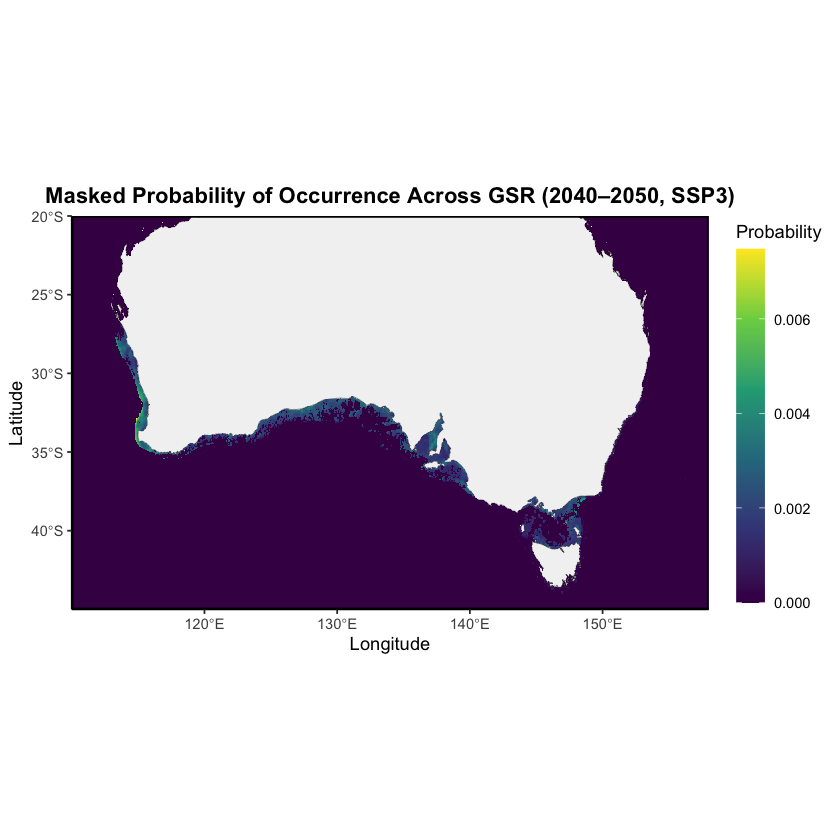

In [168]:
# Use plot_masked_map function
mNDist_2040ssp3 <- plot_masked_map(model_pred = mN_2040ssp3, 
                                   year_range = "2040–2050, SSP3")

**Step 3:** Plot the predicted distribution across the GSR using the plot_thresholded_map function

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


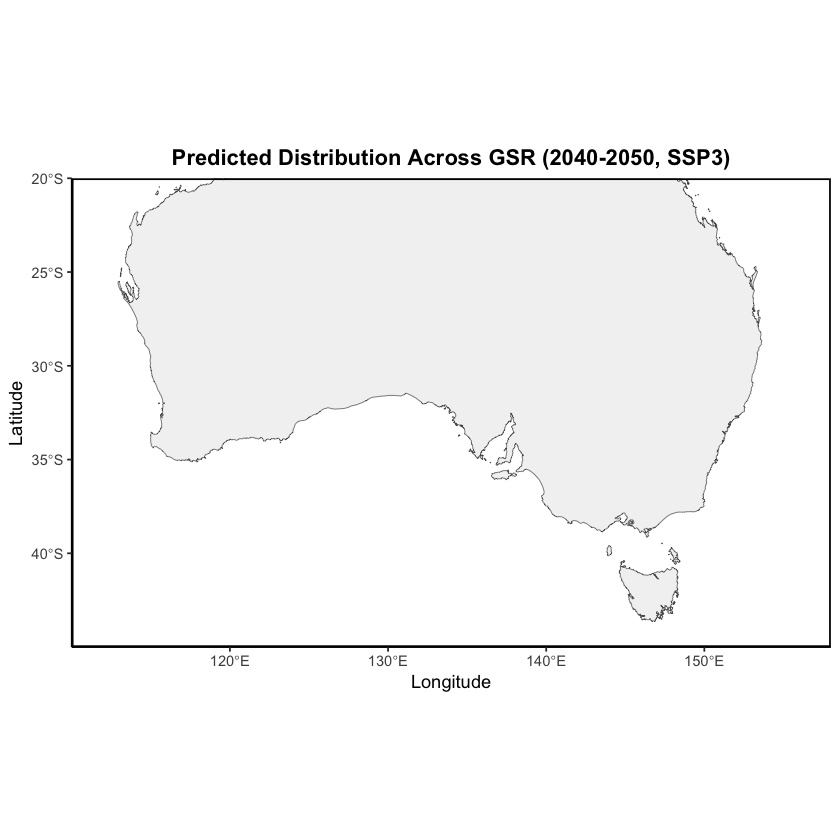

In [169]:
# Use the plot_thresholded_map function
mNThresh_2040ssp3 <- plot_thresholded_map(model_pred = mN_2040ssp3, 
                                           threshold = maxnet_threshold,
                                           year_range = "2040-2050, SSP3")

**Step 4:** Use the plot_maxnet_map function. Remember this map needs to be interpreted alongside the bathymetry map to determine where ecklonia radiata could actually be present.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Warning message:
“In `tidyterra::geom_spatraster_contour()`: Zero contours were generated”
Warning message in min(x):
“no non-missing arguments to min; returning Inf”
Warning message in max(x):
“no non-missing arguments to max; returning -Inf”
Warning message:
“Computation failed in `stat_terra_spat_raster_contour()`.
Caused by error in `$<-.data.frame`:
! replacement has 1 row, data has 0”


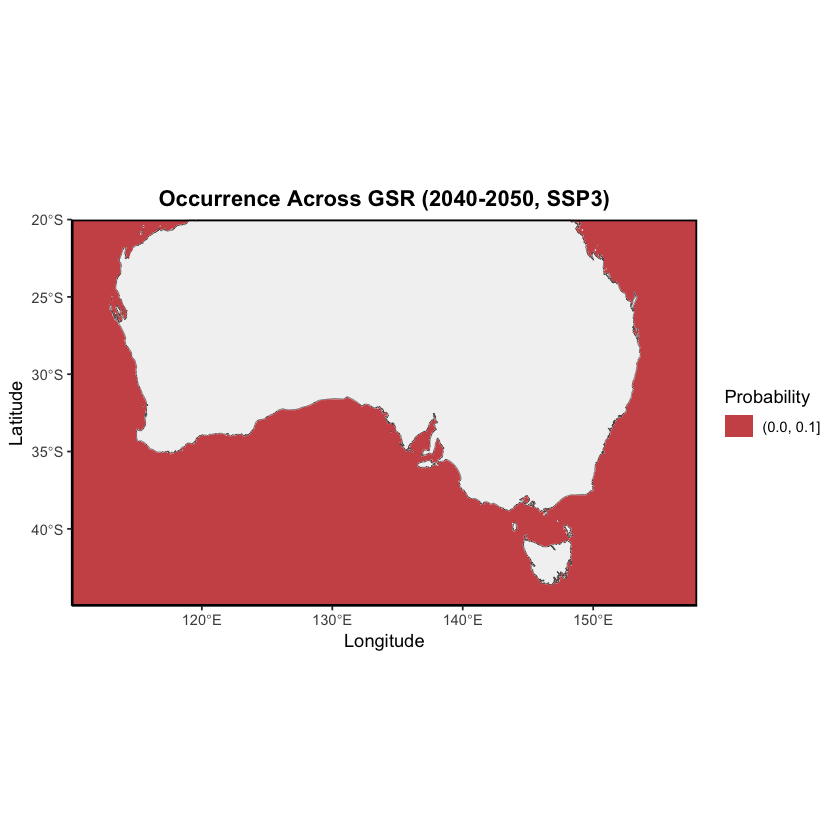

In [170]:
occur_mN_2040ssp3 <- plot_maxnet_map(env_data = env_2040ssp3,
                                     year_range = "2040-2050, SSP3")
occur_mN_2040ssp3

### Habitat Loss 2040 SSP3

Calculate habitat loss relative to 2010.

In [171]:
loss_maxnet_2040ssp3 <- habitat_loss(model_pred = mN_2040ssp3,
                                     threshold = maxnet_threshold,
                                     cover_2010 = cover_max_2010)
loss_maxnet_2040ssp3

[1] 100

## **2090-2100 SSP3**

### Maps for 2090 SSP3

**Step 1:** Predict the probabiltiy of occurence across the GSR using the predict_maxnet_gsr function.

In [172]:
# use predict_maxnet_gsr function
mN_2090ssp3 <- predict_maxnet_gsr(env_data = env_2090ssp3)

**Step 2:** Map the probabiltiy of occurence across the GSR using the plot_masked_map function.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


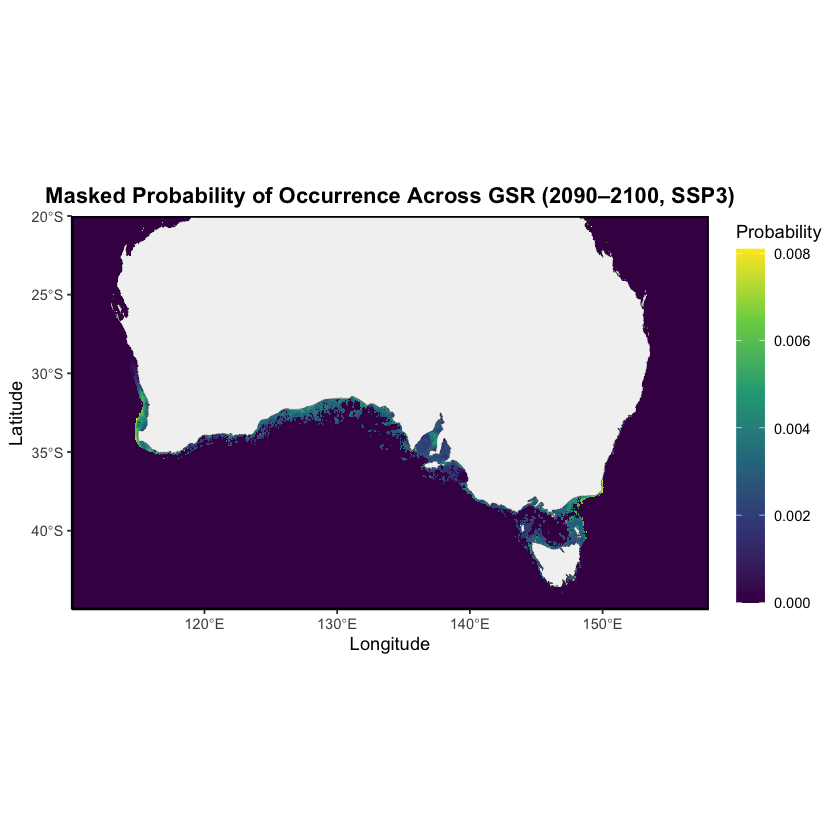

In [173]:
# Use plot_masked_map function
mNDist_2090ssp3 <- plot_masked_map(model_pred = mN_2090ssp3, 
                                   year_range = "2090–2100, SSP3")

**Step 3:** Plot the predicted distribution across the GSR using the plot_thresholded_map function

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


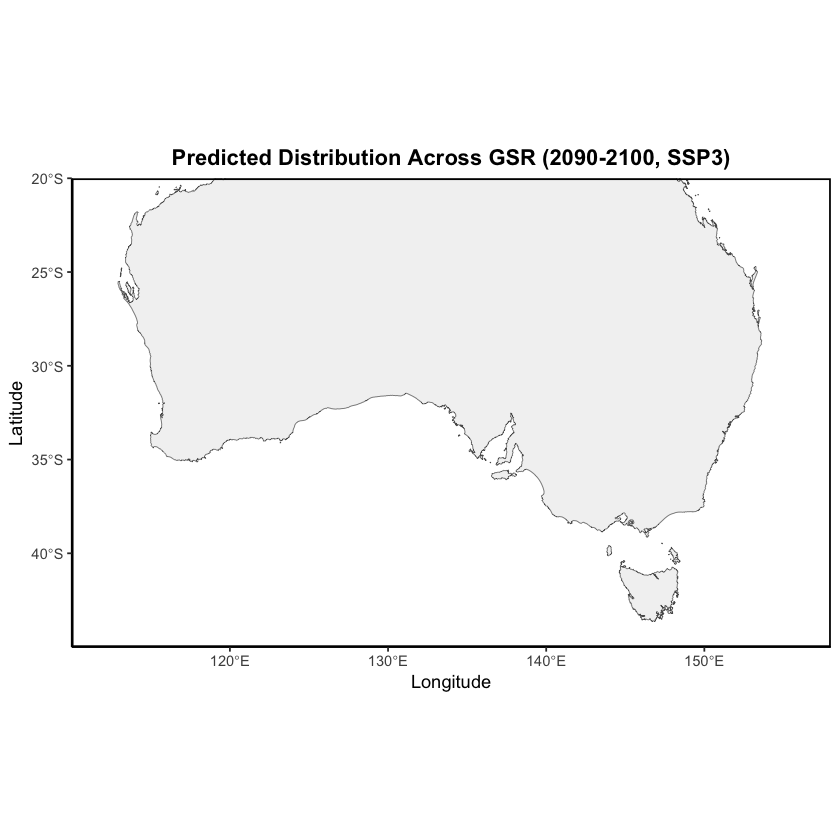

In [174]:
# Use the plot_thresholded_map function
mNThresh_2090ssp3 <- plot_thresholded_map(model_pred = mN_2090ssp3, 
                                           threshold = maxnet_threshold,
                                           year_range = "2090-2100, SSP3")

**Step 4:** Use the plot_maxnet_map function. Remember this map needs to be interpreted alongside the bathymetry map to determine where ecklonia radiata could actually be present.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Warning message:
“In `tidyterra::geom_spatraster_contour()`: Zero contours were generated”
Warning message in min(x):
“no non-missing arguments to min; returning Inf”
Warning message in max(x):
“no non-missing arguments to max; returning -Inf”
Warning message:
“Computation failed in `stat_terra_spat_raster_contour()`.
Caused by error in `$<-.data.frame`:
! replacement has 1 row, data has 0”


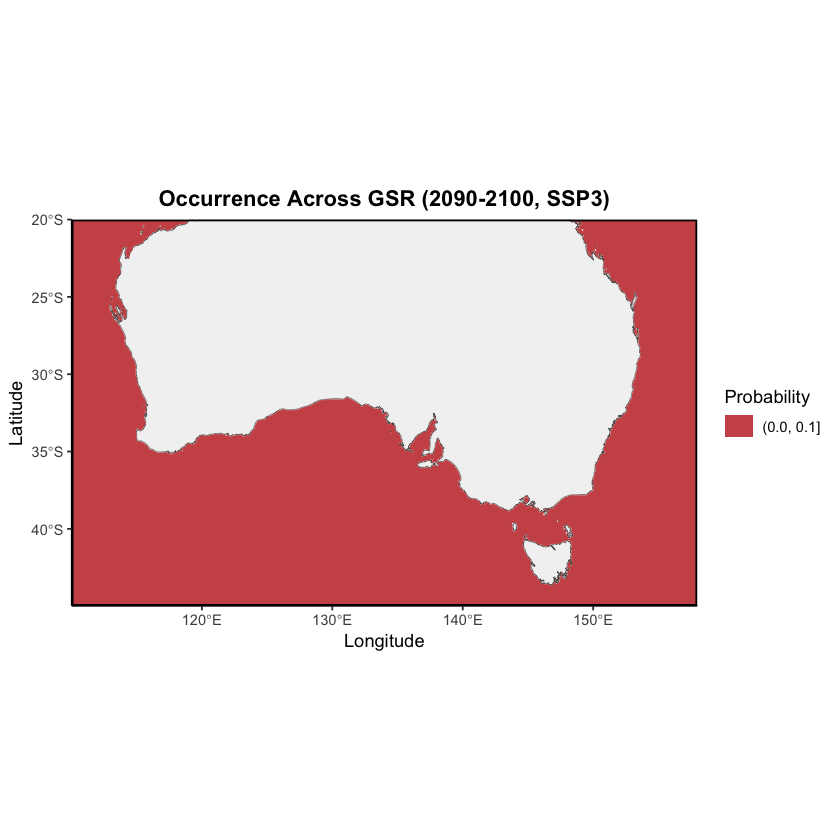

In [175]:
occur_mN_2090ssp3 <- plot_maxnet_map(env_data = env_2090ssp3,
                                     year_range = "2090-2100, SSP3")
occur_mN_2090ssp3

### Habitat Loss 2090 SSP3

Calculate habitat loss relative to 2010.

In [176]:
loss_maxnet_2090ssp3 <- habitat_loss(model_pred = mN_2090ssp3,
                                     threshold = maxnet_threshold,
                                     cover_2010 = cover_max_2010)
loss_maxnet_2090ssp3

[1] 100

---
# **Random Forest**

## **Build the Random Forest**

**Step 1:** visualise training dataset and confirm variables that will be used

In [177]:
head(training_selected)

,pa,thetao_ltmax,sws_ltmin,no3_mean,so_mean,ph_mean
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2,1,19.98576,0.06519728,0.07803244,35.76738,8.082132
4,1,20.14606,0.04271005,0.07520513,35.77265,8.081440
6,1,20.14606,0.04271005,0.07520513,35.77265,8.081440
7,1,19.81542,0.19855091,0.07759946,35.79221,8.082767
8,1,19.81542,0.19855091,0.07759946,35.79221,8.082767
9,1,19.74090,0.20553088,0.07796516,35.78881,8.082800


In [178]:
predictors

[1] "no3_mean"     "ph_mean"      "so_mean"      "sws_ltmin"    "thetao_ltmax"

**Step 2:** Create random forest models with 1,000 trees.

In [179]:
# Fit the model with 1000 trees
set.seed(2000)
rf_model_1000 <- randomForest(as.factor(pa) ~ ., 
                             data = training_selected, 
                             ntree = 1000,
                             importance = TRUE)

**Step 3:** View the structure of the error matrix

In [180]:
head(rf_model_1000$err.rate)

OOB,0,1
0.12415350,0.10000000,0.1699346
0.10136986,0.09224319,0.1185771
0.10356347,0.08983051,0.1298701
0.10458167,0.09214502,0.1286550
0.09366391,0.08725762,0.1062670
0.09523810,0.08556150,0.1139896


**Step 4:** Plot OOB error rate against number of trees

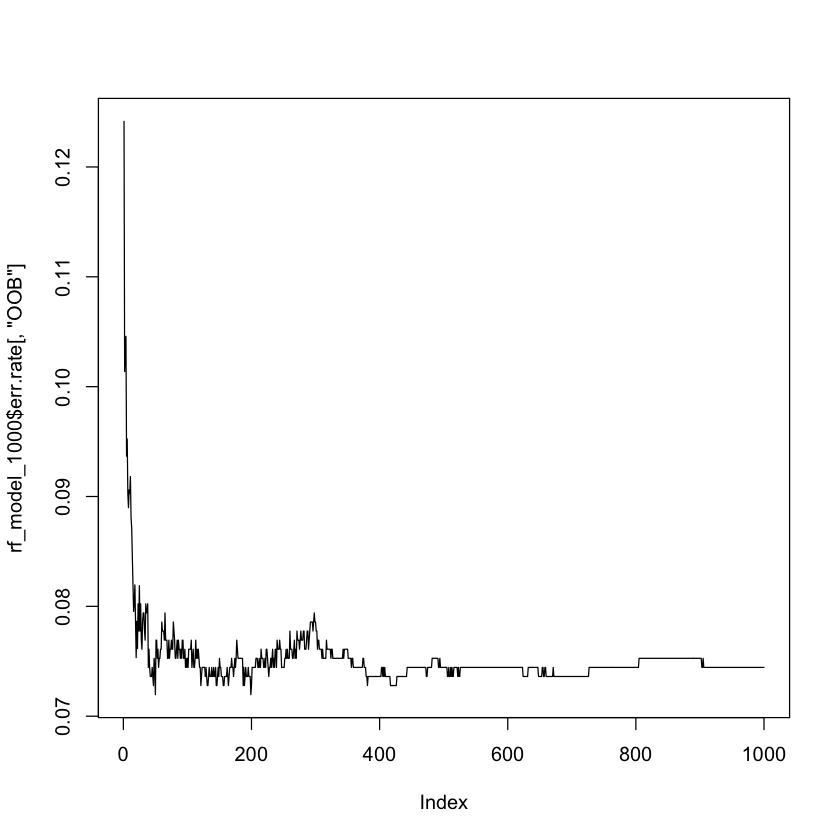

In [181]:
plot(rf_model_1000$err.rate[,"OOB"], # from the erra.rate matrix in rf_model_1000, extract all rows of the OOB column
    type = "l") # plot a line graph instead of points

**Step 5:** From the above graph, we can see that the OOB error rate plateaus at around 200 trees. Extract the OOB error rate for models in this range of trees. 

In [182]:
rf_model_1000$err.rate[200, "OOB"]

OOB 
0.07278743

**Step 6:** Fit the model with 200 trees

In [183]:
# Fit the model with 200 trees
set.seed(2000)
rf_model <- randomForest(as.factor(pa) ~ ., 
                        data = training_selected, 
                        ntree = 200,
                        importance = TRUE)

In [184]:
# Print the model summary
rf_model


Call:
 randomForest(formula = as.factor(pa) ~ ., data = training_selected,      ntree = 200, importance = TRUE) 
               Type of random forest: classification
                     Number of trees: 200
No. of variables tried at each split: 2

        OOB estimate of  error rate: 7.28%
Confusion matrix:
    0   1 class.error
0 744  56  0.07000000
1  32 377  0.07823961

## **Examine Contribution of Environmental Variables**

In [185]:
# Determine variable importance, ensure use randomForrest package
randomForest::importance(rf_model)

,0,1,MeanDecreaseAccuracy,MeanDecreaseGini
thetao_ltmax,13.713867,25.44937,26.21601,109.75798
sws_ltmin,17.071758,21.69024,27.15076,54.65790
no3_mean,12.082759,38.89271,38.53474,177.79467
so_mean,9.757971,29.40073,32.95694,97.57964
ph_mean,4.794581,27.72052,28.59799,96.97302


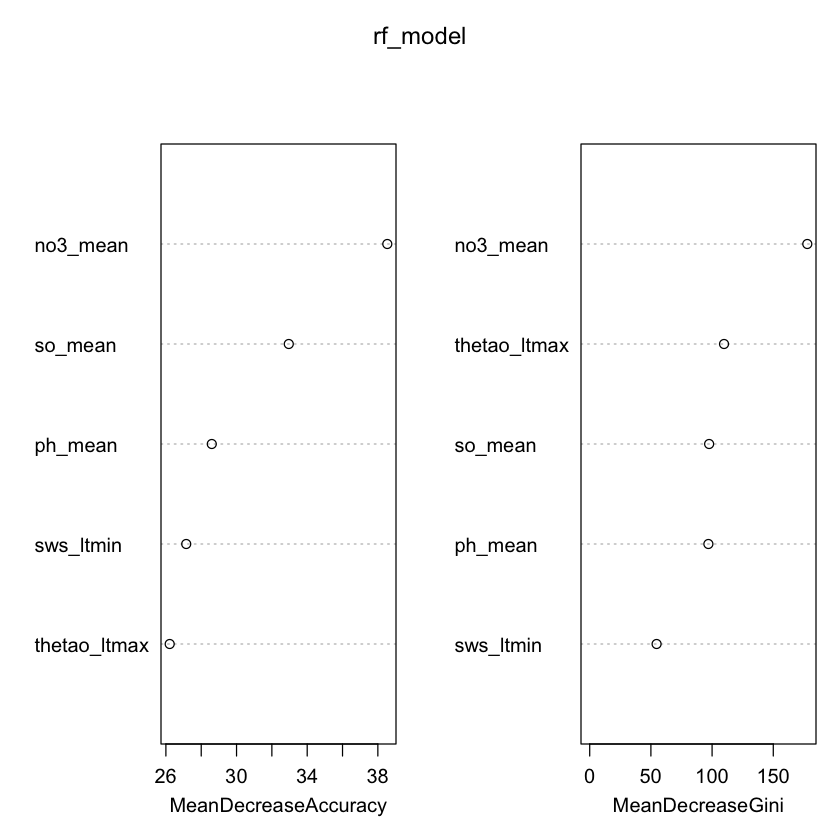

In [186]:
varImpPlot(rf_model)

### Response Curves

In [187]:
# Check predictors generated in glm
predictors

[1] "no3_mean"     "ph_mean"      "so_mean"      "sws_ltmin"    "thetao_ltmax"

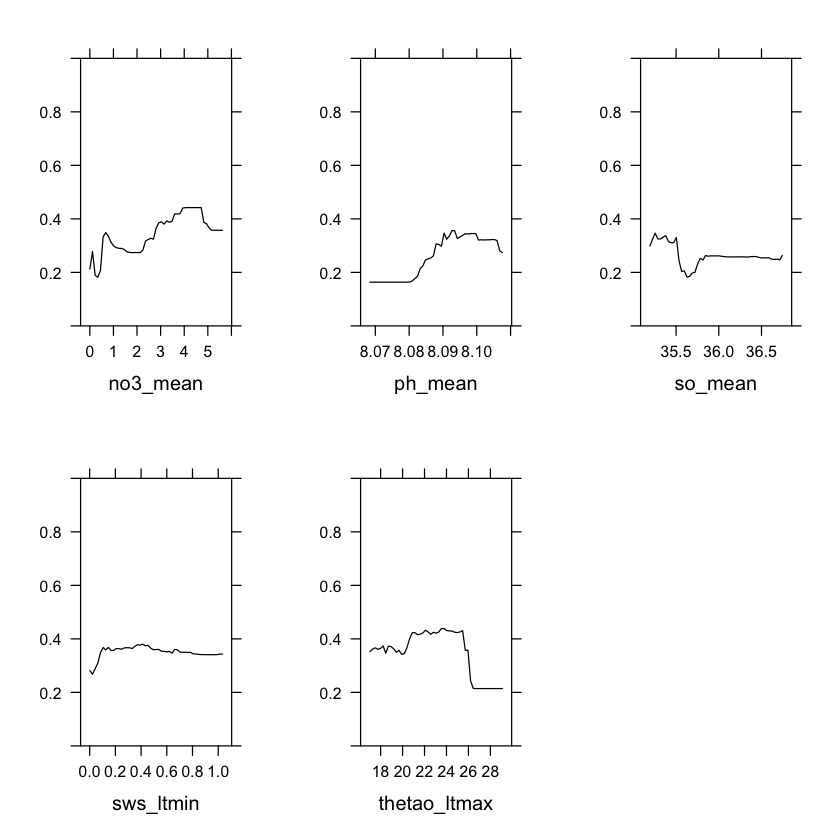

In [188]:
# Use pdp package to generate response curves

responsecurves_rf <- lapply(predictors, function(predictor) {
    response_curves <- partial(rf_model, pred.var = predictor, train = training_selected, which.class = "1", prob = TRUE)
    plotPartial(response_curves, xlab = predictor, ylab = "", ylim = c(0,1))
})

grid.arrange(grobs = responsecurves_rf, ncol = 3)

In [189]:
# Check range over which rf model can accurately make predictions
for (predictor in predictors) {
    cat(predictor, ": ",
        range(training_selected[[predictor]]),
        "\n")
    }

no3_mean :  0.001815626 5.61667 
ph_mean :  8.068388 8.107574 
so_mean :  35.19318 36.7443 
sws_ltmin :  0.001401956 1.032534 
thetao_ltmax :  17.019 29.09433 


## **Calculate AUC from ROC**

In [190]:
# Apply the Random Forest model to the testing dataset
testing_rf <- testing_selected
testing_rf$pred_rf <- predict(rf_model, newdata = testing_selected, type = "prob")[, 2]

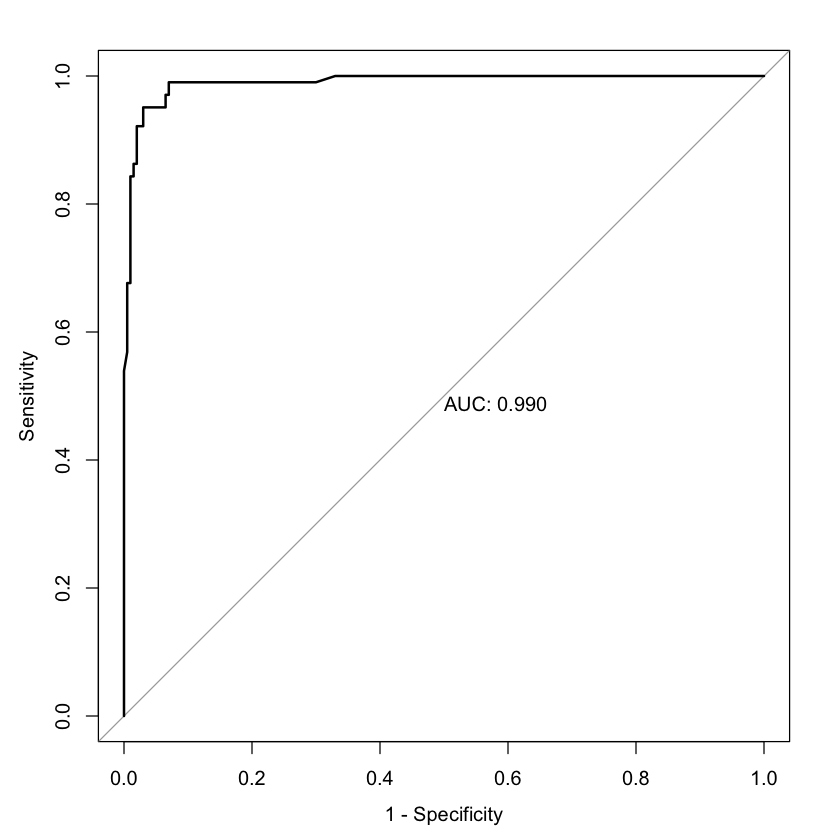

In [191]:
# Create ROC curve and plot AUC
roc_rf <- roc(response = testing_rf$pa,
              predictor = testing_rf$pred_rf,
              quiet = TRUE)

plot(roc_rf, print.auc = TRUE, legacy.axes = TRUE)

In [192]:
# Calculate the AUC
auc_rf <- roc_rf$auc
auc_rf

Area under the curve: 0.9896

This is the best AUC of all three models. 

## **Predict Present-Day Distribution in Sample Area**

### Masked Probability (Sample Area)

In [193]:
# Predict habitat suitability across the sample area using Random Forest
rf_samplearea <- predict(
    envdata_cropped,
    rf_model,
    type = "prob",
    index = 2   # equivalent to [, 2] - gives probability of presence
)

# Mask depths greater than 50m
rf_samplearea_50 <- mask(rf_samplearea, mask50_sample)

# Map predicted habitat suitability across masked area
rf_samplearea_masked <- ifel(
    is.na(rf_samplearea_50) & !is.na(crop(bath_min, sample_extent)), 
    0, # Make probability 0 when in deep water and not on land
    rf_samplearea_50)

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


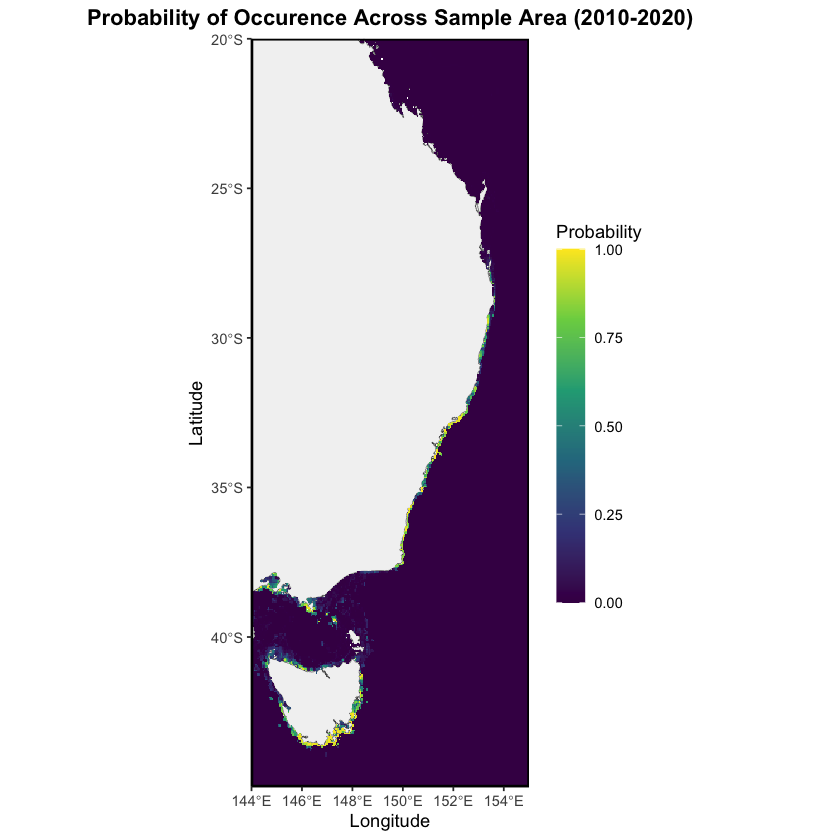

In [194]:
# Habitat suitability map
rfDist_samplearea_2010 <- sample_map +
    geom_spatraster(data = rf_samplearea_masked) +
    scale_fill_viridis_c(name = "Probability", na.value = "transparent") +
    coord_sf(expand = FALSE) +
    theme(legend.key.height = unit(1.5, "cm")) +
    labs(title = "Probability of Occurence Across Sample Area (2010-2020)")

rfDist_samplearea_2010

### Presence Threshold (Sample Area)

In [195]:
rf_eval <- pa_evaluate(
  p = testing[testing_rf$pa == 1, ],
  a = testing[testing_rf$pa == 0, ],
  model = rf_model,
  type = "prob",
  index = 2)

rf_eval

@stats
   np  na prevalence auc cor pcor   ODP
1 204 400      0.338 0.5   0    1 0.662

@thresholds
  max_kappa max_spec_sens no_omission equal_prevalence equal_sens_spec
1      0.01          0.01           0            0.335           0.515

@tr_stats
    treshold kappa  CCR  TPR  TNR  FPR  FNR  PPP  NPP  MCR   OR
1          0     0 0.34    1    0    1    0 0.34  NaN 0.66  NaN
2          0  0.07 0.47  0.8  0.3  0.7  0.2 0.37 0.74 0.53 1.66
3       0.01  0.09 0.48 0.77 0.34 0.66 0.23 0.37 0.74 0.52 1.73
4        ...   ...  ...  ...  ...  ...  ...  ...  ...  ...  ...
110        1  -0.1 0.53  0.2  0.7  0.3  0.8 0.26 0.63 0.47  0.6
111        1  -0.1 0.53  0.2  0.7  0.3  0.8 0.26 0.63 0.47  0.6
112        1     0 0.66    0    1    0    1  NaN 0.66 0.34  NaN

In [196]:
# Determine the minimum threshold for presence usng max_spec_sens (calculates threshold with highest sensitivity and specificity)
rf_threshold <- rf_eval@thresholds$max_spec_sens
rf_threshold

[1] 0.0099

In [197]:
# Identify which cells are above/below threshold
rf_thresh_data <- as.factor(rf_samplearea_masked > rf_threshold)
rf_thresh_data

class       : SpatRaster 
size        : 500, 220, 1  (nrow, ncol, nlyr)
resolution  : 0.04999999, 0.05  (x, y)
extent      : 144, 155, -45, -20  (xmin, xmax, ymin, ymax)
coord. ref. : lon/lat WGS 84 (CRS84) (OGC:CRS84) 
source(s)   : memory
categories  : X1 
name        : X1 
min value   :  0 
max value   :  1 

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


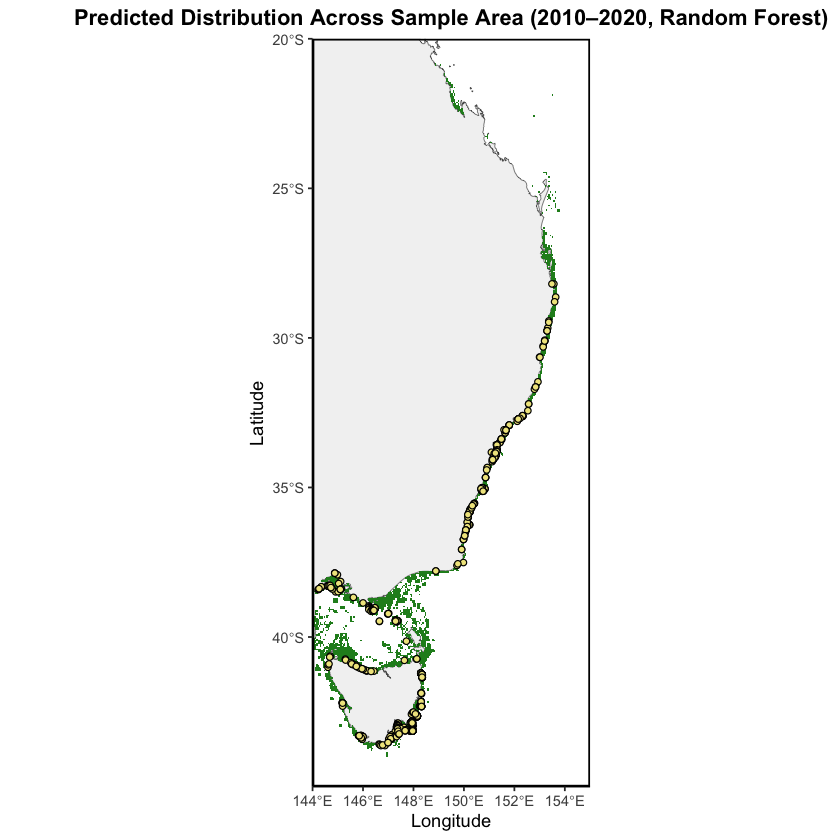

In [198]:
rfThresh_samplearea_2010 <- sample_map +
    geom_spatraster(data = rf_thresh_data) +
    scale_fill_manual(
        values = c("0" = "transparent", "1" = "forestgreen"),
        na.value = "transparent",
        guide = "none") +
    coord_sf(expand = FALSE) +
    theme(legend.key.height = unit(1.5, "cm")) +
    labs(title = "Predicted Distribution Across Sample Area (2010–2020, Random Forest)") +
    geom_point(data = obs_unique,
        aes(x = longitude, y = latitude),
        shape = 21,
        size = 1.5,
        colour = "black",
        fill = "khaki")

rfThresh_samplearea_2010

### Probability of Occurence (Sample Area)

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


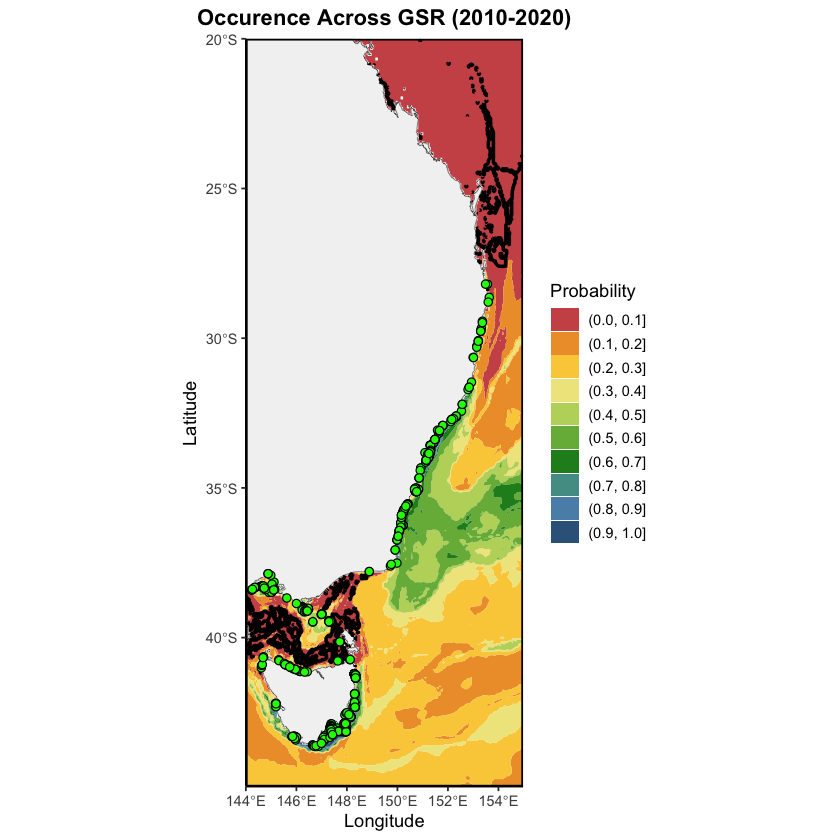

In [199]:
# Habitat suitability map - unmasked
rfDist_2010sample_unmasked <- sample_map +
    geom_spatraster_contour_filled(data = rf_samplearea,
                                   breaks = seq(0, 1, 0.1)) +
    scale_fill_manual(name = "Probability",
                      values = colorRampPalette(c("indianred3", "goldenrod1", "khaki", "darkolivegreen3", "forestgreen", "skyblue3", "steelblue4"))(10),
                      na.value = "transparent") +
    coord_sf(expand = FALSE) +
    theme(legend.key.height = unit(0.5, "cm")) +
    labs(title = "Occurence Across GSR (2010-2020)")

# Add threshold contour and presence points
rfDist_2010sample_thresh <-  rfDist_2010sample_unmasked +
    geom_spatraster_contour(data = rf_samplearea, # Threshold Contour
                           breaks = rf_threshold,
                           colour = "black",
                           linewidth = 1) +
    geom_point(data = obs_unique, # Presence points
               aes(x = longitude, y = latitude),
               shape = 21,
               size = 2,
               colour = "black",
               fill = "green") +
    coord_sf(expand = FALSE)


rfDist_2010sample_thresh

## **Predict Across GSR**

### Function: Predict Probability of Occurence from RF

Create a function to predict probability of occurence across GSR using rf_model:

In [200]:
# Function to predict and mask Random Forest habitat suitability across the GSR
predict_rf <- function(env_data) {
    
    # Step 1: Predict habitat suitability (probability of presence)
    rf_pred <- predict(
        env_data,
        rf_model,
        type = "prob", # output probabilities
        index = 2 # column 2 gives probability of presence
    )
    
    # Step 2: Mask depths greater than 50 m
    rf_masked <- mask(rf_pred, mask50_gsr)
    
    # Step 3: Set probability to 0 in deep water and on land
    rf_function <- ifel(
        is.na(rf_masked) & !is.na(crop(bath_min, gsr_extent)),
        0,
        rf_masked)
    
    # Step 4: Return processed prediction
    return(rf_function)
}

### Function: Probability of Occurence Maps

In [201]:
# Function to plot Random Forest habitat suitability across the GSR
plot_rf_map <- function(env_data, year_range) {
    
    # Step 1: Predict habitat suitability
    rf_pred <- predict(
        env_data,
        rf_model,
        type = "prob", # output probabilities
        index = 2 # column 2 = probability of presence
  )
    
    # Step 2: Build filled contour map (unmasked)
    map_unmasked <- gsr_map +
        geom_spatraster_contour_filled(
            data = rf_pred,
            breaks = seq(0, 1, 0.1)) +
        scale_fill_manual(
            name = "Probability",
            values = colorRampPalette(c("indianred3", "goldenrod1", "khaki", "darkolivegreen3", "forestgreen", "skyblue3", "steelblue4"))(10),
            na.value = "transparent") +
        coord_sf(expand = FALSE) +
        theme(legend.key.height = unit(0.5, "cm")) +
    labs(title = paste("Occurrence Across GSR (", year_range, ")", sep = ""))
    
    # Step 3: Add threshold contour line
    map_thresh <- map_unmasked +
        geom_spatraster_contour(
            data = rf_pred,
            breaks = rf_threshold,
            colour = "black",
            linewidth = 1) +
        coord_sf(expand = FALSE)

  # Step 4: Return map
  return(map_thresh)
}

## **2010 Across GSR**

### Maps for 2010

We can now map present-day distribution across the GSR

**Step 1:** Use the predict_rf function to predict present-day distribution across the GSR

In [202]:
# Predict for present-day distribution
rf_2010 <- predict_rf(env_data = envdata_2010_gsr)

**Step 2:** Use the plot_masked_map function (created in the GLM section of the notebook) to map probability of occurence across masked area

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


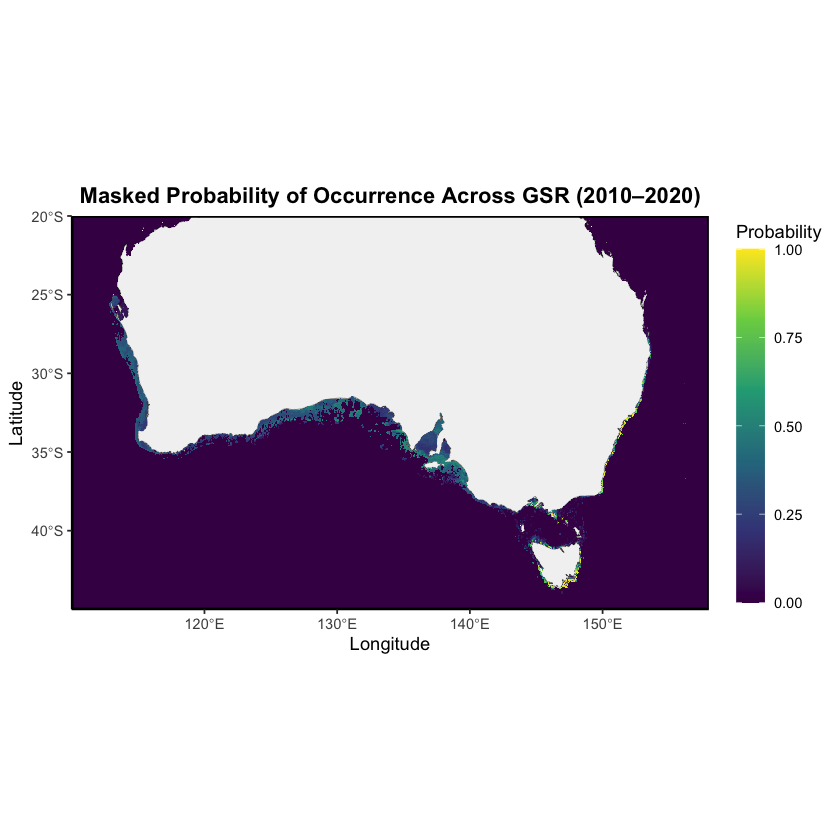

In [203]:
# Use plot_masked_map function for 2010-2020
rfDist_2010 <- plot_masked_map(model_pred = rf_2010, 
                                year_range = "2010–2020")

**Step 3:** Use the plot_thresholded_map function (created in the GLM section of the notebook) to map predicted distribution across masked area

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


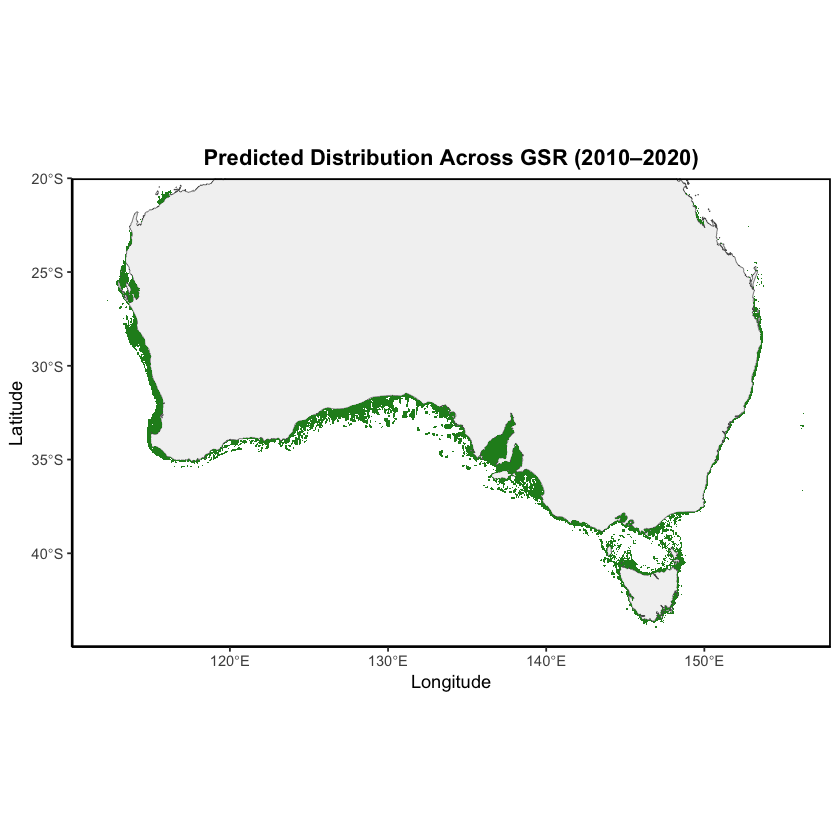

In [204]:
# Use the plot_thresholded_map function for 2010-2020
rfThresh_2010 <- plot_thresholded_map(model_pred = rf_2010, 
                                      threshold = rf_threshold,
                                      year_range = "2010–2020")

**Step 4:** Use the plot_rf_map function to map probability of occurence across GSR. Remember this map needs to be interpreted alongside the bathymetry map to determine where ecklonia radiata could actually be present. 

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


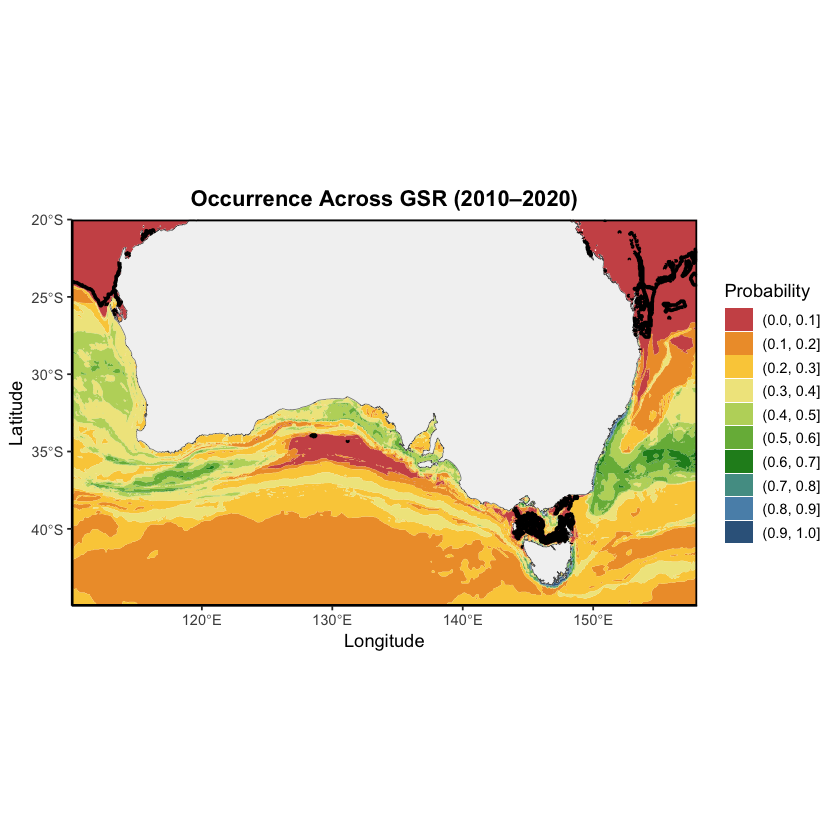

In [205]:
# use plot_maxnet_map function for 2010
occur_rf_2010 <- plot_rf_map(env_data = envdata_2010_gsr,
                             year_range = "2010–2020")
occur_rf_2010

### Habitat in 2010

Calculate suitable habitat in 2010. These values will be used to calculate loss of habitat under different SSP scenarioes in future years.

In [206]:
# Find cells where probability of occurence is above presence threshold
pa_rf_2010 <- as.factor(rf_2010 > rf_threshold)

# Calculate the number of cells where ecklonia radiata is predicted to occur
cover_rf_2010 <- global(pa_rf_2010, "sum", na.rm = TRUE)[[1]]

## **2040-2050 SSP1**

### Maps for 2040 SSP1

**Step 1:** Predict the probabiltiy of occurence across the GSR using the predict_rf function.

In [207]:
# use predict_rf function
rf_2040ssp1 <- predict_rf(env_data = env_2040ssp1)

**Step 2:** Map the probabiltiy of occurence across the GSR using the plot_masked_map function.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


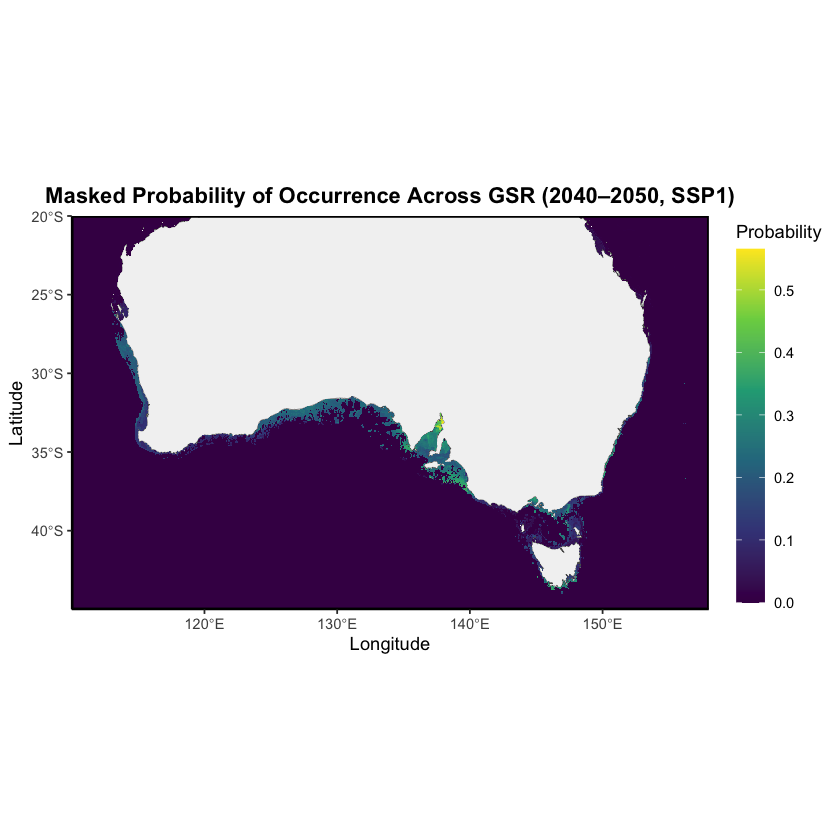

In [208]:
# Use plot_masked_map function
rfDist_2040ssp1 <- plot_masked_map(model_pred = rf_2040ssp1, 
                                   year_range = "2040–2050, SSP1")

**Step 3:** Plot the predicted distribution across the GSR using the plot_thresholded_map function

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


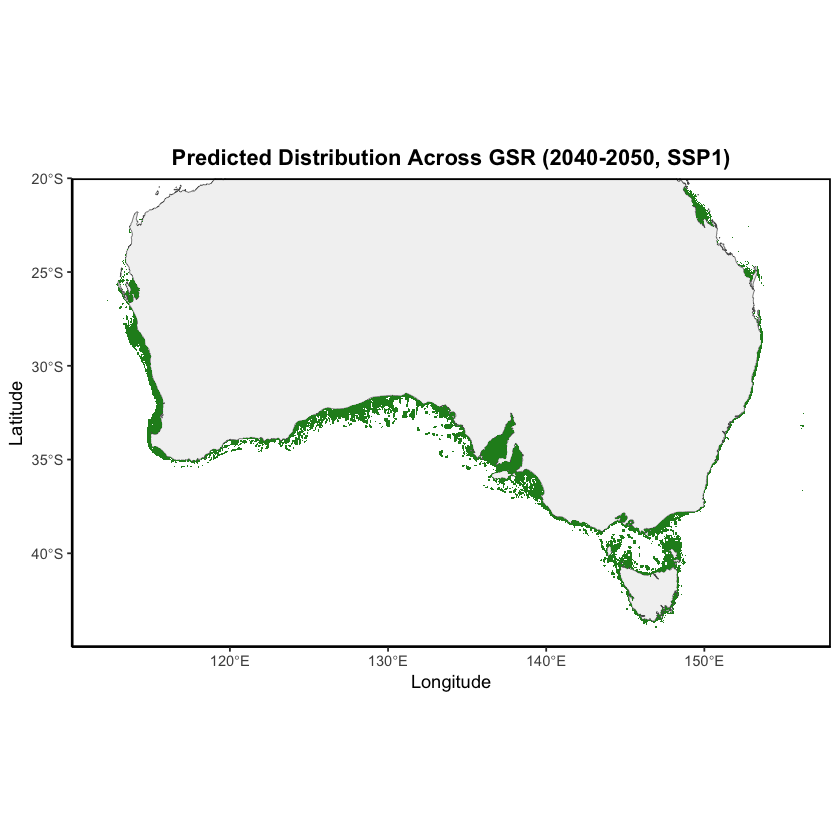

In [209]:
# Use the plot_thresholded_map function
rfThresh_2040ssp1 <- plot_thresholded_map(model_pred = rf_2040ssp1, 
                                           threshold = rf_threshold,
                                           year_range = "2040-2050, SSP1")

**Step 4:** Use the plot_rf_map function. Remember this map needs to be interpreted alongside the bathymetry map to determine where ecklonia radiata could actually be present.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


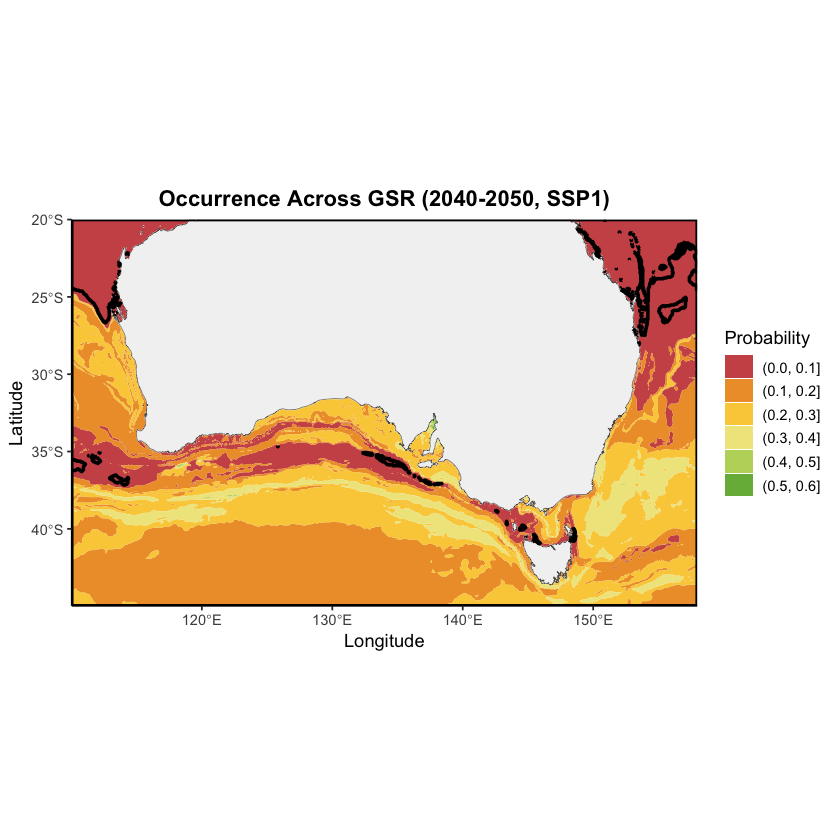

In [210]:
occur_rf_2040ssp1 <- plot_rf_map(env_data = env_2040ssp1,
                                 year_range = "2040-2050, SSP1")
occur_rf_2040ssp1

### Habitat Loss 2040 SSP1

Calculate habitat loss relative to 2010.

In [211]:
loss_rf_2040ssp1 <- habitat_loss(model_pred = rf_2040ssp1,
                                 threshold = rf_threshold,
                                 cover_2010 = cover_rf_2010)
loss_rf_2040ssp1

[1] -4.875717

## **2090-2100 SSP1**

### Maps for 2090 SSP1

**Step 1:** Predict the probabiltiy of occurence across the GSR using the predict_rf function.

In [212]:
# use predict_rf function
rf_2090ssp1 <- predict_rf(env_data = env_2090ssp1)

**Step 2:** Map the probabiltiy of occurence across the GSR using the plot_masked_map function.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


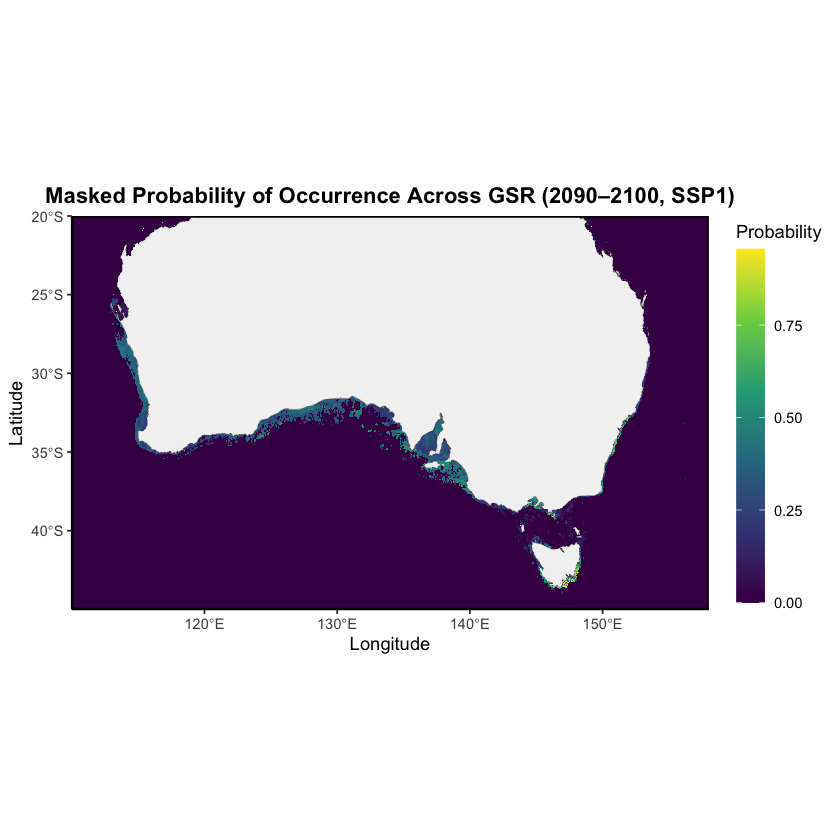

In [213]:
# Use plot_masked_map function
rfDist_2090ssp1 <- plot_masked_map(model_pred = rf_2090ssp1, 
                                   year_range = "2090–2100, SSP1")

**Step 3:** Plot the predicted distribution across the GSR using the plot_thresholded_map function

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


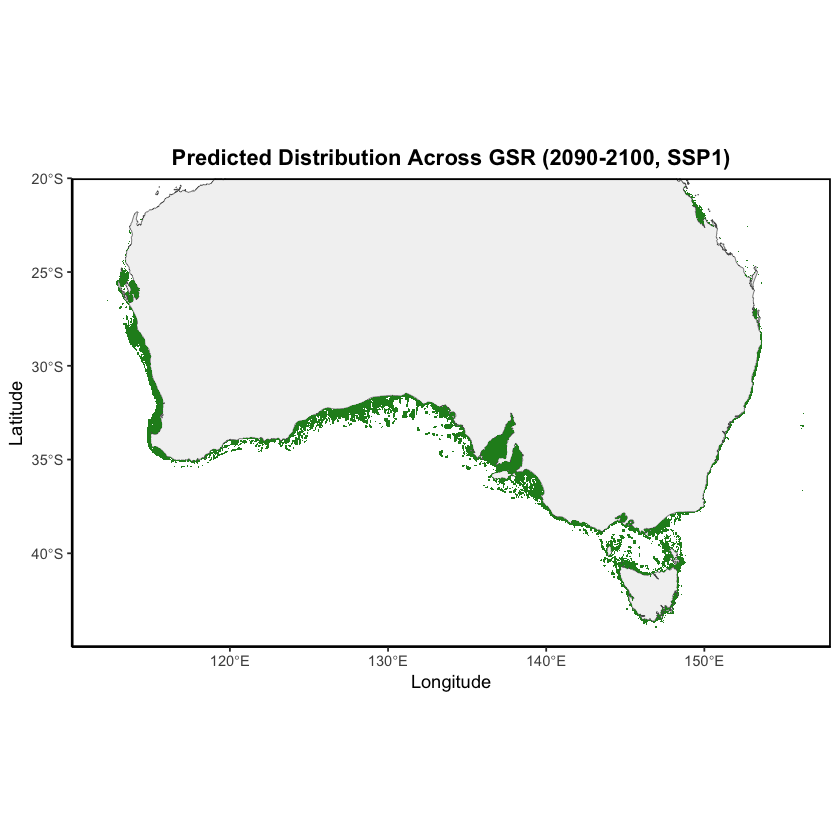

In [214]:
# Use the plot_thresholded_map function
rfThresh_2090ssp1 <- plot_thresholded_map(model_pred = rf_2090ssp1, 
                                           threshold = rf_threshold,
                                           year_range = "2090-2100, SSP1")

**Step 4:** Use the plot_rf_map function. Remember this map needs to be interpreted alongside the bathymetry map to determine where ecklonia radiata could actually be present.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


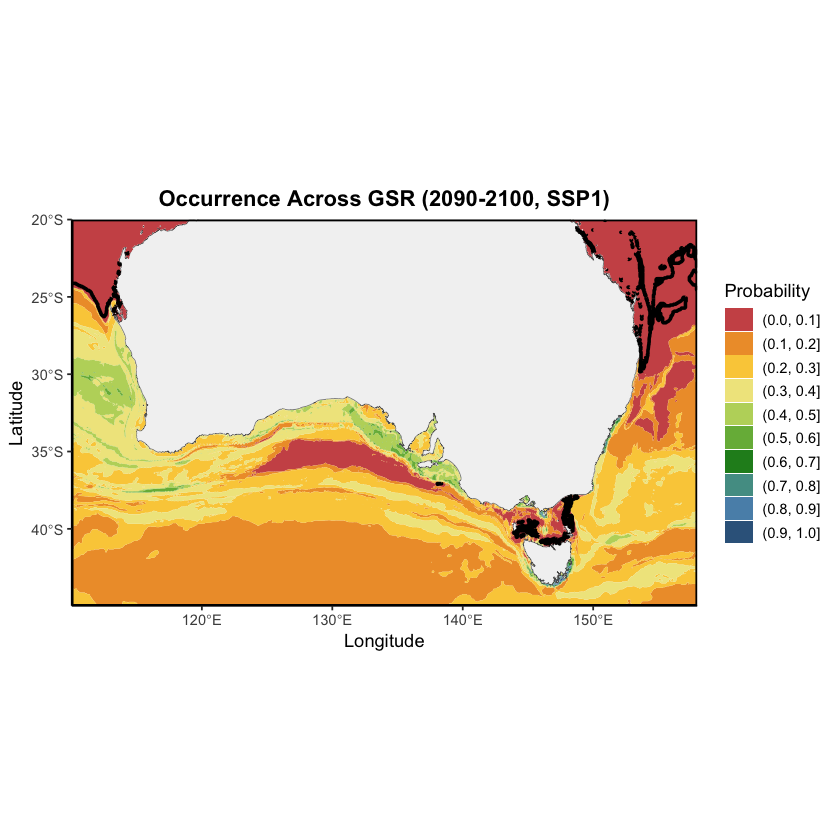

In [215]:
occur_rf_2090ssp1 <- plot_rf_map(env_data = env_2090ssp1,
                                 year_range = "2090-2100, SSP1")
occur_rf_2090ssp1

### Habitat Loss 2090 SSP1

Calculate habitat loss relative to 2010.

In [216]:
loss_rf_2090ssp1 <- habitat_loss(model_pred = rf_2090ssp1,
                                 threshold = rf_threshold,
                                 cover_2010 = cover_rf_2010)
loss_rf_2090ssp1

[1] -0.6532823

## **2040-2050 SSP2**

### Maps for 2040 SSP2

**Step 1:** Predict the probabiltiy of occurence across the GSR using the predict_rf function.

In [217]:
# use predict_rf function
rf_2040ssp2 <- predict_rf(env_data = env_2040ssp2)

**Step 2:** Map the probabiltiy of occurence across the GSR using the plot_masked_map function.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


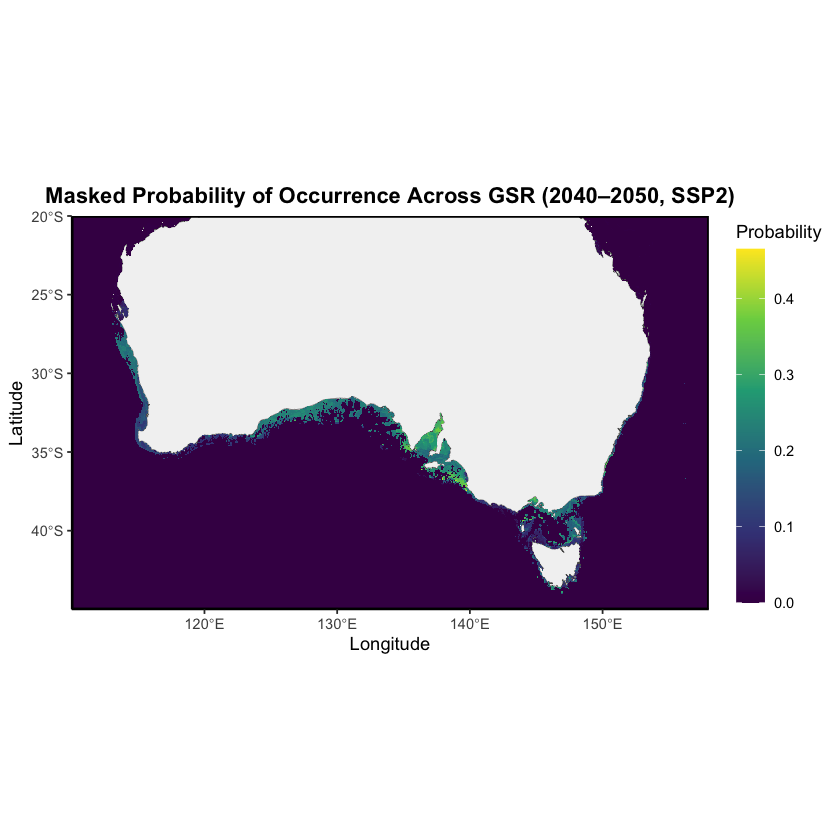

In [218]:
# Use plot_masked_map function
rfDist_2040ssp2 <- plot_masked_map(model_pred = rf_2040ssp2, 
                                   year_range = "2040–2050, SSP2")

**Step 3:** Plot the predicted distribution across the GSR using the plot_thresholded_map function

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


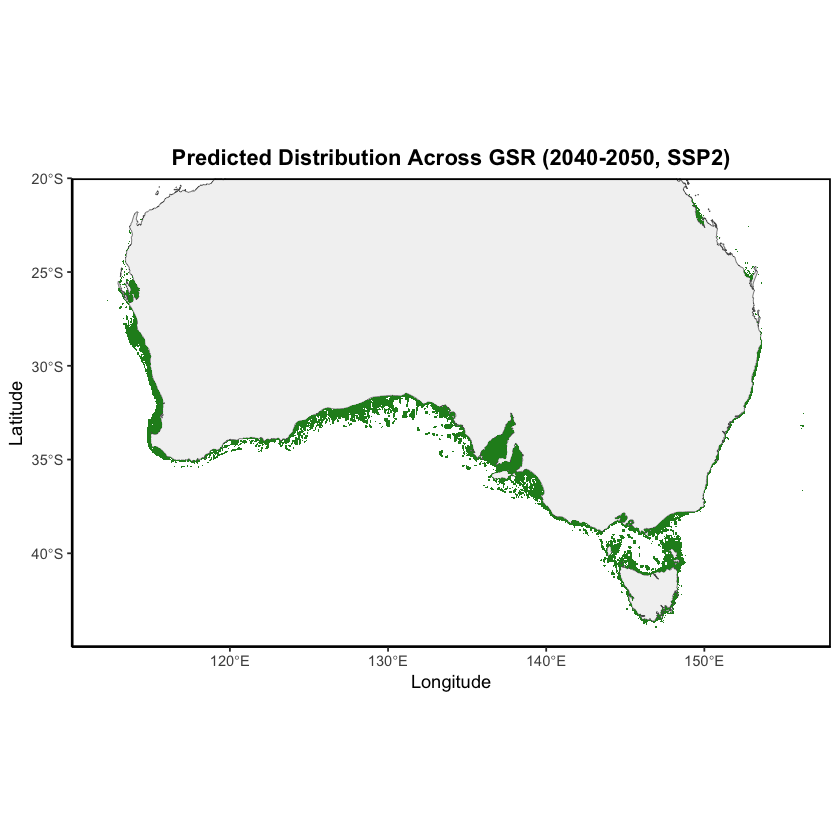

In [219]:
# Use the plot_thresholded_map function
rfThresh_2040ssp2 <- plot_thresholded_map(model_pred = rf_2040ssp2, 
                                           threshold = rf_threshold,
                                           year_range = "2040-2050, SSP2")

**Step 4:** Use the plot_rf_map function. Remember this map needs to be interpreted alongside the bathymetry map to determine where ecklonia radiata could actually be present.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


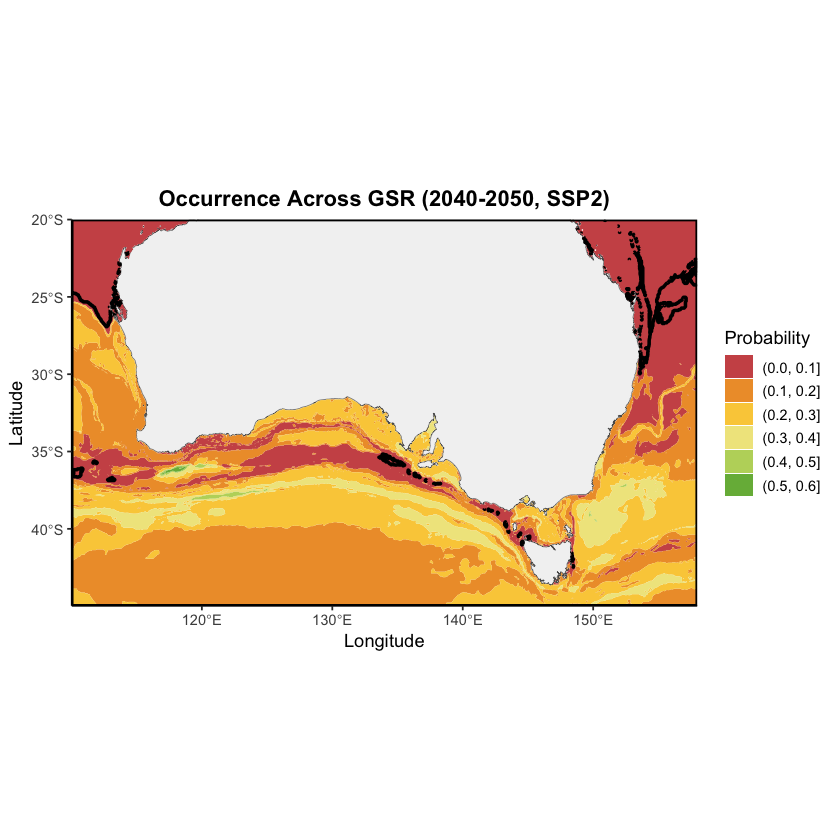

In [220]:
occur_rf_2040ssp2 <- plot_rf_map(env_data = env_2040ssp2,
                                 year_range = "2040-2050, SSP2")
occur_rf_2040ssp2

### Habitat Loss 2040 SSP2

Calculate habitat loss relative to 2010.

In [221]:
loss_rf_2040ssp2 <- habitat_loss(model_pred = rf_2040ssp2,
                                 threshold = rf_threshold,
                                 cover_2010 = cover_rf_2010)
loss_rf_2040ssp2

[1] -1.290631

## **2090-2100 SSP2**

### Maps for 2090 SSP2

**Step 1:** Predict the probabiltiy of occurence across the GSR using the predict_rf function.

In [222]:
# use predict_rf function
rf_2090ssp2 <- predict_rf(env_data = env_2090ssp2)

**Step 2:** Map the probabiltiy of occurence across the GSR using the plot_masked_map function.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


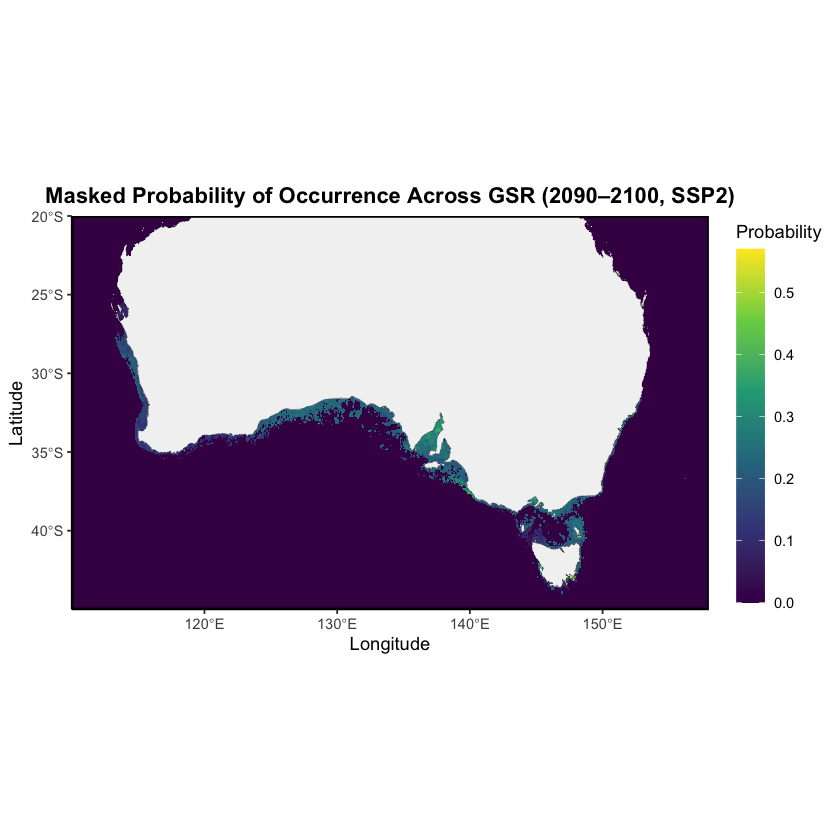

In [223]:
# Use plot_masked_map function
rfDist_2090ssp2 <- plot_masked_map(model_pred = rf_2090ssp2, 
                                   year_range = "2090–2100, SSP2")

**Step 3:** Plot the predicted distribution across the GSR using the plot_thresholded_map function

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


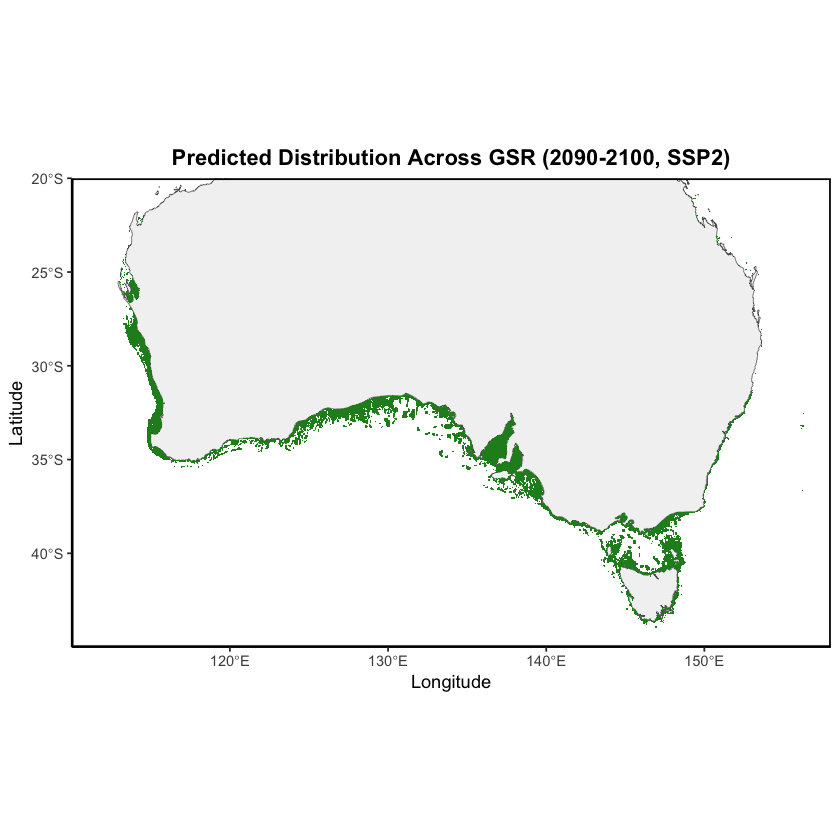

In [224]:
# Use the plot_thresholded_map function
rfThresh_2090ssp2 <- plot_thresholded_map(model_pred = rf_2090ssp2, 
                                           threshold = rf_threshold,
                                           year_range = "2090-2100, SSP2")

**Step 4:** Use the plot_rf_map function. Remember this map needs to be interpreted alongside the bathymetry map to determine where ecklonia radiata could actually be present.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


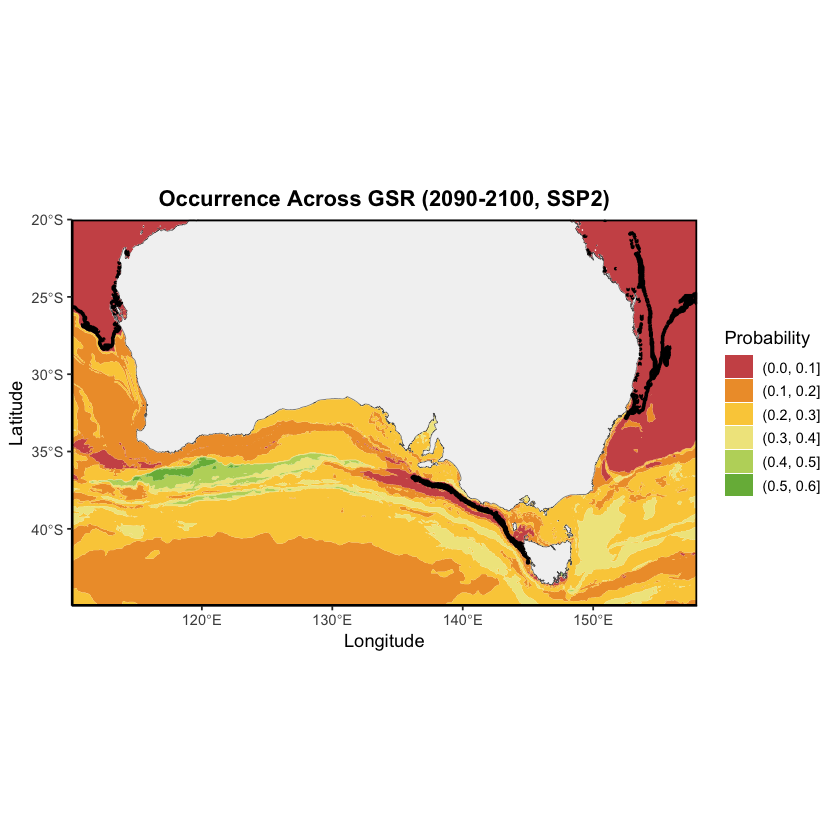

In [225]:
occur_rf_2090ssp2 <- plot_rf_map(env_data = env_2090ssp2,
                                 year_range = "2090-2100, SSP2")
occur_rf_2090ssp2

### Habitat Loss 2090 SSP2

Calculate habitat loss relative to 2010.

In [226]:
loss_rf_2090ssp2 <- habitat_loss(model_pred = rf_2090ssp2,
                                 threshold = rf_threshold,
                                 cover_2010 = cover_rf_2010)
loss_rf_2090ssp2

[1] 1.912046

## **2040-2050 SSP3**

### Maps for 2040 SSP3

**Step 1:** Predict the probabiltiy of occurence across the GSR using the predict_rf function.

In [227]:
# use predict_rf function
rf_2040ssp3 <- predict_rf(env_data = env_2040ssp3)

**Step 2:** Map the probabiltiy of occurence across the GSR using the plot_masked_map function.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


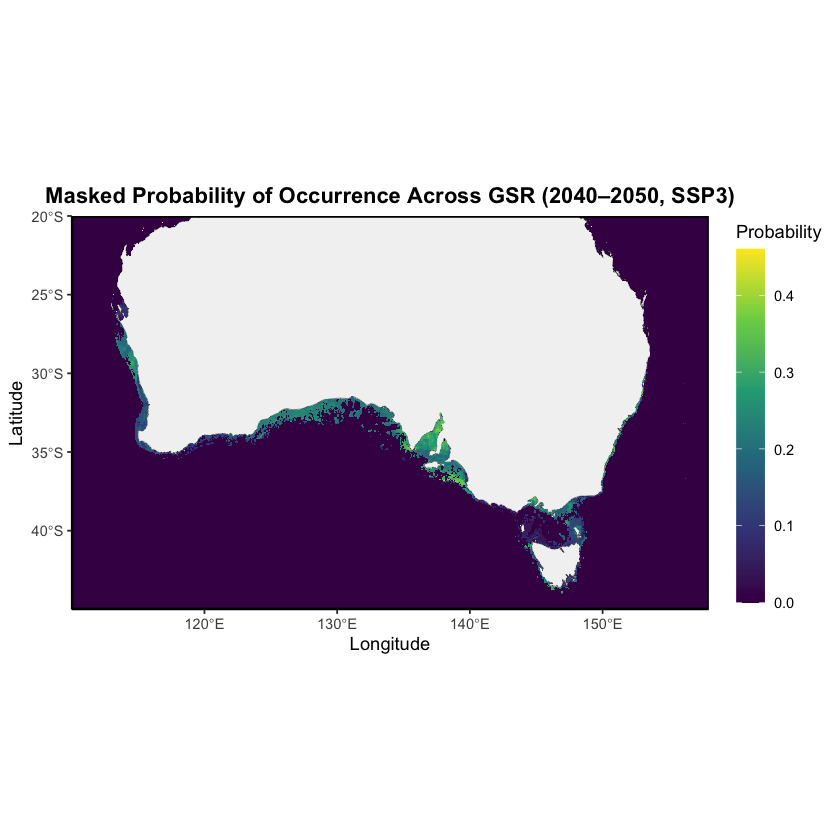

In [228]:
# Use plot_masked_map function
rfDist_2040ssp3 <- plot_masked_map(model_pred = rf_2040ssp3, 
                                   year_range = "2040–2050, SSP3")

**Step 3:** Plot the predicted distribution across the GSR using the plot_thresholded_map function

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


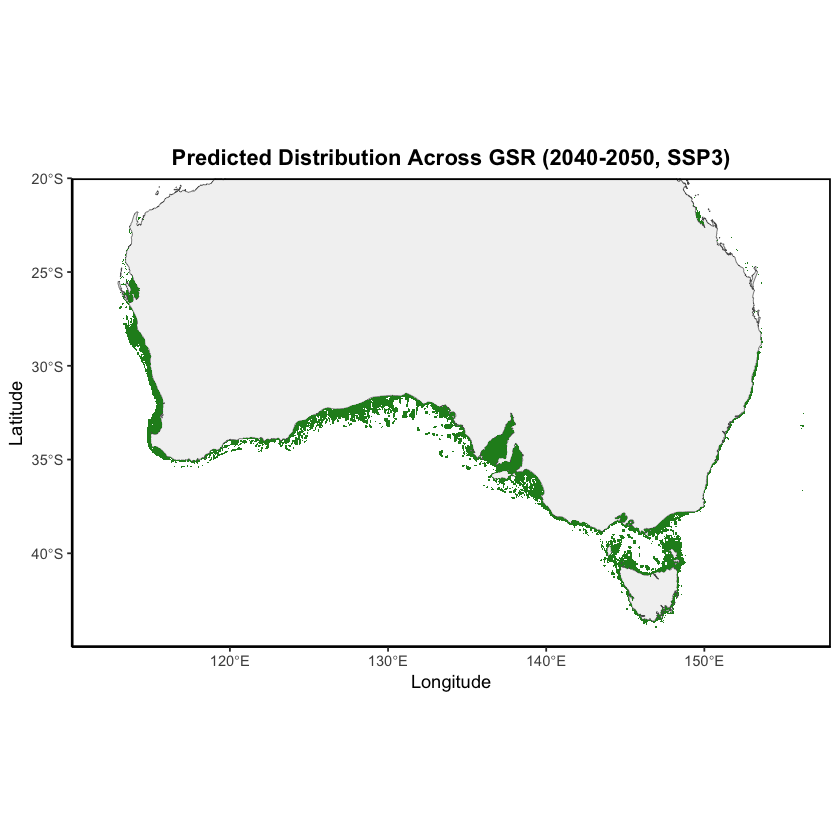

In [229]:
# Use the plot_thresholded_map function
rfThresh_2040ssp3 <- plot_thresholded_map(model_pred = rf_2040ssp3, 
                                           threshold = rf_threshold,
                                           year_range = "2040-2050, SSP3")

**Step 4:** Use the plot_rf_map function. Remember this map needs to be interpreted alongside the bathymetry map to determine where ecklonia radiata could actually be present.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


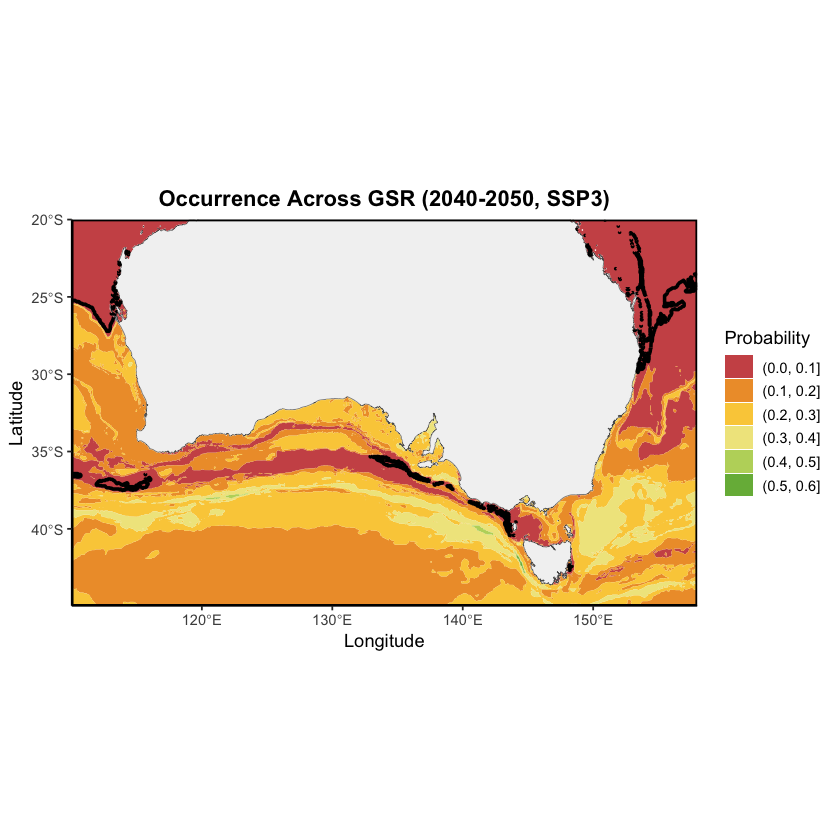

In [230]:
occur_rf_2040ssp3 <- plot_rf_map(env_data = env_2040ssp3,
                                 year_range = "2040-2050, SSP3")
occur_rf_2040ssp3

### Habitat Loss 2040 SSP3

Calculate habitat loss relative to 2010.

In [231]:
loss_rf_2040ssp3 <- habitat_loss(model_pred = rf_2040ssp3,
                                 threshold = rf_threshold,
                                 cover_2010 = cover_rf_2010)
loss_rf_2040ssp3

[1] 0.1593372

## **2090-2100 SSP3**

### Maps for 2090 SSP3

**Step 1:** Predict the probabiltiy of occurence across the GSR using the predict_rf function.

In [232]:
# use predict_rf function
rf_2090ssp3 <- predict_rf(env_data = env_2090ssp3)

**Step 2:** Map the probabiltiy of occurence across the GSR using the plot_masked_map function.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


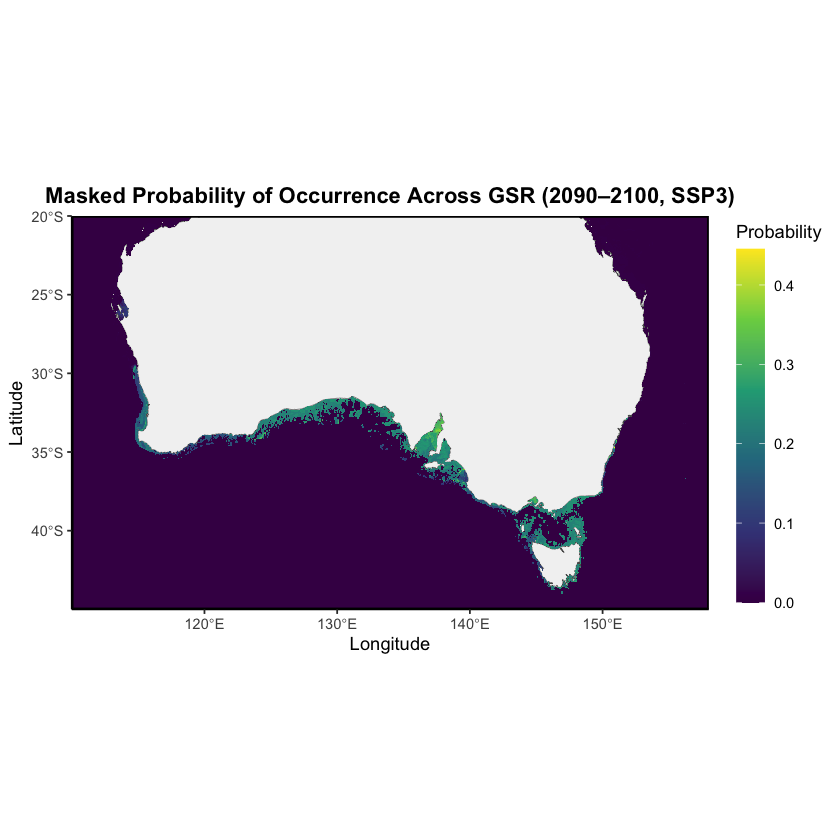

In [233]:
# Use plot_masked_map function
rfDist_2090ssp3 <- plot_masked_map(model_pred = rf_2090ssp3, 
                                   year_range = "2090–2100, SSP3")

**Step 3:** Plot the predicted distribution across the GSR using the plot_thresholded_map function

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


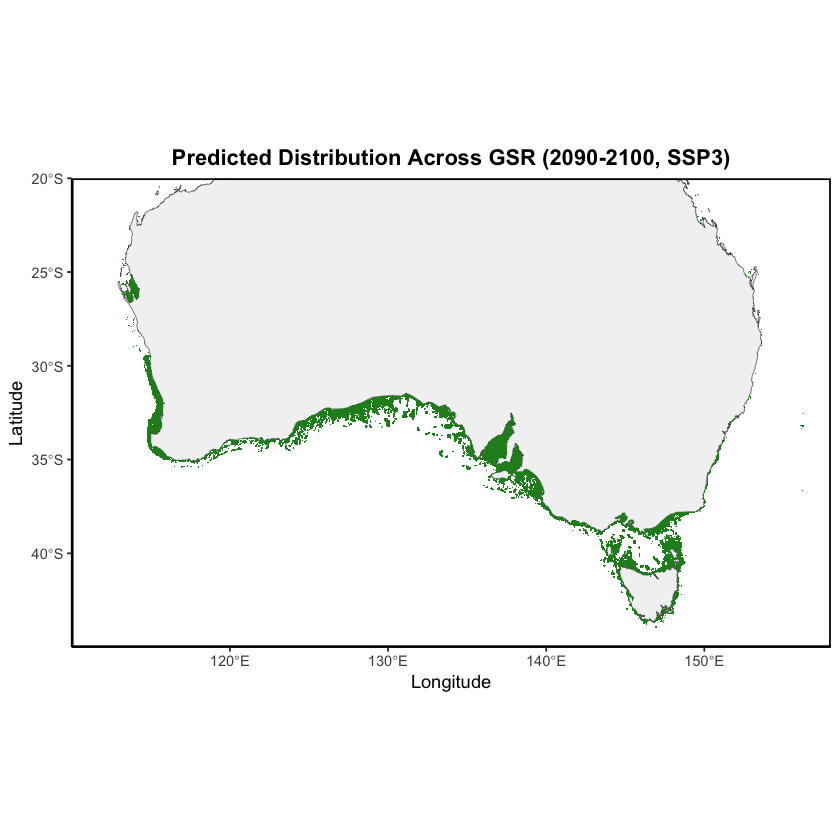

In [234]:
# Use the plot_thresholded_map function
rfThresh_2090ssp3 <- plot_thresholded_map(model_pred = rf_2090ssp3, 
                                           threshold = rf_threshold,
                                           year_range = "2090-2100, SSP3")

**Step 4:** Use the plot_rf_map function. Remember this map needs to be interpreted alongside the bathymetry map to determine where ecklonia radiata could actually be present.

Coordinate system already present. Adding new coordinate system, which will
replace the existing one.
Coordinate system already present. Adding new coordinate system, which will
replace the existing one.


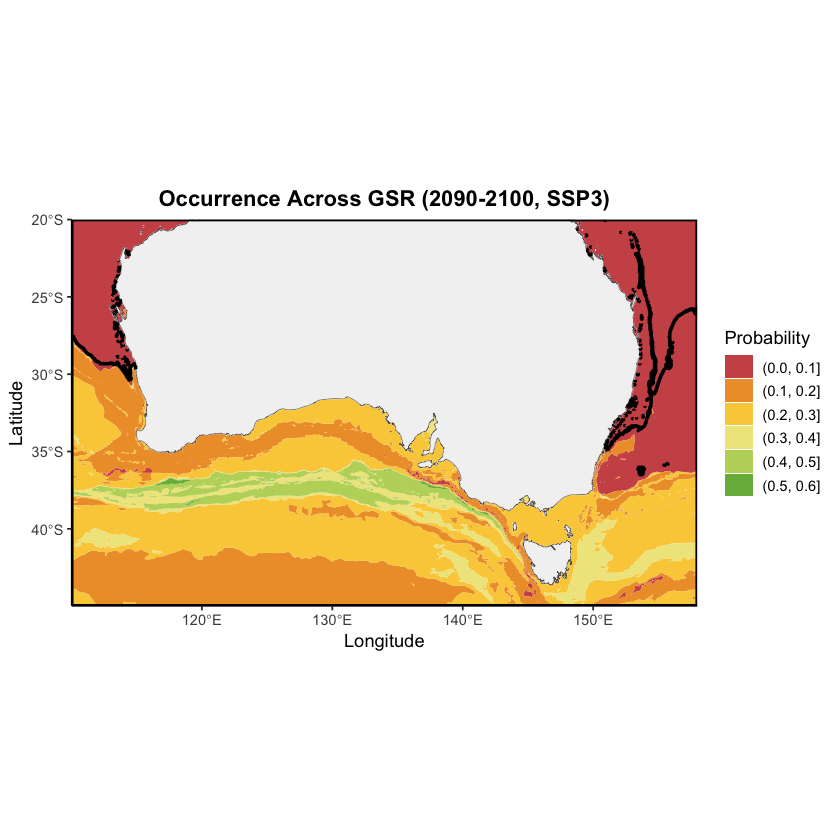

In [235]:
occur_rf_2090ssp3 <- plot_rf_map(env_data = env_2090ssp3,
                                 year_range = "2090-2100, SSP3")
occur_rf_2090ssp3

### Habitat Loss 2090 SSP3

Calculate habitat loss relative to 2010.

In [236]:
loss_rf_2090ssp3 <- habitat_loss(model_pred = rf_2090ssp3,
                                 threshold = rf_threshold,
                                 cover_2010 = cover_rf_2010)
loss_rf_2090ssp3

[1] 7.536648

# **Examine Environmental Data**

To better understand the output of our models, we should examine how the environmental data changes across time under different SSP scenarios.

## **Get Mean of Environmental Variables for Each Decade and SSP**

### Create Dataframe of Environmental Means

Create dataframes of the mean of the environmental variables across the GSR for each decade and SSP scenario.

In [237]:
library(tidyr)


Attaching package: ‘tidyr’


The following object is masked from ‘package:terra’:

    extract




In [238]:
# Mean of environmental variables in 2010-2020 across GSR
mean_gsr_2010 <- global(envdata_2010_gsr, "mean", na.rm = TRUE)

# Mean of environmental variables under SSP1 across GSR
mean_gsr_2040ssp1 <- global(env_2040ssp1, "mean", na.rm = TRUE)
mean_gsr_2090ssp1 <- global(env_2090ssp1, "mean", na.rm = TRUE)

# Mean of environmental variables under SSP2 across GSR
mean_gsr_2040ssp2 <- global(env_2040ssp2, "mean", na.rm = TRUE)
mean_gsr_2090ssp2 <- global(env_2090ssp2, "mean", na.rm = TRUE)

# Mean of environmental variables under SSP3 across GSR
mean_gsr_2040ssp3 <- global(env_2040ssp3, "mean", na.rm = TRUE)
mean_gsr_2090ssp3 <- global(env_2090ssp3, "mean", na.rm = TRUE)

In [239]:
# Check one of the dataframes
head(mean_gsr_2010)

,mean
,<dbl>
o2_mean,246.1295367
no3_mean,4.9054981
ph_mean,8.0712812
po4_mean,0.4494673
phyc_ltmax,2.5673144
phyc_ltmin,1.0842720


In [240]:
# Give each dataframe a year and scenario column
mean_gsr_2010_df <- data.frame(variable = rownames(mean_gsr_2010), mean_gsr_2010) %>%
    mutate(year = 2010) %>%
    expand_grid(scenario = c("SSP1", "SSP2", "SSP3")) # need to be able to link to SSP1, SSP2 and SSP3 scenarios

mean_gsr_2040ssp1_df <- data.frame(variable = rownames(mean_gsr_2040ssp1), mean_gsr_2040ssp1) %>%
    mutate(year = 2040, scenario = "SSP1")
mean_gsr_2090ssp1_df <- data.frame(variable = rownames(mean_gsr_2090ssp1), mean_gsr_2090ssp1) %>%
    mutate(year = 2090, scenario = "SSP1")

mean_gsr_2040ssp2_df <- data.frame(variable = rownames(mean_gsr_2040ssp2), mean_gsr_2040ssp2) %>%
    mutate(year = 2040, scenario = "SSP2")
mean_gsr_2090ssp2_df <- data.frame(variable = rownames(mean_gsr_2090ssp2), mean_gsr_2090ssp2) %>%
    mutate(year = 2090, scenario = "SSP2")

mean_gsr_2040ssp3_df <- data.frame(variable = rownames(mean_gsr_2040ssp3), mean_gsr_2040ssp3) %>%
    mutate(year = 2040, scenario = "SSP3")
mean_gsr_2090ssp3_df <- data.frame(variable = rownames(mean_gsr_2090ssp3), mean_gsr_2090ssp3) %>%
    mutate(year = 2090, scenario = "SSP3")

In [241]:
# Check the 2010 dataframe
head(mean_gsr_2010_df)

variable,mean,year,scenario
<chr>,<dbl>,<dbl>,<chr>
o2_mean,246.129537,2010,SSP1
o2_mean,246.129537,2010,SSP2
o2_mean,246.129537,2010,SSP3
no3_mean,4.905498,2010,SSP1
no3_mean,4.905498,2010,SSP2
no3_mean,4.905498,2010,SSP3


In [242]:
# Check the 2040 SSP1 dataframe
head(mean_gsr_2040ssp1_df)

,variable,mean,year,scenario
,<chr>,<dbl>,<dbl>,<chr>
o2_mean,o2_mean,244.3789878,2040,SSP1
no3_mean,no3_mean,4.7879054,2040,SSP1
ph_mean,ph_mean,8.0369942,2040,SSP1
po4_mean,po4_mean,0.4440585,2040,SSP1
phyc_ltmax,phyc_ltmax,2.6563987,2040,SSP1
phyc_ltmin,phyc_ltmin,1.0748874,2040,SSP1


In [243]:
# Combine into a single dataframe
env_means <- bind_rows(mean_gsr_2010_df,
                       mean_gsr_2040ssp1_df, mean_gsr_2090ssp1_df,
                       mean_gsr_2040ssp2_df, mean_gsr_2090ssp2_df,
                       mean_gsr_2040ssp3_df, mean_gsr_2090ssp3_df)

# Check structure of dataframe
head(env_means)

variable,mean,year,scenario
<chr>,<dbl>,<dbl>,<chr>
o2_mean,246.129537,2010,SSP1
o2_mean,246.129537,2010,SSP2
o2_mean,246.129537,2010,SSP3
no3_mean,4.905498,2010,SSP1
no3_mean,4.905498,2010,SSP2
no3_mean,4.905498,2010,SSP3


### Generate Graphs

Generate graphs for mean environmental conditions across the GSR over time under each SSP scenario.

In [244]:
# Create a function to generate the graphs
env_plots <- function(variable_name, graph_title) {

    # Filter the env_means dataframe for the variable of interest
    filtered_envvar <- env_means %>% filter(variable == variable_name)

    # Plot the environmental variable across time, by SSP scenario
    ggplot(filtered_envvar, aes(x = year, 
                                y = mean,
                                colour = scenario, # Colour of each line depends on the scenario 
                                group = scenario)) + # Group by scenario
        geom_line(linewidth = 1.2) +
        geom_point(size = 3) +
        scale_x_continuous(breaks = c(2010, 2040, 2090)) + # Set x-axis labels
        scale_colour_manual(values = c("forestgreen", "dodgerblue", "mediumvioletred")) + # Change colour of lines
        labs(title = graph_title,
             x = "Decade",
             y = variable_name,
             colour = "SSP Scenario") +
        theme_classic() +
        theme(plot.title = element_text(hjust = 0.5, face = "bold"),
              legend.title = element_text(face = "bold"))
    }

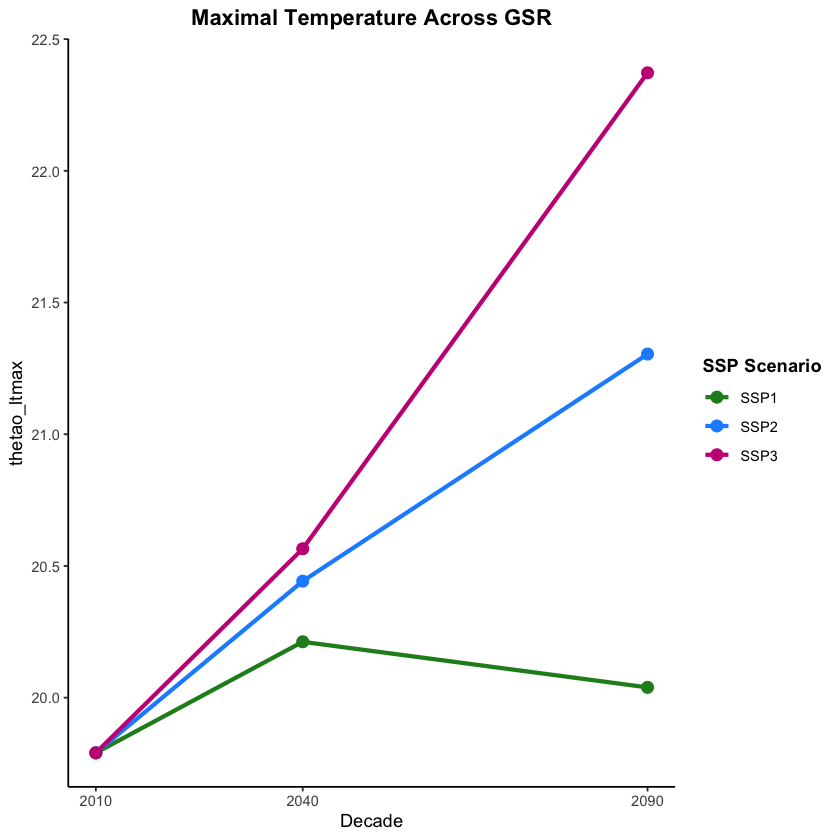

In [245]:
# Plot thetao_ltmax
env_plots(variable_name = "thetao_ltmax", 
          graph_title = "Maximal Temperature Across GSR")

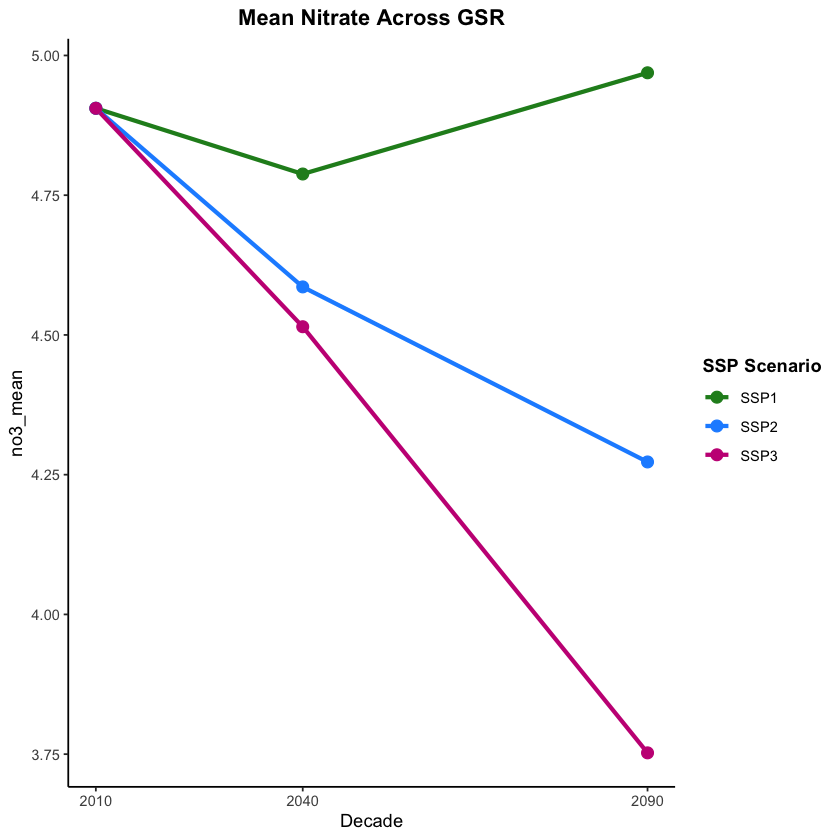

In [246]:
# Plot no3_mean
env_plots(variable_name = "no3_mean", 
          graph_title = "Mean Nitrate Across GSR")

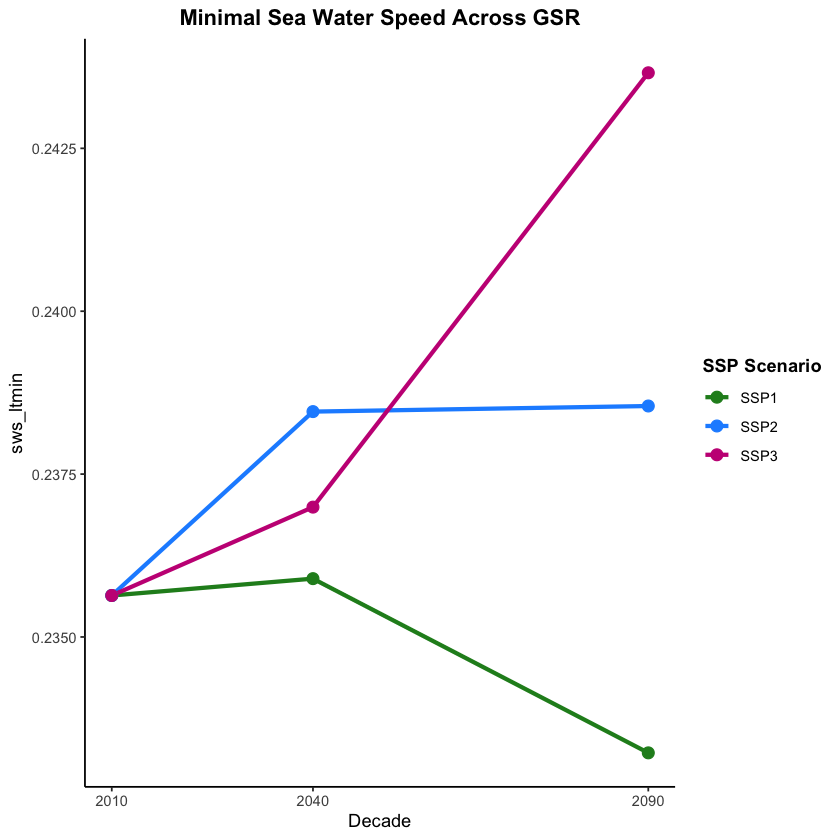

In [247]:
# Plot sws_ltmin
env_plots(variable_name = "sws_ltmin", 
          graph_title = "Minimal Sea Water Speed Across GSR")

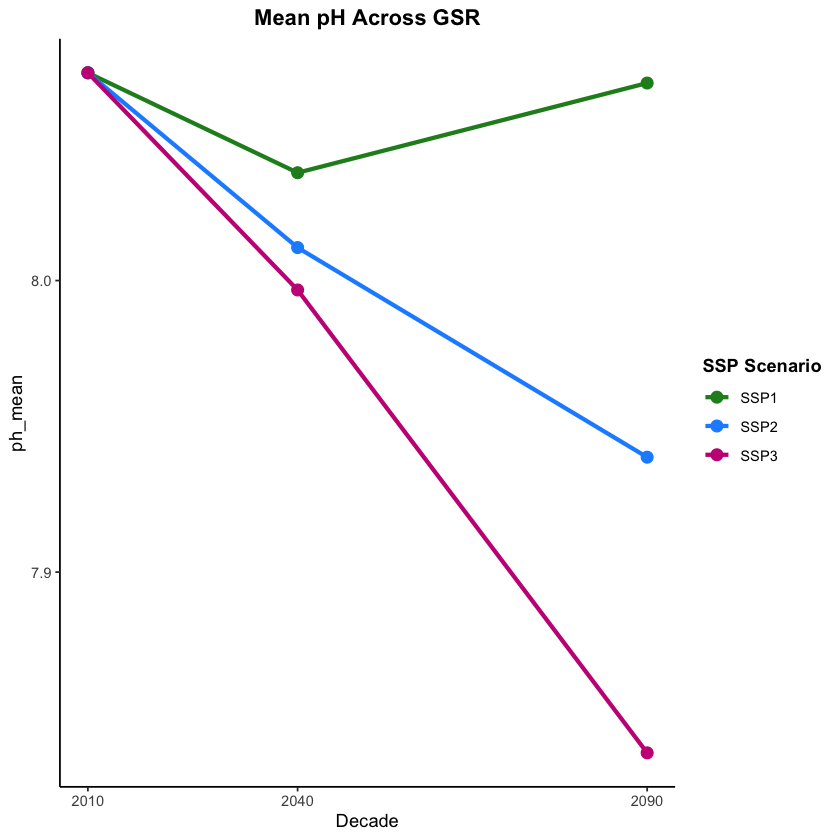

In [248]:
# Plot ph_mean
env_plots(variable_name = "ph_mean", 
          graph_title = "Mean pH Across GSR")

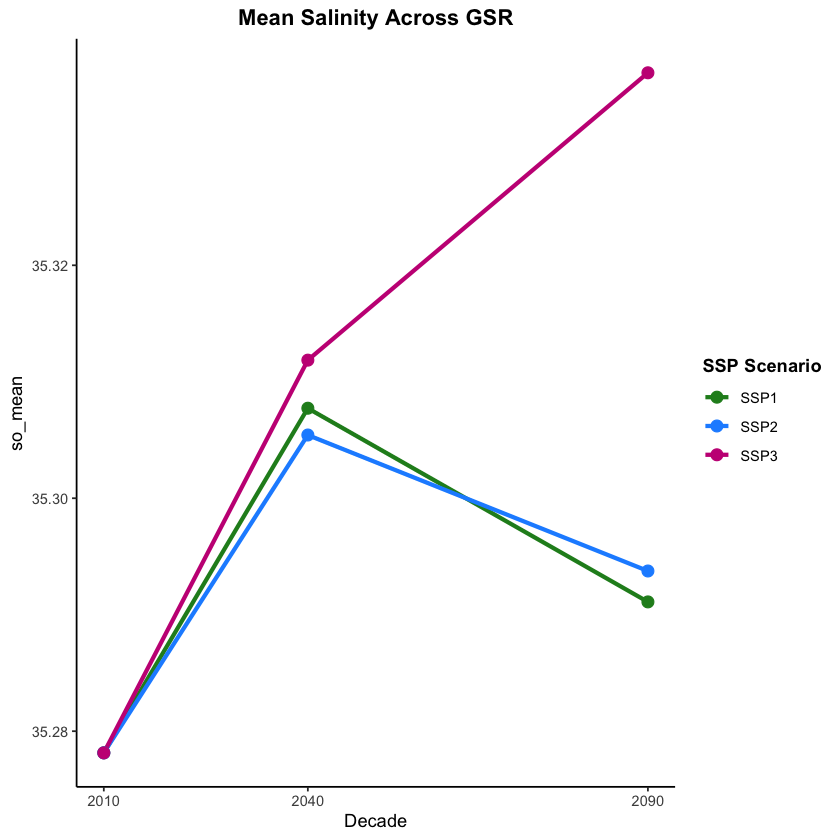

In [249]:
# Plot so_mean
env_plots(variable_name = "so_mean", 
          graph_title = "Mean Salinity Across GSR")